In [1]:
import datetime as dt
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import math
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler, StandardScaler

import argparse
import logging
import os
import time
import random
from collections import namedtuple
from typing import Optional, Union
import torch
import torch.nn.functional as F
import torch.nn.init as init
from torch import nn, optim, distributions
import torch.backends.cudnn as cudnn
import tqdm
from scipy.stats import levy_stable
import torchsde
#画热图
import seaborn as sns

In [2]:
def setup_seed(seed):
      torch.manual_seed(seed)
      torch.cuda.manual_seed_all(seed)
      np.random.seed(seed)
      # random.seed(seed)
      torch.backends.cudnn.deterministic = True

In [3]:
setup_seed(36)

In [4]:
data = pd.read_csv("SZNY.csv")

In [5]:
data

,Unnamed: 0,open,close,high,low,volume,date
0,2009/1/9,1690.11,1727.01,1736.81,1690.11,359047000,2009/1/9
1,2009/1/12,1717.08,1715.86,1750.63,1699.80,368549600,2009/1/12
2,2009/1/13,1697.11,1667.97,1697.70,1667.64,275230800,2009/1/13
3,2009/1/14,1664.33,1750.08,1750.60,1664.33,362291600,2009/1/14
4,2009/1/15,1729.16,1739.64,1760.49,1721.28,434220600,2009/1/15
...,...,...,...,...,...,...,...
3081,2021/9/8,1649.46,1684.88,1706.39,1641.30,3386234900,2021/9/8
3082,2021/9/9,1703.47,1781.67,1801.80,1689.20,4390856100,2021/9/9
3083,2021/9/10,1754.96,1723.91,1785.68,1716.14,4661665500,2021/9/10
3084,2021/9/13,1737.04,1822.08,1836.49,1737.04,4234321000,2021/9/13


In [6]:
data=data[['date','open','close','high','low','volume']]

In [7]:
data

,date,open,close,high,low,volume
0,2009/1/9,1690.11,1727.01,1736.81,1690.11,359047000
1,2009/1/12,1717.08,1715.86,1750.63,1699.80,368549600
2,2009/1/13,1697.11,1667.97,1697.70,1667.64,275230800
3,2009/1/14,1664.33,1750.08,1750.60,1664.33,362291600
4,2009/1/15,1729.16,1739.64,1760.49,1721.28,434220600
...,...,...,...,...,...,...
3081,2021/9/8,1649.46,1684.88,1706.39,1641.30,3386234900
3082,2021/9/9,1703.47,1781.67,1801.80,1689.20,4390856100
3083,2021/9/10,1754.96,1723.91,1785.68,1716.14,4661665500
3084,2021/9/13,1737.04,1822.08,1836.49,1737.04,4234321000


In [8]:
data.set_index(pd.Index(np.linspace(1, len(data.index), len(data.index), dtype = int)))
data['date']= pd.to_datetime(data['date']) 
data.head()

<ipython-input-8-63f075f7c65e>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['date']= pd.to_datetime(data['date'])


,date,open,close,high,low,volume
0,2009-01-09,1690.11,1727.01,1736.81,1690.11,359047000
1,2009-01-12,1717.08,1715.86,1750.63,1699.80,368549600
2,2009-01-13,1697.11,1667.97,1697.70,1667.64,275230800
3,2009-01-14,1664.33,1750.08,1750.60,1664.33,362291600
4,2009-01-15,1729.16,1739.64,1760.49,1721.28,434220600


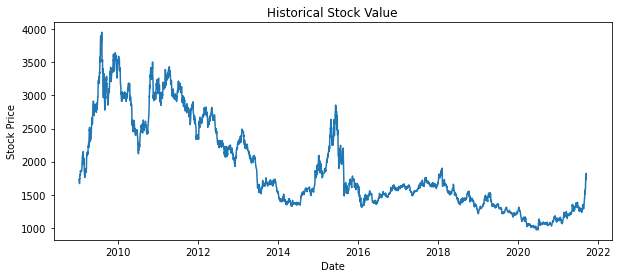

In [9]:
# Visualize the plot
plt.figure(figsize=(10,4))
plt.plot(data['date'],data['close'])
plt.title('Historical Stock Value')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.show()

# Data Cleaning and Splitting

In [10]:
# Create new dataframe with only relevant columns
stk_data = pd.DataFrame(columns = ['Date', 'Open', 'High', 'Low', 'Close'])
stk_data['Date'] = data['date']
stk_data['Open'] = data['open']
stk_data['High'] = data['high']
stk_data['Low'] = data['low']
stk_data['Close'] = data['close']
stk_data.head()

,Date,Open,High,Low,Close
0,2009-01-09,1690.11,1736.81,1690.11,1727.01
1,2009-01-12,1717.08,1750.63,1699.80,1715.86
2,2009-01-13,1697.11,1697.70,1667.64,1667.97
3,2009-01-14,1664.33,1750.60,1664.33,1750.08
4,2009-01-15,1729.16,1760.49,1721.28,1739.64


In [11]:
# Define the training set
percent_training: float = 0.80
num_training_samples = int(np.ceil(percent_training*len(stk_data))) # number of training samples in int
training_set = stk_data.iloc[:num_training_samples, 4:5].values # Extract the Close values for training data

In [12]:
#Define the test data
num_testing_samples: int = len(stk_data) - num_training_samples # number of test samples in int 
testing_set = stk_data.iloc[-num_testing_samples:, 4:5].values # Extract the Close values for test data

In [13]:
print('Training set shape:', training_set.shape, '\n', 'Testing set shape:', testing_set.shape)

Training set shape: (2469, 1) 
 Testing set shape: (617, 1)


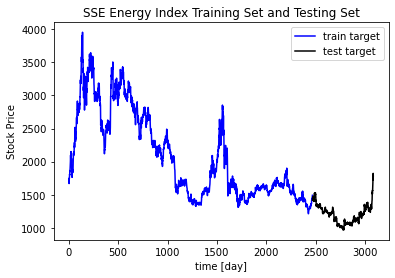

In [16]:
## show predictions
plt.figure(figsize=(6, 4))
plt.plot(np.arange(training_set.shape[0]), training_set, color='blue', label='train target')
plt.plot(np.arange(training_set.shape[0],training_set.shape[0]+testing_set.shape[0]),testing_set, color='black', label='test target')
plt.title('SSE Energy Index Training Set and Testing Set')
plt.xlabel('time [day]')
plt.ylabel('Stock Price')
plt.legend(loc='best');

In [15]:
# Scale training data
scaler = StandardScaler()
training_set_scaled = scaler.fit_transform(training_set) #2D (num_training_samples, 1)
testing_set_scaled = scaler.transform(testing_set) # 2D ndarray (num_testing_samples, 1)

In [16]:
#training data 处理
training_set_scaled1=training_set_scaled.flatten()#将数组降一维
training_set_scaled2=pd.DataFrame(columns=["closescale"],data=training_set_scaled1)#将array转为dataframe
training_set_scaled21=stk_data.loc[0:(len(training_set_scaled2)-1),'Date'].to_frame()#提取相应日期

In [17]:
training_set_scaled3= pd.concat([training_set_scaled21,training_set_scaled2],axis=1)

In [18]:
#testing data 处理
testing_set_scaled1=testing_set_scaled.flatten()#将数组降一维
testing_set_scaled2=pd.DataFrame(columns=["closescale"],data=testing_set_scaled1)#将array转为dataframe
testing_set_scaled21=stk_data.loc[len(training_set_scaled3):,'Date'].to_frame()#提取相应日期

In [19]:
testing_set_scaled21=pd.DataFrame(columns=["Date"],data=testing_set_scaled21.values)
testing_set_scaled3= pd.concat([testing_set_scaled21,testing_set_scaled2],axis=1)

In [20]:
training_set_scaled2.to_csv('trainingshuchuszny.csv',encoding='gbk')
testing_set_scaled2.to_csv('testingshuchuszny.csv',encoding='gbk')

# 利用相空间重构方法创建数据

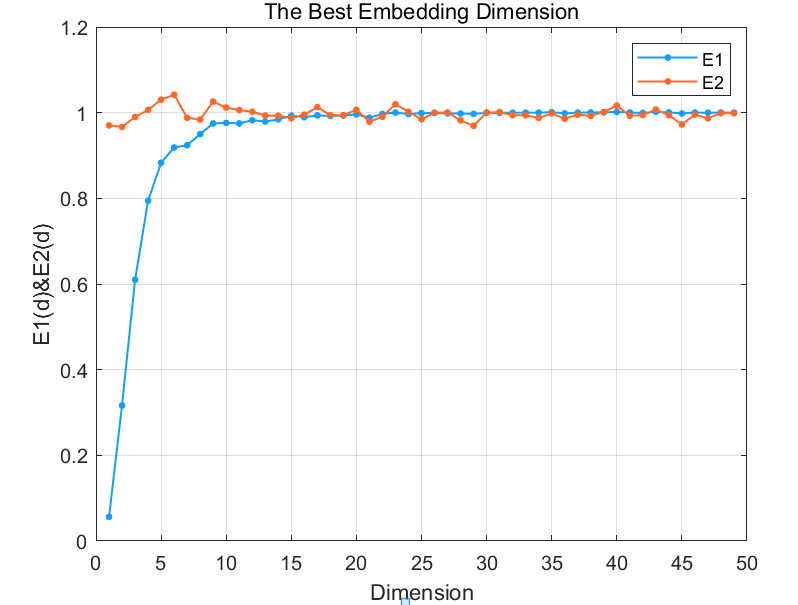!

相空间重构数据

In [21]:
# data为时间序列，tau为重构的时延，d为重构的维数，T为直接预测的步数
def PhaSpaRecon(df,tau,d,T):
    data = np.array(df)[:, 1]
    date = np.array(df)[:, 0]
    lens = len(data)
    if (lens - T - (d-1) * tau) < 1:
        print("error: delay time or the embedding dimension is too large")
    else:
        Xn1 = np.zeros((d, lens-(d-1)*tau-1))
        for i in range(0, d):
            Xn1[i, :] = data[i*tau:i*tau+lens-(d-1)*tau-1]
            # for j in range(i*tau, i*tau+lens-(d-1)*tau-1):
            #     Xn[i, j] = data[j]
        Yn1 = data[(T+(d-1)*tau):T+(d-1)*tau+lens-(d-1)*tau-1]
        Yn1_date = date[(T+(d-1)*tau):T+(d-1)*tau+lens-(d-1)*tau-1]
        Yn = Yn1.reshape((len(Yn1), 1))
        Yn_date = Yn1_date.reshape((len(Yn1_date), 1))
        Yn = pd.DataFrame(Yn)
        Yn_date = pd.DataFrame(Yn_date)
        Y = pd.concat([Yn_date, Yn],axis=1)
        Xn = Xn1.T #reshape((Xn1.shape[1], Xn1.shape[0]))
        Xn = pd.DataFrame(Xn)
        X = pd.concat([Xn, Yn],axis=1)
    return Xn, Yn, Y, X

In [22]:
Xn, Yn,Y,X = PhaSpaRecon(training_set_scaled3, tau=1, d=20, T=1)

In [23]:
Xn

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-0.555547,-0.572653,-0.646126,-0.520152,-0.536170,-0.481583,-0.443611,-0.429220,-0.446511,-0.345130,-0.373268,-0.360963,-0.312084,-0.268865,-0.265014,-0.148031,-0.049458,0.011158,-0.034531,-0.121719
1,-0.572653,-0.646126,-0.520152,-0.536170,-0.481583,-0.443611,-0.429220,-0.446511,-0.345130,-0.373268,-0.360963,-0.312084,-0.268865,-0.265014,-0.148031,-0.049458,0.011158,-0.034531,-0.121719,-0.029882
2,-0.646126,-0.520152,-0.536170,-0.481583,-0.443611,-0.429220,-0.446511,-0.345130,-0.373268,-0.360963,-0.312084,-0.268865,-0.265014,-0.148031,-0.049458,0.011158,-0.034531,-0.121719,-0.029882,0.095907
3,-0.520152,-0.536170,-0.481583,-0.443611,-0.429220,-0.446511,-0.345130,-0.373268,-0.360963,-0.312084,-0.268865,-0.265014,-0.148031,-0.049458,0.011158,-0.034531,-0.121719,-0.029882,0.095907,0.021698
4,-0.536170,-0.481583,-0.443611,-0.429220,-0.446511,-0.345130,-0.373268,-0.360963,-0.312084,-0.268865,-0.265014,-0.148031,-0.049458,0.011158,-0.034531,-0.121719,-0.029882,0.095907,0.021698,-0.197110
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2444,-1.221806,-1.218507,-1.215868,-1.227099,-1.213966,-1.194144,-1.180183,-1.156801,-1.133681,-1.137961,-1.160115,-1.114749,-1.123294,-1.106863,-1.116743,-1.104853,-1.012295,-1.001494,-1.002414,-1.004041
2445,-1.218507,-1.215868,-1.227099,-1.213966,-1.194144,-1.180183,-1.156801,-1.133681,-1.137961,-1.160115,-1.114749,-1.123294,-1.106863,-1.116743,-1.104853,-1.012295,-1.001494,-1.002414,-1.004041,-0.980168
2446,-1.215868,-1.227099,-1.213966,-1.194144,-1.180183,-1.156801,-1.133681,-1.137961,-1.160115,-1.114749,-1.123294,-1.106863,-1.116743,-1.104853,-1.012295,-1.001494,-1.002414,-1.004041,-0.980168,-0.967649
2447,-1.227099,-1.213966,-1.194144,-1.180183,-1.156801,-1.133681,-1.137961,-1.160115,-1.114749,-1.123294,-1.106863,-1.116743,-1.104853,-1.012295,-1.001494,-1.002414,-1.004041,-0.980168,-0.967649,-0.965593


In [24]:
train= X.values
x_train1=train[:,0:20]
y_train1=train[:,20]

In [25]:
X1n, Y1n, Y1,X1 = PhaSpaRecon(testing_set_scaled3, tau=1, d=20, T=1)

In [26]:
test= X1.values
x_test1=test[:,0:20]
y_test1=test[:,20]

In [27]:
print('x_train1 shape:', x_train1.shape, '\n', 'x_test1 shape:', x_test1.shape, '\n', 'y_train1 shape:', y_train1.shape, '\n', 'y_test1 shape:', y_test1.shape)

x_train1 shape: (2449, 20) 
 x_test1 shape: (597, 20) 
 y_train1 shape: (2449,) 
 y_test1 shape: (597,)


In [28]:
ts_  = np.arange(0, y_train1.shape[0])
ts_ext_ = np.arange(y_train1.shape[0], y_train1.shape[0] + y_test1.shape[0])
ts_full_ = np.arange(0, y_train1.shape[0] + y_test1.shape[0])

In [29]:
# Since each year has 252 trading days on average
ts_ = ts_/252; ts_ext_ = ts_ext_/252; ts_full_ = ts_full_/252 # ts_[-1] = 4.44444, ts_ext_[-1] : 5.5555

print('ts_ shape:', ts_.shape, '\n', 'ts_ext_ shape:', ts_ext_.shape, '\n', 'ts_full_ shape:', ts_full_.shape)

ts_ shape: (2449,) 
 ts_ext_ shape: (597,) 
 ts_full_ shape: (3046,)


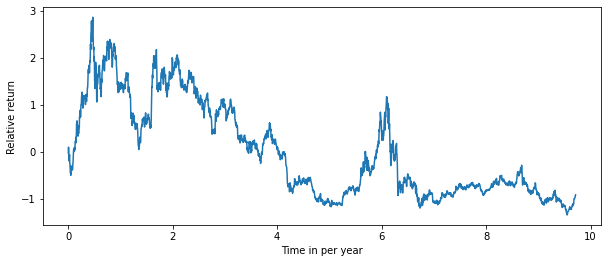

In [30]:
plt.figure(figsize = (10,4))
plt.plot(ts_, y_train1)
plt.xlabel('Time in per year')
plt.ylabel('Relative return')
plt.show()

In [31]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
xs_ = x_train1.astype(np.float64)
ys_ = y_train1.astype(np.float64)
xs_ext_ = x_test1.astype(np.float64)
ys_ext_ = y_test1.astype(np.float64)#object转float
xs = torch.tensor(xs_).float().to(device)
ys = torch.tensor(ys_).float().to(device)
# ys = ys.view(y_train.shape[0],1)
xs_ext = torch.tensor(xs_ext_).float().to(device)
ys_ext = torch.tensor(ys_ext_).float().to(device)

ts = torch.tensor(ts_).float().to(device)
ts = ts.view(ts_.shape[0],1)
ts_ext = torch.tensor(ts_ext_).float().to(device)
ts_ext = ts_ext.view(ts_ext_.shape[0],1)
ts_vis = ts_ext

In [32]:
Data = namedtuple('Data', ['ts_', 'ts_ext_', 'ts_vis_', 'ts', 'ts_ext', 'ts_vis', 'ys', 'ys_','ys_ext_'])

In [33]:
X21n, Y21n,Y21,X21 = PhaSpaRecon(training_set_scaled3, tau=1, d=20, T=2)
X22n, Y22n, Y22,X22 = PhaSpaRecon(testing_set_scaled3, tau=1, d=20, T=2)

In [34]:
train2= X21.values
train2=np.delete(train2,-1, axis=0)#减一是因为预测第二天T=2
x_train2=train2[:,0:20]
y_train2=train2[:,20]
test2= X22.values
test2=np.delete(test2,-1, axis=0)#减一是因为预测第二天T=2
x_test2=test2[:,0:20]
y_test2=test2[:,20]

In [35]:
X31n, Y31n,Y31,X31 = PhaSpaRecon(training_set_scaled3, tau=1, d=20, T=3)
X32n, Y32n, Y32,X32 = PhaSpaRecon(testing_set_scaled3, tau=1, d=20, T=3)

In [36]:
train3= X31.values
train3=np.delete(train3,[-1,-2], axis=0)#减一是因为预测第二天T=3
x_train3=train3[:,0:20]
y_train3=train3[:,20]
test3= X32.values
test3=np.delete(test3,[-1,-2], axis=0)#减一是因为预测第二天T=3
x_test3=test3[:,0:20]
y_test3=test3[:,20]

In [37]:
X41n, Y41n,Y41,X41 = PhaSpaRecon(training_set_scaled3, tau=1, d=20, T=4)
X42n, Y42n, Y42,X42 = PhaSpaRecon(testing_set_scaled3, tau=1, d=20, T=4)

In [38]:
train4= X41.values
train4=np.delete(train4,[-1,-2,-3], axis=0)#减一是因为预测第二天T=4
x_train4=train4[:,0:20]
y_train4=train4[:,20]
test4= X42.values
test4=np.delete(test4,[-1,-2,-3], axis=0)#减一是因为预测第二天T=4
x_test4=test4[:,0:20]
y_test4=test4[:,20]

# SDE Definition

In [39]:
sequence_length: int = 20
alpha, beta = 1.2, 0

In [40]:
__all__ = ['SDENet1']

class Drift1(nn.Module):
    def __init__(self):
        super(Drift1, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion1(nn.Module):
    def __init__(self):
        super(Diffusion1, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet1(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet1, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift1()
        self.diffusion = Diffusion1()
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out1=out
            Drift1=self.drift(t, out)
            return Drift1,Out1
            
        else:
            t = 0
            final_out1 = self.diffusion(t, out.detach())  
            return final_out1

def test():
    model = SDENet1(layer_depth=6)
    return model  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model1 = test()
    num_params = count_parameters(model1)
    print(num_params)

3041


In [41]:
__all__ = ['SDENet2']

class Drift2(nn.Module):
    def __init__(self):
        super(Drift2, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion2(nn.Module):
    def __init__(self):
        super(Diffusion2, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet2(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet2, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift2()
        self.diffusion = Diffusion2()
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
#        Out1=Out1.detach().numpy()#减一是因为预测后一天T=1和T=2差一天
#        Out1=np.delete(Out1,-1, axis=0)
#        Out1=torch.from_numpy(Out1)
#        out=torch.cat((out,Out1), 1)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out2=out
            Drift2=self.drift(t, out)
            return Drift2,Out2
            
        else:
            t = 0
            final_out2 = self.diffusion(t, out.detach())  
            return final_out2

def test():
    model2 = SDENet2(layer_depth=6)
    return model2  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model2 = test()
    num_params = count_parameters(model2)
    print(num_params)

3041


In [42]:
__all__ = ['SDENet3']

class Drift3(nn.Module):
    def __init__(self):
        super(Drift3, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion3(nn.Module):
    def __init__(self):
        super(Diffusion3, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet3(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet3, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift3()
        self.diffusion = Diffusion3()
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
#        Out2=Out2.detach().numpy()#减一是因为预测后一天T=2和T=3差一天
#        Out2=np.delete(Out2,-1, axis=0)
#        Out2=torch.from_numpy(Out2)
#        out=torch.cat((out,Out2), 1)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out3=out
            Drift3=self.drift(t, out)
            return Drift3,Out3
            
        else:
            t = 0
            final_out3 = self.diffusion(t, out.detach())  
            return final_out3

def test():
    model3 = SDENet3(layer_depth=6)
    return model3  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model3 = test()
    num_params = count_parameters(model3)
    print(num_params)

3041


In [43]:
__all__ = ['SDENet4']

class Drift4(nn.Module):
    def __init__(self):
        super(Drift4, self).__init__()
        self.fc = nn.Linear(sequence_length, sequence_length)          #线性层（全连接）
        self.relu = nn.ReLU(inplace=True)   #inplace = True 时,会修改输入对象的值,所以打印出对象存储地址相同，max(0,x)
    def forward(self, t, x):
        out = self.relu(self.fc(x))
        return out    



class Diffusion4(nn.Module):
    def __init__(self):
        super(Diffusion4, self).__init__()#super(Net, self).__init__()是指首先找到Net的父类（比如是类NNet），然后把类Net的对象self转换为类NNet的对象，然后“被转换”的类NNet对象调用自己的init函数
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(sequence_length, 100)
        self.fc2 = nn.Linear(100, 1)
    def forward(self, t, x):
        out = self.relu(self.fc1(x))
        out = self.fc2(out)
        out = torch.sigmoid(out)
        return out


    
class SDENet4(nn.Module):
    def __init__(self, layer_depth):
        super(SDENet4, self).__init__()
        self.layer_depth = layer_depth
        self.downsampling_layers = nn.Linear(sequence_length,sequence_length)
        self.drift = Drift4()
        self.diffusion = Diffusion4()
#        self.fc_layers = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(sequence_length, 8))#将激活层与线性层连接一起
        self.deltat = 1./self.layer_depth
        self.sigma = 0.5
    def forward(self, x, training_diffusion=False):
        out = self.downsampling_layers(x)
#        Out3=Out3.detach().numpy()#减一是因为预测后一天T=2和T=3差一天
#        Out3=np.delete(Out3,-1, axis=0)
#        Out3=torch.from_numpy(Out3)
#        out=torch.cat((out,Out3), 1)
        if not training_diffusion:     #如果training_diffusion是假的执行下面的程序
            t = 0
            diffusion_term = self.sigma*self.diffusion(t, out)
            for i in range(self.layer_depth):
                t = (float(i))/self.layer_depth
                out = out + self.drift(t, out)*self.deltat + diffusion_term*(self.deltat**(1/alpha))*torch.from_numpy(levy_stable.rvs(alpha, beta, size=sequence_length,scale=0.1)).to(x)####
            Out4=out
            Drift4=self.drift(t, out)
#            final_out4 = self.fc_layers(out) 
#            mean41 = final_out[:,0]
#            mean42 = final_out[:,1]
#            mean43 = final_out[:,2]
#            mean44 = final_out[:,3]
#            sigma41 = F.softplus(final_out[:,5])+1e-3
#            sigma42 = F.softplus(final_out[:,6])+1e-3
#            sigma43 = F.softplus(final_out[:,7])+1e-3
#            sigma44 = F.softplus(final_out[:,8])+1e-3
            return Drift4,Out4
            
        else:
            t = 0
            final_out4 = self.diffusion(t, out.detach())  
            return final_out4

def test():
    model4 = SDENet4(layer_depth=6)
    return model4  
 
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

if __name__ == '__main__':
    model4 = test()
    num_params = count_parameters(model4)
    print(num_params)

3041


# SDE_Regression

DataSet loading

In [44]:
X_train1 = torch.from_numpy(x_train1.astype(np.float64)).float()
X_test1 = torch.from_numpy(x_test1.astype(np.float64)).float()
Y_train1 = torch.from_numpy(y_train1.astype(np.float64)).float()
Y_test1 = torch.from_numpy(y_test1.astype(np.float64)).float()
print('X_train1.shape:', X_train1.shape, '\nX_test1.shape:', X_test1.shape, '\nY_train1.shape:', Y_train1.shape, '\nY_test1.shape:', Y_test1.shape)

X_train1.shape: torch.Size([2449, 20]) 
X_test1.shape: torch.Size([597, 20]) 
Y_train1.shape: torch.Size([2449]) 
Y_test1.shape: torch.Size([597])


In [45]:
X_train2 = torch.from_numpy(x_train2.astype(np.float64)).float()
X_test2 = torch.from_numpy(x_test2.astype(np.float64)).float()
Y_train2 = torch.from_numpy(y_train2.astype(np.float64)).float()
Y_test2 = torch.from_numpy(y_test2.astype(np.float64)).float()
print('X_train2.shape:', X_train2.shape, '\nX_test2.shape:', X_test2.shape, '\nY_train2.shape:', Y_train2.shape, '\nY_test2.shape:', Y_test2.shape)

X_train2.shape: torch.Size([2448, 20]) 
X_test2.shape: torch.Size([596, 20]) 
Y_train2.shape: torch.Size([2448]) 
Y_test2.shape: torch.Size([596])


In [46]:
X_train3 = torch.from_numpy(x_train3.astype(np.float64)).float()
X_test3 = torch.from_numpy(x_test3.astype(np.float64)).float()
Y_train3 = torch.from_numpy(y_train3.astype(np.float64)).float()
Y_test3 = torch.from_numpy(y_test3.astype(np.float64)).float()
print('X_train3.shape:', X_train3.shape, '\nX_test3.shape:', X_test3.shape, '\nY_train3.shape:', Y_train3.shape, '\nY_test3.shape:', Y_test3.shape)

X_train3.shape: torch.Size([2447, 20]) 
X_test3.shape: torch.Size([595, 20]) 
Y_train3.shape: torch.Size([2447]) 
Y_test3.shape: torch.Size([595])


In [47]:
X_train4 = torch.from_numpy(x_train4.astype(np.float64)).float()
X_test4 = torch.from_numpy(x_test4.astype(np.float64)).float()
Y_train4 = torch.from_numpy(y_train4.astype(np.float64)).float()
Y_test4 = torch.from_numpy(y_test4.astype(np.float64)).float()
print('X_train4.shape:', X_train4.shape, '\nX_test4.shape:', X_test4.shape, '\nY_train4.shape:', Y_train4.shape, '\nY_test4.shape:', Y_test4.shape)

X_train4.shape: torch.Size([2446, 20]) 
X_test4.shape: torch.Size([594, 20]) 
Y_train4.shape: torch.Size([2446]) 
Y_test4.shape: torch.Size([594])


Arguments

In [48]:
from __future__ import print_function

parser = argparse.ArgumentParser(description='PyTorch SDENet Training')
parser.add_argument('--epochs', type=int, default=100, help='number of epochs to train')
parser.add_argument('--lr', default=1e-4, type=float, help='learning rate')
parser.add_argument('--lr2', default=0.01, type=float, help='learning rate')
parser.add_argument('--gpu', type=int, default=0)
parser.add_argument('--seed', type=float, default=0)
parser.add_argument('--droprate', type=float, default=0.1, help='learning rate decay')
parser.add_argument('--decreasing_lr', default=[20], nargs='+', help='decreasing strategy')
parser.add_argument('--decreasing_lr2', default=[], nargs='+', help='decreasing strategy')

args = parser.parse_args([])
print(args)
device = torch.device('cuda:' + str(args.gpu) if torch.cuda.is_available() else 'cpu')

batch_size1 = y_train1.squeeze().shape[0]
batch_size2 = y_train2.squeeze().shape[0]
batch_size3 = y_train3.squeeze().shape[0]
batch_size4 = y_train4.squeeze().shape[0]
Iter = 50
Iter_test = 1

Namespace(decreasing_lr=[20], decreasing_lr2=[], droprate=0.1, epochs=100, gpu=0, lr=0.0001, lr2=0.01, seed=0)


# Model

In [49]:
from sklearn.metrics import mean_squared_error
net1 = SDENet1(25)
net1 = net1.to(device)
net2 = SDENet2(25)
net2 = net2.to(device)
net3 = SDENet3(25)
net3 = net3.to(device)
net4 = SDENet4(25)
net4 = net4.to(device)
attention = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(4*sequence_length, 8))
criterion = nn.BCELoss()

real_label = 0
fake_label = 1
optimizer_F = optim.SGD([ {'params': net1.downsampling_layers.parameters()}, {'params': net1.drift.parameters()},{'params': net2.downsampling_layers.parameters()},{'params': net2.drift.parameters()},{'params': net3.downsampling_layers.parameters()},{'params': net3.drift.parameters()} ,{'params': net4.downsampling_layers.parameters()},{'params': net4.drift.parameters()},{'params': attention.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F1 = optim.SGD([ {'params': net1.downsampling_layers.parameters()}, {'params': net1.drift.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F2 = optim.SGD([ {'params': net2.downsampling_layers.parameters()}, {'params': net2.drift.parameters}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F3 = optim.SGD([ {'params': net3.downsampling_layers.parameters()}, {'params': net3.drift.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
#optimizer_F4 = optim.SGD([ {'params': net4.downsampling_layers.parameters()}, {'params': net4.drift.parameters()},{'params': net4.fc_layers.parameters()}], lr=args.lr, momentum=0.9, weight_decay=5e-4)
optimizer_G = optim.SGD([ {'params': net1.diffusion.parameters()},{'params': net2.diffusion.parameters()},{'params': net3.diffusion.parameters()},{'params': net4.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G1 = optim.SGD([ {'params': net1.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G2 = optim.SGD([ {'params': net2.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G3 = optim.SGD([{'params': net3.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
#optimizer_G4 = optim.SGD([{'params': net4.diffusion.parameters()}], lr=args.lr2, momentum=0.9, weight_decay=5e-4)
def nll_loss(y, mean, sigma):
    loss = torch.mean(torch.log(sigma**2)+(y-mean)**2/(sigma**2))
    return loss
def mse(y, mean):
    loss = torch.mean((y-mean)**2)
    return loss

# Training
def train(epoch):
    print('\nEpoch: %d' % epoch)
    net1.train()
    net2.train()
    net3.train()
    net4.train()
#    if epoch == 0:
#        net.sigma = 0.1
#    if epoch == 30:
#        net.sigma = 0.5
    train_loss = 0
    train_loss_in = 0
    train_loss_out = 0
    total = 0
    for iternum in range(Iter):
        inputs1, targets1 = X_train1, Y_train1[0:-3]
        inputs2, targets2 = X_train2, Y_train2[0:-2]
        inputs3, targets3 = X_train3, Y_train3[0:-1]
        inputs4, targets4 = X_train4, Y_train4
        # print(inputs.shape)
        inputs1, targets1 = inputs1.to(device), targets1.to(device)
        #optimizer_F1.zero_grad()
        inputs2, targets2 = inputs2.to(device), targets2.to(device)
        #optimizer_F2.zero_grad()
        inputs3, targets3 = inputs3.to(device), targets3.to(device)
        #optimizer_F3.zero_grad()
        inputs4, targets4 = inputs4.to(device), targets4.to(device)
        #optimizer_F4.zero_grad()
        optimizer_F.zero_grad()
        Drift1,Out1 = net1(inputs1)
        Drift2,Out2 = net2(inputs2)
        Drift3,Out3 = net3(inputs3)
        Drift4,Out4 = net4(inputs4)
        #print(Drift)
        #print(Out4.shape)
        Out=torch.cat([Out1[0:-3,:],Out2[0:-2,:],Out3[0:-1,:],Out4],1)
        #attention = nn.Sequential(nn.ReLU(inplace=True), nn.Linear(4*sequence_length, 8))
        final_out=attention(Out)
        mean41 = final_out[:,0]
        mean42 = final_out[:,1]
        mean43 = final_out[:,2]
        mean44 = final_out[:,3]
        sigma41 = F.softplus(final_out[:,4])+1e-3
        sigma42 = F.softplus(final_out[:,5])+1e-3
        sigma43 = F.softplus(final_out[:,6])+1e-3
        sigma44 = F.softplus(final_out[:,7])+1e-3       
        loss1 = nll_loss(targets1, mean41, sigma41)
        loss2 = nll_loss(targets2, mean42, sigma42)
        loss3 = nll_loss(targets3, mean43, sigma43)
        loss4 = nll_loss(targets4, mean44, sigma44)
        loss=loss1+loss2+loss3+loss4
        loss.backward()
        optimizer_F.step()
        train_loss += loss.item()
        #loss1.backward()
        #nn.utils.clip_grad_norm_(net1.parameters(), 100.)
        #optimizer_F1.step()
        #loss2 = nll_loss(targets2, mean42, sigma42)
        #loss2.backward()
        #nn.utils.clip_grad_norm_(net2.parameters(), 100.)
        #optimizer_F2.step()
        #loss3 = nll_loss(targets3, mean43, sigma43)
        #loss3.backward()
        #nn.utils.clip_grad_norm_(net3.parameters(), 100.)
        #optimizer_F3.step()
        #loss4 = nll_loss(targets4, mean44, sigma44)
        # loss = criterion(targets, mean)
        #loss4.backward()
        #nn.utils.clip_grad_norm_(net4.parameters(), 100.)
        #optimizer_F4.step()
        

        label1 = torch.full((batch_size1,1), real_label, device=device)
        label2 = torch.full((batch_size2,1), real_label, device=device)
        label3 = torch.full((batch_size3,1), real_label, device=device)
        label4 = torch.full((batch_size4,1), real_label, device=device)
        optimizer_G.zero_grad()
        predict_in1 = net1(inputs1, training_diffusion=True)
        predict_in2 = net2(inputs2, training_diffusion=True)
        predict_in3 = net3(inputs3, training_diffusion=True)
        predict_in4 = net4(inputs4, training_diffusion=True)
        loss_in = criterion(predict_in1, label1.float())+criterion(predict_in2, label2.float())+criterion(predict_in3, label3.float())+criterion(predict_in4, label4.float())
        loss_in.backward()
        label1.fill_(fake_label)
        label2.fill_(fake_label)
        label3.fill_(fake_label)
        label4.fill_(fake_label)

        inputs_out1 = 2 * torch.randn(batch_size1, sequence_length, device = device) + inputs1
        inputs_out2 = 2 * torch.randn(batch_size2, sequence_length, device = device) + inputs2
        inputs_out3 = 2 * torch.randn(batch_size3, sequence_length, device = device) + inputs3
        inputs_out4 = 2 * torch.randn(batch_size4, sequence_length, device = device) + inputs4
        predict_out1 = net1(inputs_out1, training_diffusion=True)
        predict_out2 = net2(inputs_out2, training_diffusion=True)
        predict_out3 = net3(inputs_out3, training_diffusion=True)
        predict_out4 = net4(inputs_out4, training_diffusion=True)
        loss_out = criterion(predict_out1, label1.float())+criterion(predict_out2, label2.float())+criterion(predict_out3, label3.float())+criterion(predict_out4, label4.float())
        
        loss_out.backward()
        train_loss_out += loss_out.item()
        train_loss_in += loss_in.item()
        optimizer_G.step()
#    plt.figure(figsize = (5, 4))
#    plt.subplot(221)
    plt.figure(1,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean41.cpu().detach().numpy()),label = 'prediction(t+1)')
    #plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean41.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma41.cpu().detach().numpy())), scaler.inverse_transform(mean41.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma41.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets1.cpu().detach().numpy()),label = 'truth(t+1)')
    plt.ylim(700,4200)
    plt.legend()
#    plt.subplot(222)
    plt.figure(2,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean42.cpu().detach().numpy()),label = 'prediction(t+2)')
    #plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean42.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma42.cpu().detach().numpy())), scaler.inverse_transform(mean42.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma42.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)    
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets2.cpu().detach().numpy()),label = 'truth(t+2)')
    plt.ylim(700,4200)
    plt.legend()
#    plt.subplot(223)
    plt.figure(3,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean43.cpu().detach().numpy()),label = 'prediction(t+3)')
   # plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean43.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma43.cpu().detach().numpy())), scaler.inverse_transform(mean43.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma43.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets3.cpu().detach().numpy()),label = 'truth(t+3)')
    plt.ylim(700,4200)
    plt.legend()
#    plt.subplot(224)
    plt.figure(4,figsize = (5, 4))
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(mean44.cpu().detach().numpy()),label = 'prediction(t+4)')
    #plt.fill_between(np.array(range(len(ts_[0:-3]))),scaler.inverse_transform(mean44.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(sigma44.cpu().detach().numpy())), scaler.inverse_transform(mean44.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(sigma44.cpu().detach().numpy())), facecolor='green', edgecolor='red', alpha=0.3)
    plt.plot(np.array(range(len(ts_[0:-3]))), scaler.inverse_transform(targets4.cpu().detach().numpy()),label = 'truth(t+4)')
    plt.ylim(700,4200)
    img_path = os.path.join('/content/output/', f'train_{epoch}.png')
    plt.savefig(img_path, dpi = 300)
    plt.legend()
    plt.show()
    loss11=mean_squared_error(Y_train1.numpy()[0:-3], mean41.cpu().detach().numpy())
    loss22=mean_squared_error(Y_train2.numpy()[0:-2], mean42.cpu().detach().numpy())
    loss33=mean_squared_error(Y_train3.numpy()[0:-1], mean43.cpu().detach().numpy())
    loss44=mean_squared_error(Y_train4.numpy(), mean44.cpu().detach().numpy())
    print('Train epoch:{} \tLoss: {:.6f}| Loss_in: {:.6f}| Loss_out: {:.6f}'.format(epoch, train_loss/Iter, train_loss_in/Iter, train_loss_out/Iter))
    #return mean_squared_error(Y_train1.numpy()[0:-3], mean41.cpu().detach().numpy()),mean_squared_error(Y_train2.numpy()[0:-2], mean42.cpu().detach().numpy()),mean_squared_error(Y_train3.numpy()[0:-1], mean43.cpu().detach().numpy()),mean_squared_error(Y_train4.numpy(), mean44.cpu().detach().numpy())
    #return mean_squared_error(Y_train4.numpy(), mean44.cpu().detach().numpy())
    return loss11,loss22,loss33,loss44

In [50]:
# Testing
def test(epoch):
    net1.eval()
    net2.eval()
    net3.eval()
    net4.eval()
    test_loss = 0
    total = 0
    with torch.no_grad():
        for iternum in range(Iter_test):
            inputs1, targets1 = X_test1, Y_test1[0:-3]
            inputs2, targets2 = X_test2, Y_test2[0:-2]
            inputs3, targets3 = X_test3, Y_test3[0:-1]
            inputs4, targets4 = X_test4, Y_test4
            inputs1, targets1 = inputs1.to(device), targets1.to(device)
            inputs2, targets2 = inputs2.to(device), targets2.to(device)
            inputs3, targets3 = inputs3.to(device), targets3.to(device)
            inputs4, targets4 = inputs4.to(device), targets4.to(device)
            current_mean1 = 0
            current_mean2 = 0
            current_mean3 = 0
            current_mean4 = 0
            current_sigma1 = 0
            current_sigma2 = 0
            current_sigma3 = 0
            current_sigma4 = 0
            for i in range(1):
                #mean, sigma ,Drift= net(inputs)
                Drift1,Out1 = net1(inputs1)
                Drift2,Out2 = net2(inputs2)
                Drift3,Out3 = net3(inputs3)
                Drift4,Out4 = net4(inputs4)
                Out=torch.cat([Out1[0:-3,:],Out2[0:-2,:],Out3[0:-1,:],Out4],1)
                final_out=attention(Out)
                mean41 = final_out[:,0]
                mean42 = final_out[:,1]
                mean43 = final_out[:,2]
                mean44 = final_out[:,3]
                sigma41 = F.softplus(final_out[:,4])+1e-3
                sigma42 = F.softplus(final_out[:,5])+1e-3
                sigma43 = F.softplus(final_out[:,6])+1e-3
                sigma44 = F.softplus(final_out[:,7])+1e-3 
                current_mean1 = current_mean1 + mean41
                current_mean2 = current_mean2 + mean42
                current_mean3 = current_mean3 + mean43
                current_mean4 = current_mean4 + mean44
                current_sigma1= current_sigma1+ sigma41
                current_sigma2= current_sigma2+ sigma42
                current_sigma3= current_sigma3+ sigma43
                current_sigma4= current_sigma4+ sigma44
            current_mean1 = current_mean1/1
            current_mean2 = current_mean2/1
            current_mean3 = current_mean3/1
            current_mean4 = current_mean4/1
            current_sigma1 = current_sigma1/1
            current_sigma2 = current_sigma2/1
            current_sigma3 = current_sigma3/1
            current_sigma4 = current_sigma4/1            
            loss1 = mse(targets1, current_mean1)
            loss2 = mse(targets2, current_mean2)
            loss3 = mse(targets3, current_mean3)
            loss4 = mse(targets4, current_mean4)
            loss=loss1+loss2+loss3+loss4
#            plt.figure(figsize = (8, 4))
#            plt.subplot(221)
            plt.figure(1,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean1.cpu().detach().numpy()),label = 'prediction(t+1)')
            #plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean1.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma1.cpu().detach().numpy())), 
                             #scaler.inverse_transform(current_mean1.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma1.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets1.cpu().detach().numpy()),label = 'truth(t+1)')
            plt.ylim(800,2200)
            plt.legend()
#            plt.subplot(222)
            plt.figure(2,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean2.cpu().detach().numpy()),label = 'prediction(t+2)')
            #plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean2.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma2.cpu().detach().numpy())), 
                             #scaler.inverse_transform(current_mean2.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma2.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets2.cpu().detach().numpy()),label = 'truth(t+2)')
            plt.ylim(800,2200)
            plt.legend()
#            plt.subplot(223)
            plt.figure(3,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean3.cpu().detach().numpy()),label = 'prediction(t+3)')
            #plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean3.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma3.cpu().detach().numpy())), 
                             #scaler.inverse_transform(current_mean3.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma3.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets3.cpu().detach().numpy()),label = 'truth(t+3)')
            plt.ylim(800,2200)
            plt.legend()
#            plt.subplot(224)
            plt.figure(4,figsize = (5, 3))
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(current_mean4.cpu().detach().numpy()),label = 'prediction(t+4)')
           # plt.fill_between(np.array(range(len(ts_ext_[0:-3]))),scaler.inverse_transform(current_mean4.cpu().detach().numpy())+np.sqrt(scaler.inverse_transform(current_sigma4.cpu().detach().numpy())), 
                             #scaler.inverse_transform(current_mean4.cpu().detach().numpy())-np.sqrt(scaler.inverse_transform(current_sigma4.cpu().detach().numpy())),facecolor='green', edgecolor='red', alpha=0.3)
            plt.plot(np.array(range(len(ts_ext_[0:-3]))), scaler.inverse_transform(targets4.cpu().detach().numpy()),label = 'truth(t+4)')
            plt.ylim(800,2200)
            img_path = os.path.join('/content/output/', f'test_{epoch}.png')
            plt.savefig(img_path, dpi = 300)
            plt.legend()
            plt.show()
            test_loss += loss.item()
    
            loss11 = mean_squared_error(Y_test1.numpy()[0:-3], current_mean1.cpu().detach().numpy()) 
            loss22 = mean_squared_error(Y_test2.numpy()[0:-2], current_mean2.cpu().detach().numpy())
            loss33 = mean_squared_error(Y_test3.numpy()[0:-1], current_mean3.cpu().detach().numpy())
            loss44 = mean_squared_error(Y_test4.numpy(), current_mean4.cpu().detach().numpy())
    print('Test epoch:{} \tLoss: {:.6f}'.format(epoch, np.sqrt(test_loss/Iter_test)))
    return loss11,loss22,loss33,loss44
    #return loss11, current_mean1.cpu().detach().numpy()), mean_squared_error(Y_test2.numpy()[0:-2], current_mean2.cpu().detach().numpy()),mean_squared_error(Y_test3.numpy()[0:-1], current_mean3.cpu().detach().numpy()),mean_squared_error(Y_test4.numpy(), current_mean4.cpu().detach().numpy())
    #return mean_squared_error(Y_test3.numpy()[0:-1], current_mean3.cpu().detach().numpy())

# Run Epochs


Epoch: 1


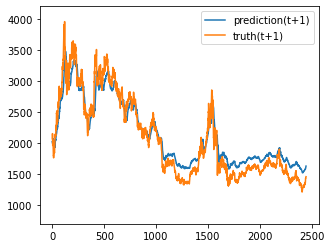

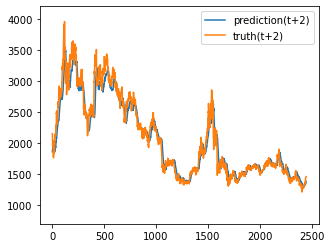

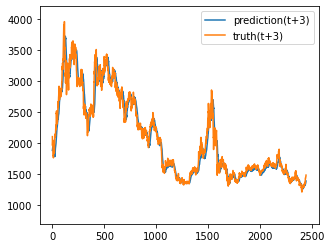

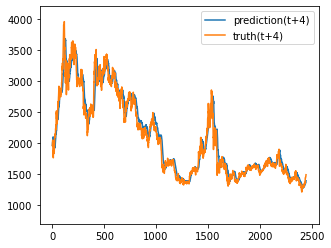

Train epoch:1 	Loss: 1.118903| Loss_in: 2.306155| Loss_out: 1.345395


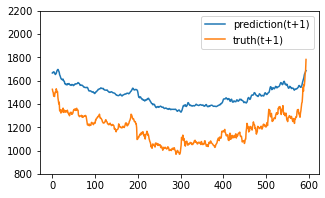

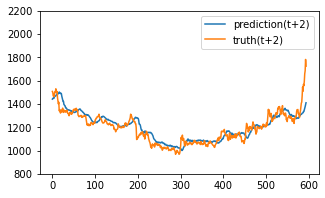

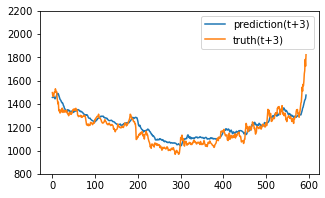

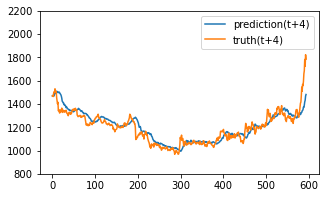

Test epoch:1 	Loss: 0.466809

Epoch: 2


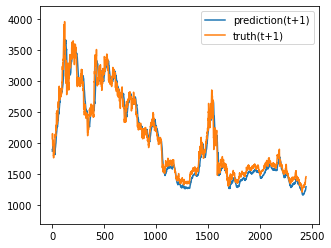

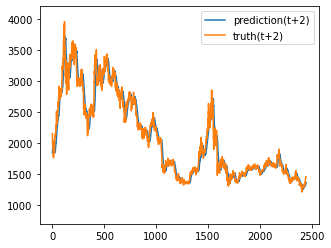

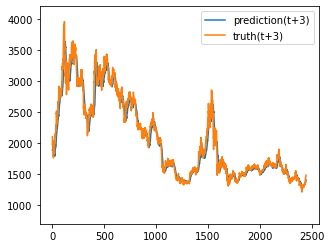

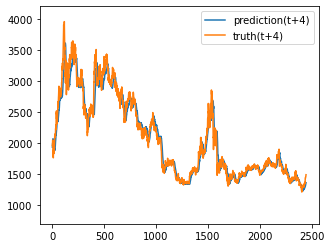

Train epoch:2 	Loss: -4.887006| Loss_in: 0.777529| Loss_out: 0.463420


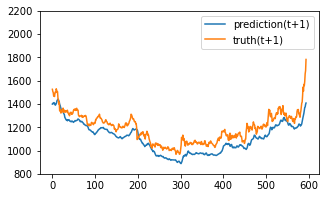

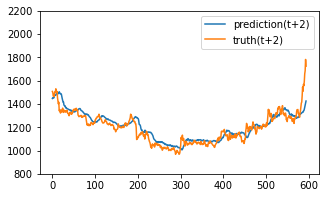

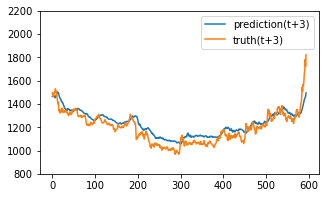

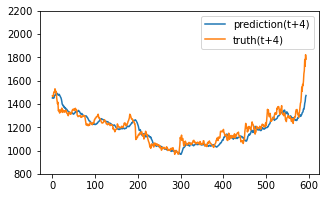

Test epoch:2 	Loss: 0.220403

Epoch: 3


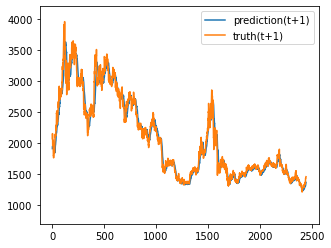

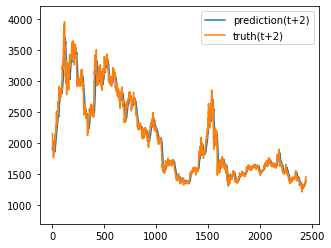

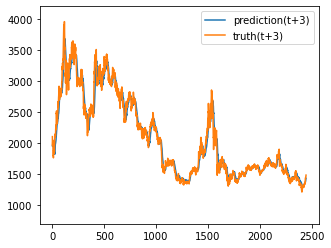

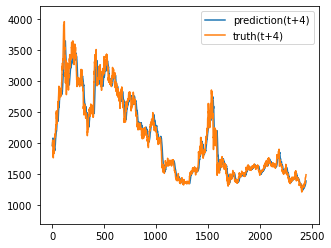

Train epoch:3 	Loss: -8.198970| Loss_in: 0.388063| Loss_out: 0.236805


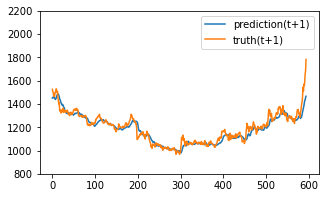

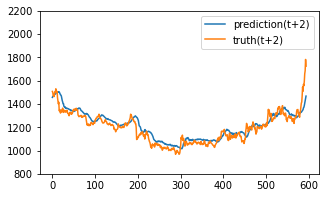

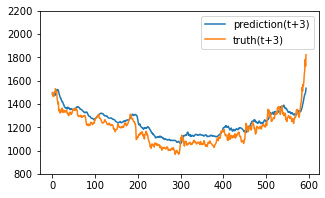

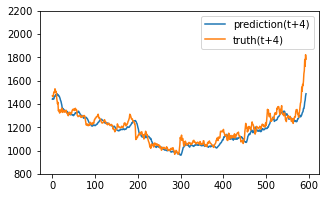

Test epoch:3 	Loss: 0.177875

Epoch: 4


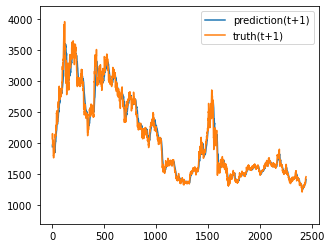

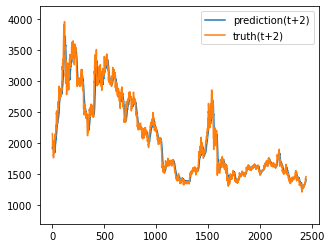

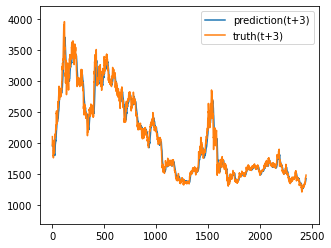

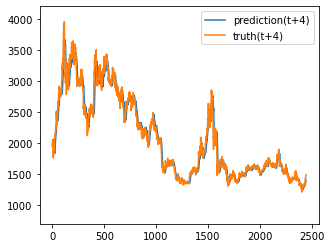

Train epoch:4 	Loss: -10.423615| Loss_in: 0.255322| Loss_out: 0.159657


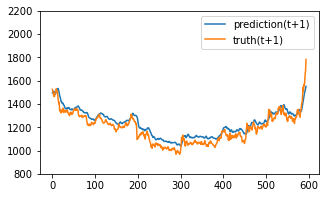

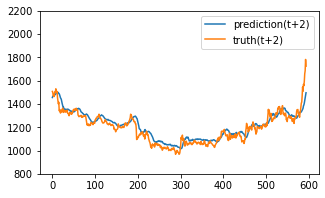

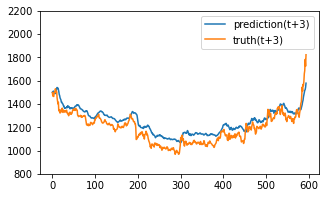

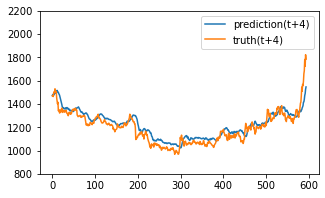

Test epoch:4 	Loss: 0.187330

Epoch: 5


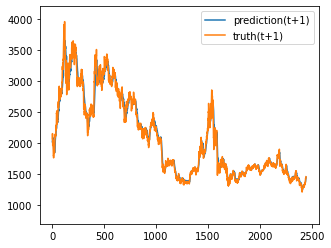

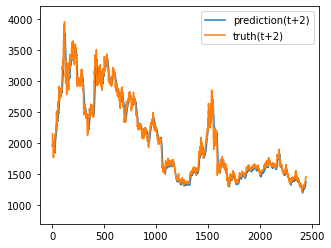

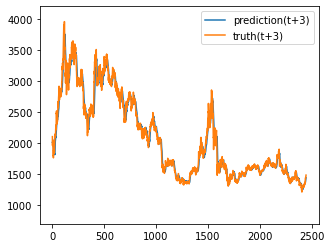

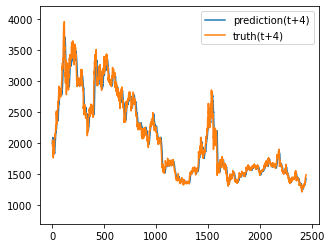

Train epoch:5 	Loss: -11.229436| Loss_in: 0.189678| Loss_out: 0.120508


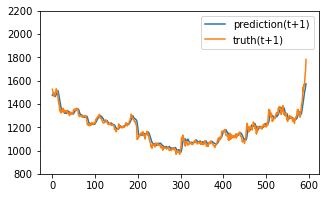

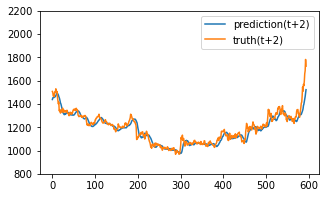

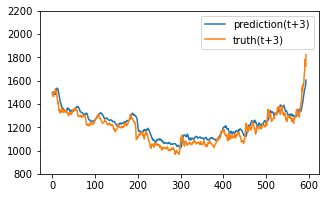

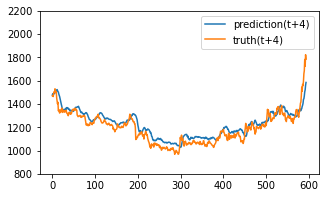

Test epoch:5 	Loss: 0.149827

Epoch: 6


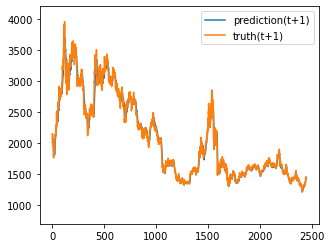

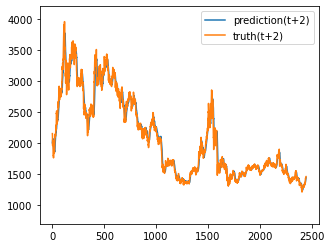

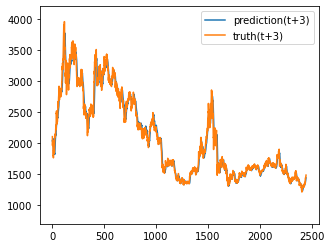

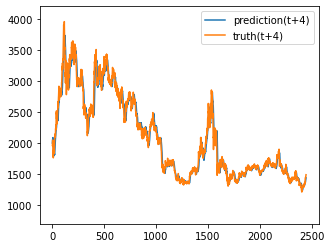

Train epoch:6 	Loss: -11.794701| Loss_in: 0.150172| Loss_out: 0.097812


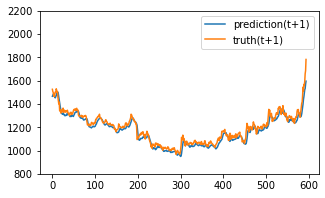

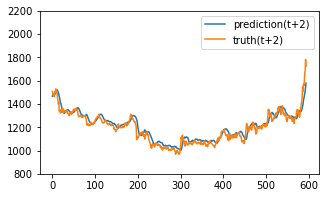

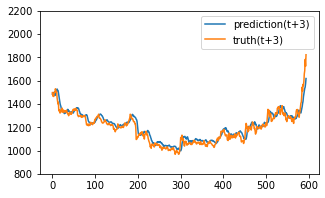

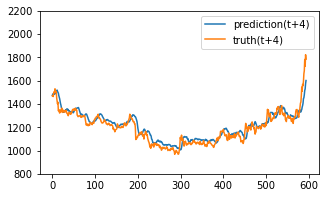

Test epoch:6 	Loss: 0.134106

Epoch: 7


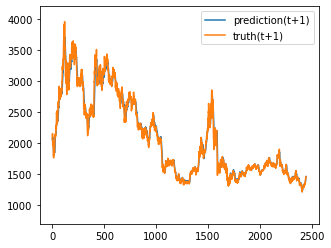

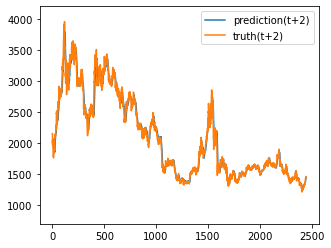

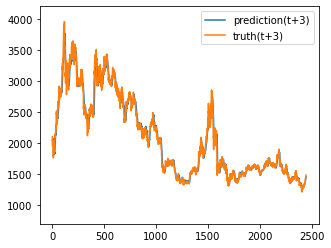

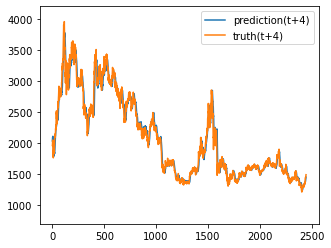

Train epoch:7 	Loss: -12.322789| Loss_in: 0.123098| Loss_out: 0.081276


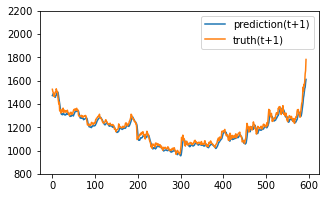

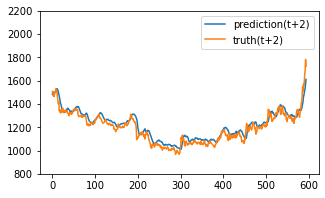

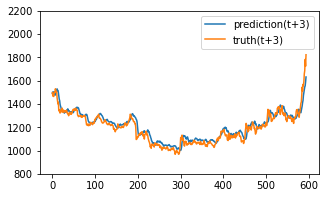

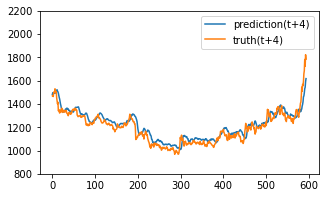

Test epoch:7 	Loss: 0.134206

Epoch: 8


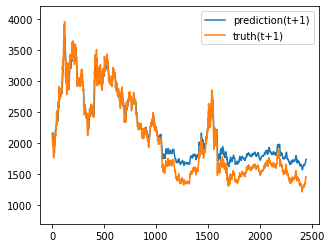

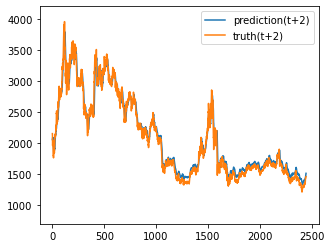

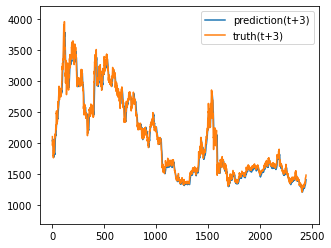

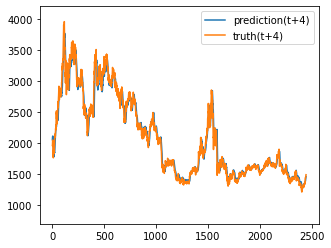

Train epoch:8 	Loss: -10.736947| Loss_in: 0.109481| Loss_out: 0.069663


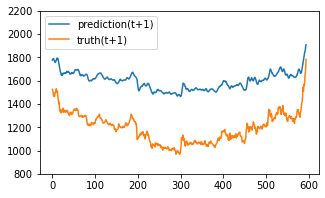

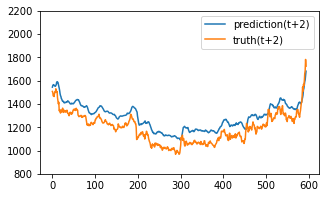

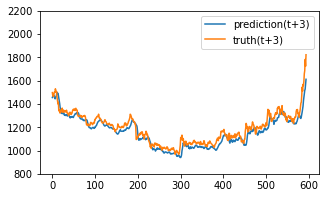

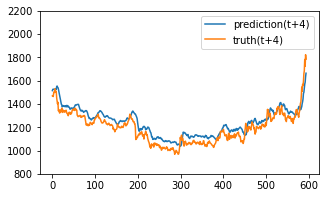

Test epoch:8 	Loss: 0.655773

Epoch: 9


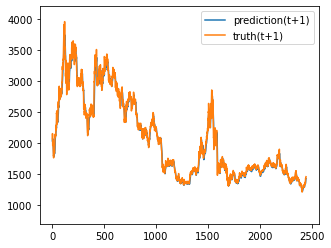

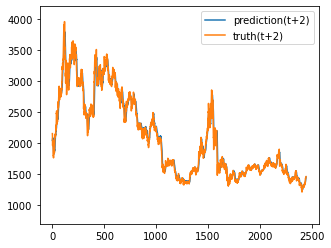

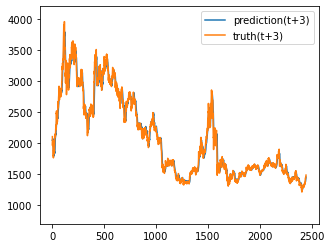

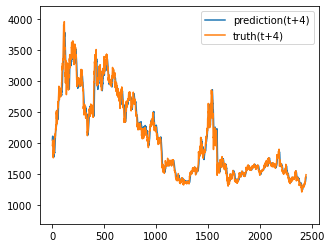

Train epoch:9 	Loss: -8.901956| Loss_in: 0.099394| Loss_out: 0.068276


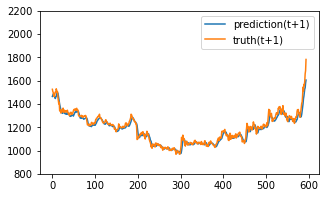

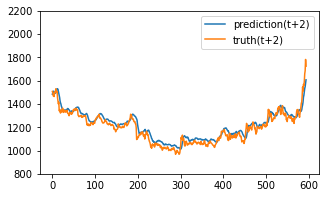

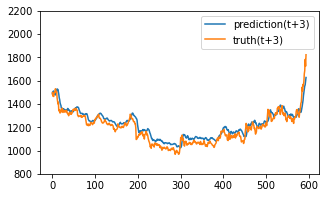

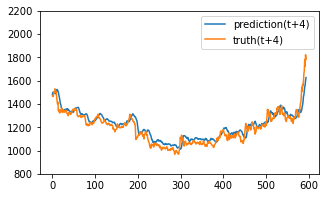

Test epoch:9 	Loss: 0.137839

Epoch: 10


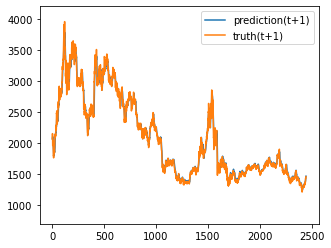

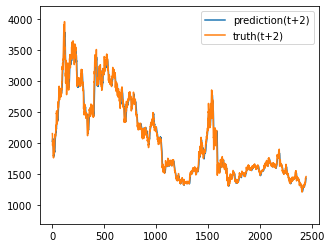

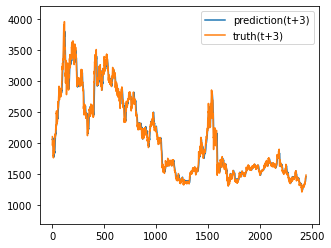

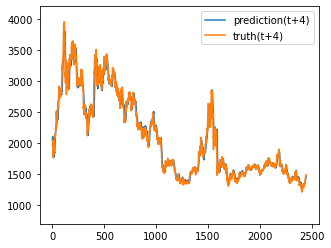

Train epoch:10 	Loss: -11.033382| Loss_in: 0.078397| Loss_out: 0.060648


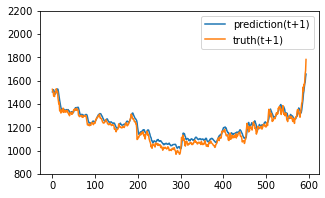

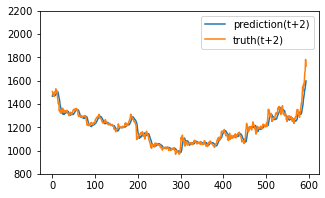

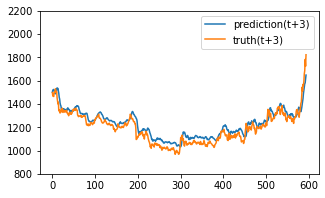

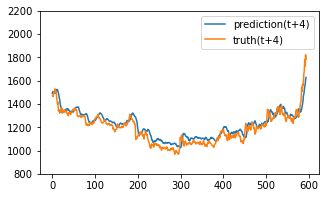

Test epoch:10 	Loss: 0.139339

Epoch: 11


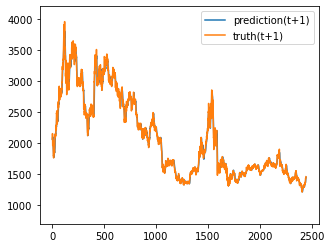

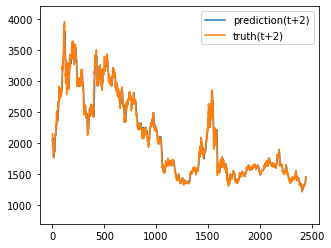

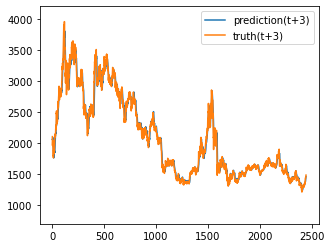

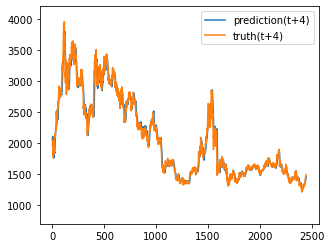

Train epoch:11 	Loss: -12.609215| Loss_in: 0.069974| Loss_out: 0.052748


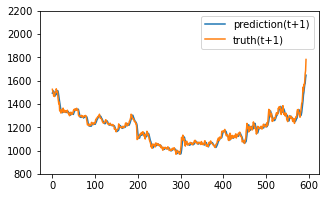

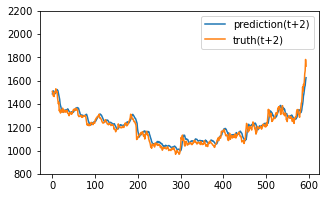

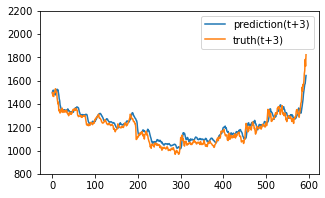

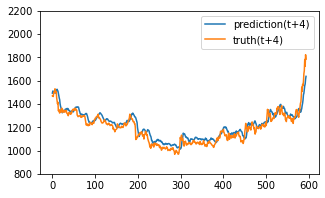

Test epoch:11 	Loss: 0.125498

Epoch: 12


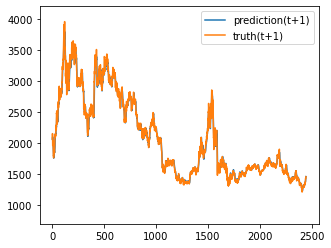

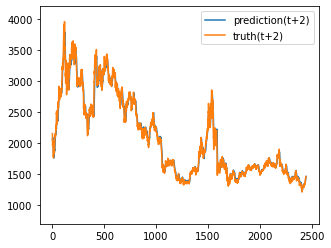

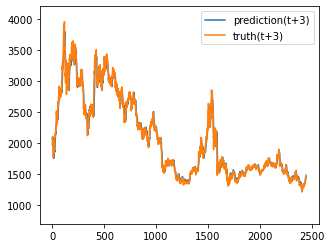

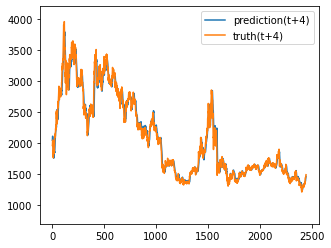

Train epoch:12 	Loss: -13.715622| Loss_in: 0.062800| Loss_out: 0.047994


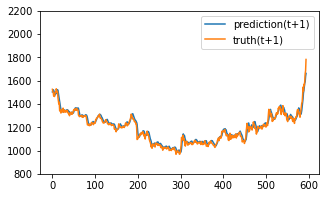

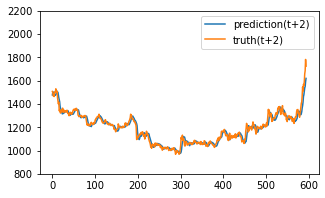

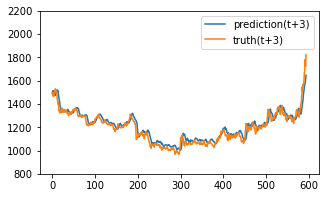

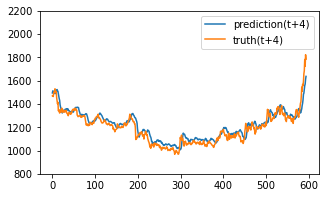

Test epoch:12 	Loss: 0.118166

Epoch: 13


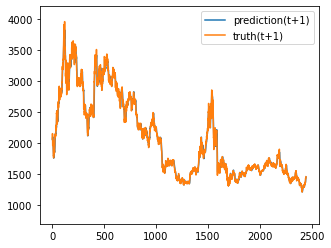

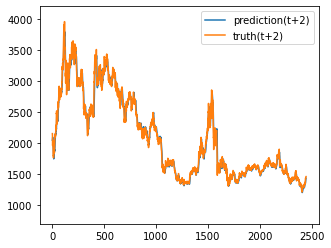

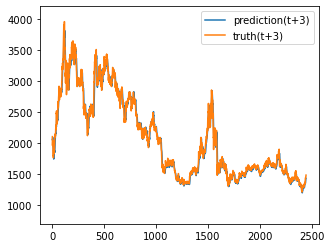

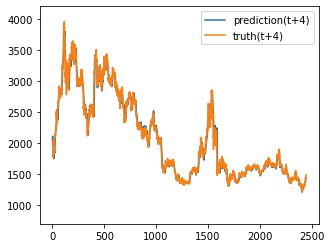

Train epoch:13 	Loss: -14.330655| Loss_in: 0.056349| Loss_out: 0.043735


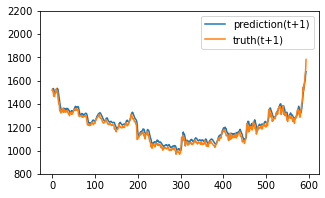

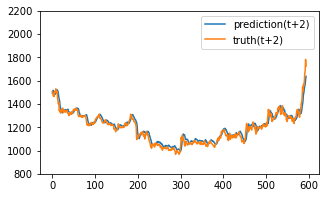

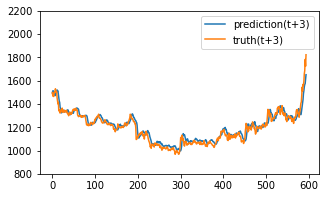

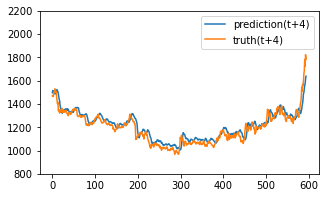

Test epoch:13 	Loss: 0.119482

Epoch: 14


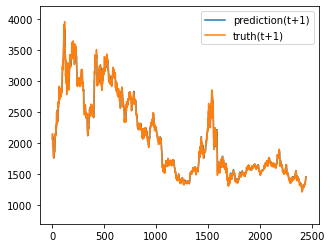

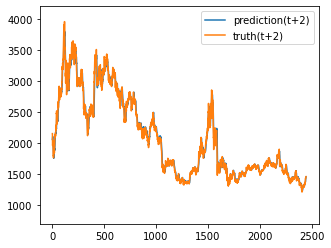

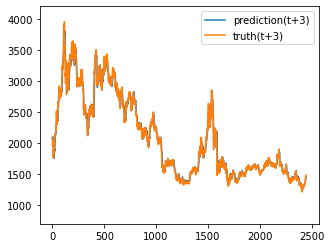

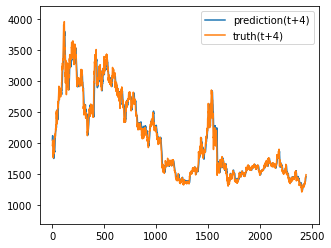

Train epoch:14 	Loss: -14.494448| Loss_in: 0.052053| Loss_out: 0.040287


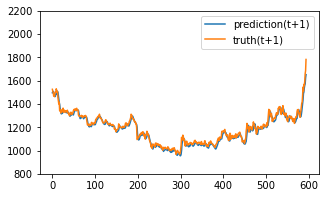

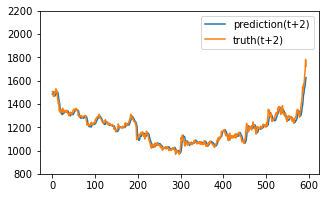

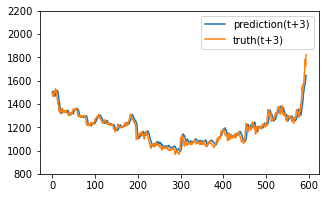

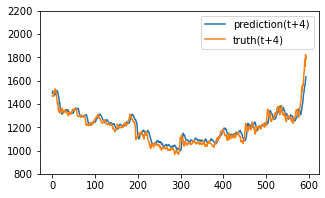

Test epoch:14 	Loss: 0.111129

Epoch: 15


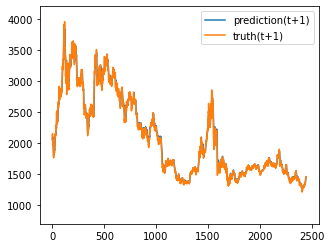

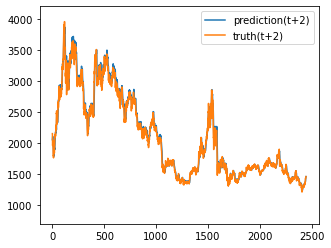

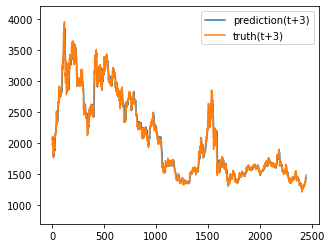

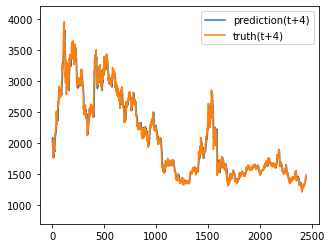

Train epoch:15 	Loss: -11.338602| Loss_in: 0.069662| Loss_out: 0.048576


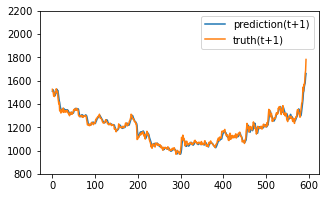

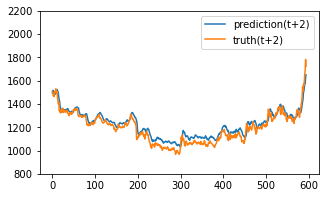

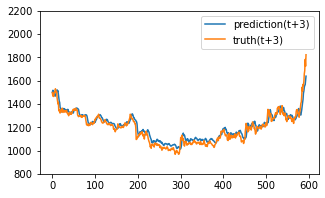

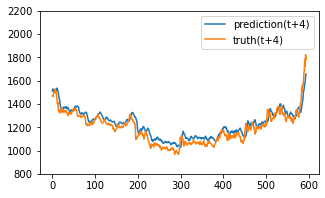

Test epoch:15 	Loss: 0.131755

Epoch: 16


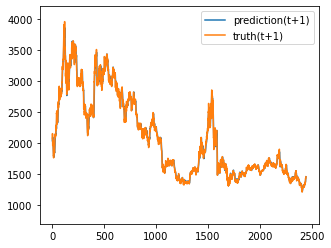

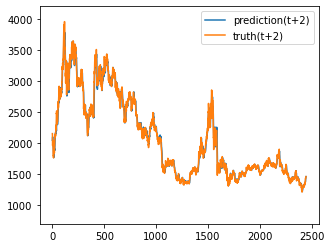

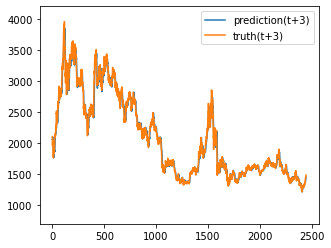

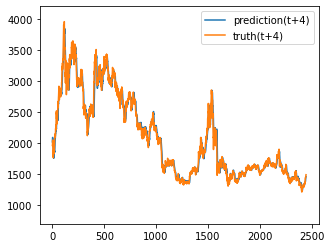

Train epoch:16 	Loss: -14.454669| Loss_in: 0.044070| Loss_out: 0.043839


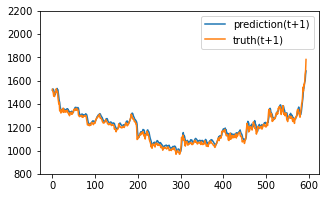

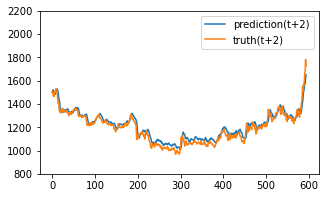

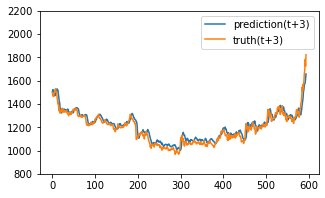

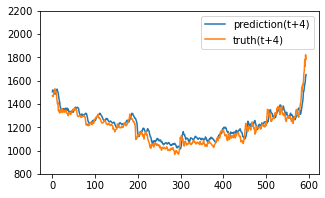

Test epoch:16 	Loss: 0.121047

Epoch: 17


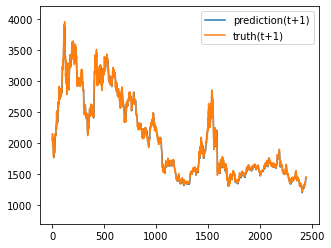

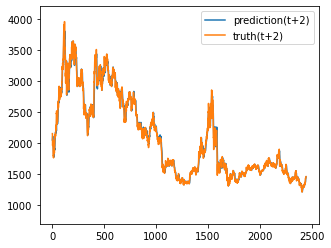

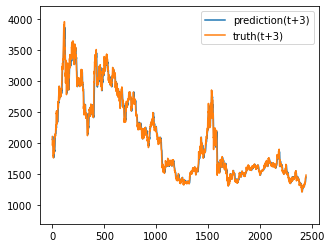

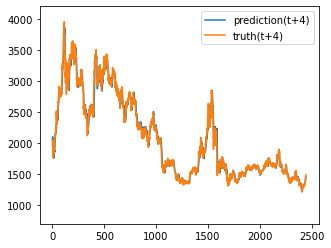

Train epoch:17 	Loss: -15.113040| Loss_in: 0.041268| Loss_out: 0.035312


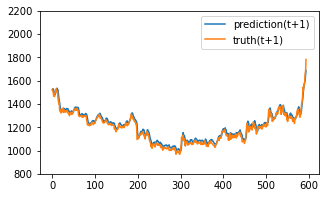

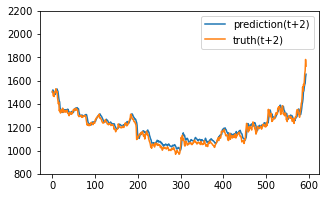

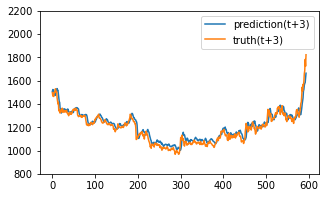

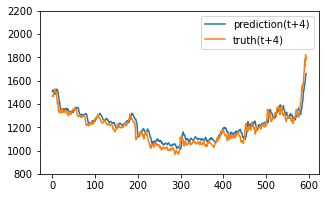

Test epoch:17 	Loss: 0.116545

Epoch: 18


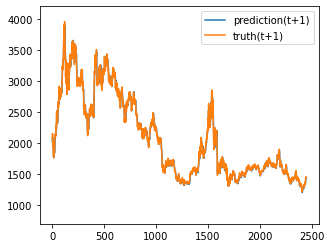

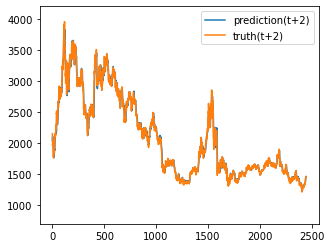

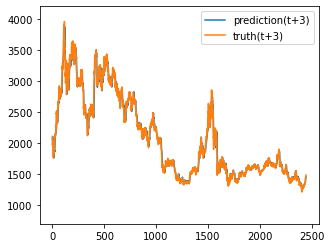

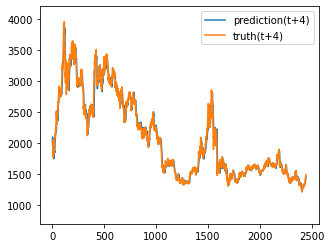

Train epoch:18 	Loss: -15.104814| Loss_in: 0.038800| Loss_out: 0.032678


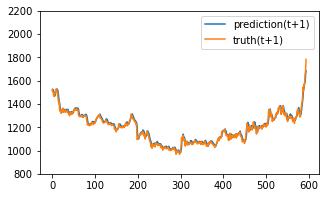

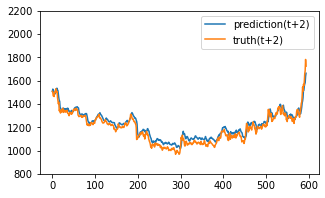

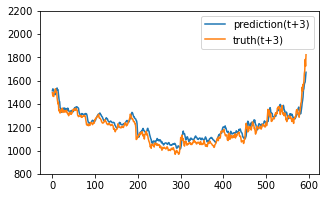

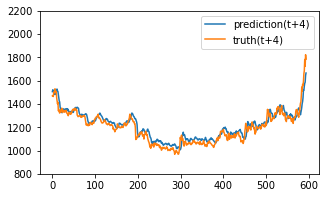

Test epoch:18 	Loss: 0.122002

Epoch: 19


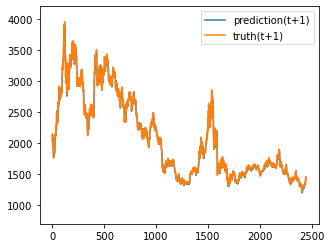

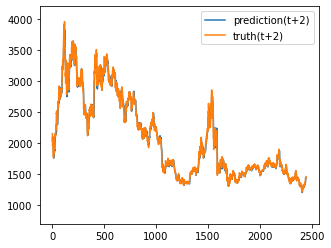

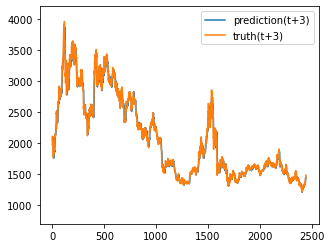

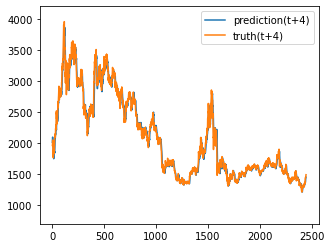

Train epoch:19 	Loss: -15.370533| Loss_in: 0.036610| Loss_out: 0.030720


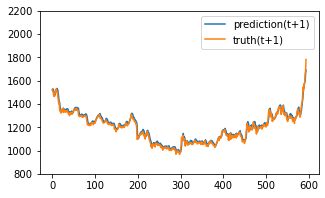

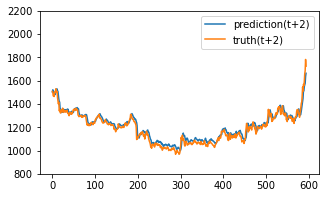

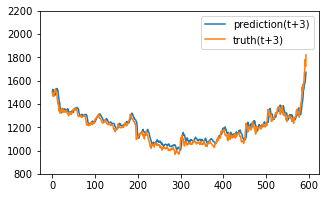

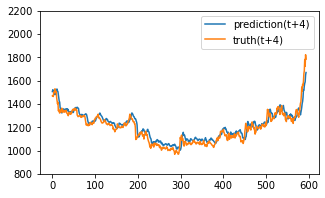

Test epoch:19 	Loss: 0.112061

Epoch: 20


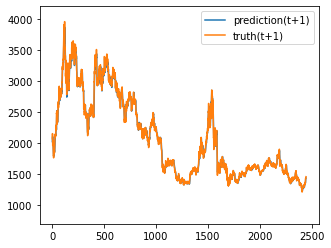

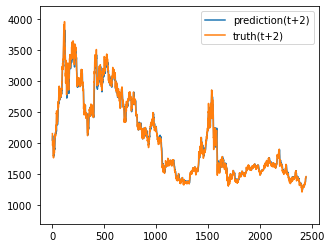

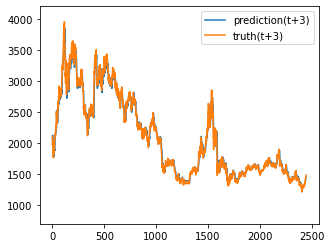

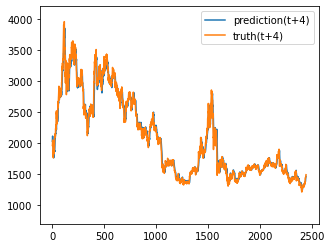

Train epoch:20 	Loss: -13.359647| Loss_in: 0.039242| Loss_out: 0.028774


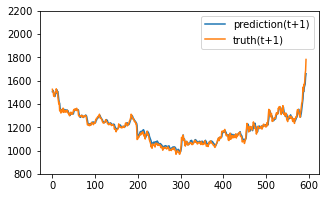

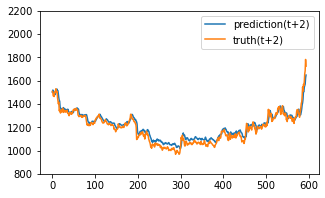

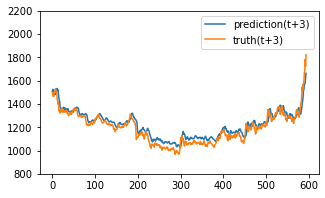

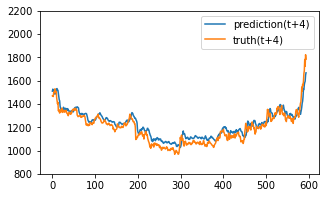

Test epoch:20 	Loss: 0.126964

Epoch: 21


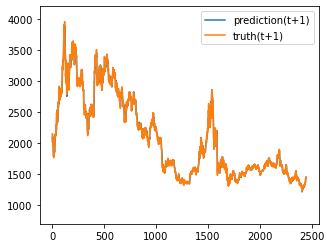

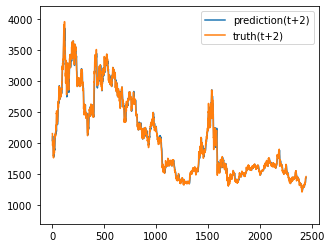

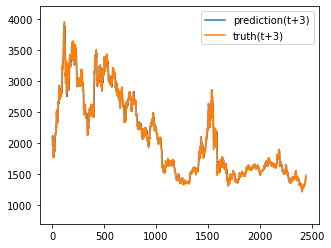

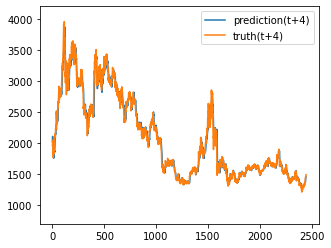

Train epoch:21 	Loss: -14.515687| Loss_in: 0.032511| Loss_out: 0.028785


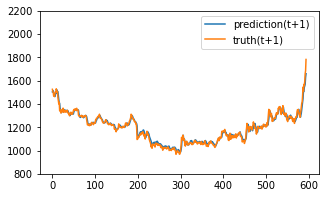

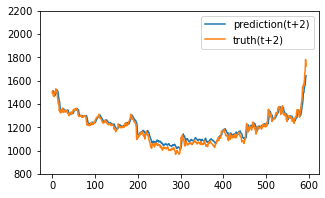

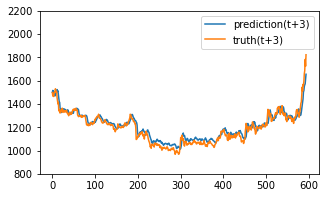

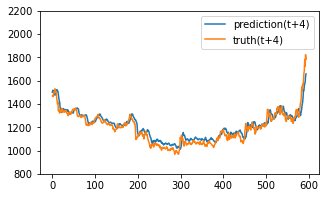

Test epoch:21 	Loss: 0.112626

Epoch: 22


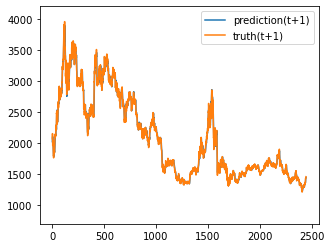

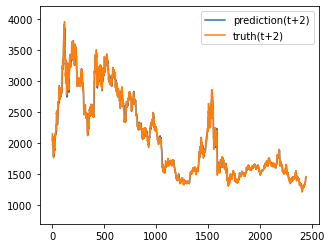

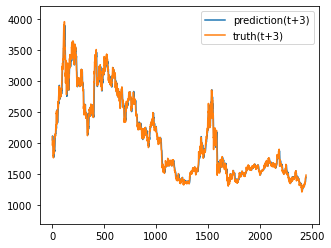

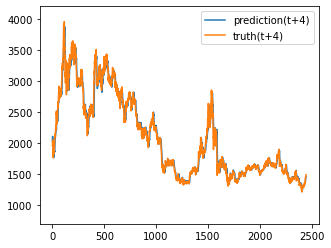

Train epoch:22 	Loss: -14.869827| Loss_in: 0.030973| Loss_out: 0.026596


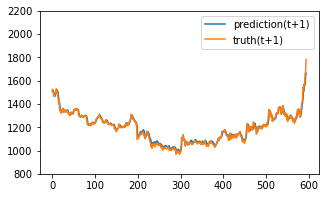

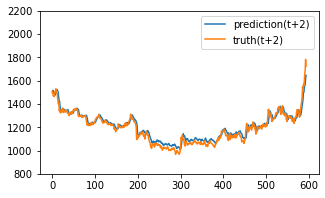

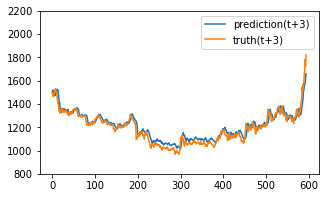

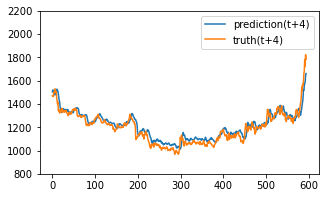

Test epoch:22 	Loss: 0.113707

Epoch: 23


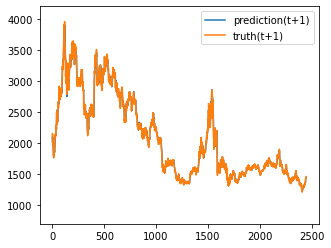

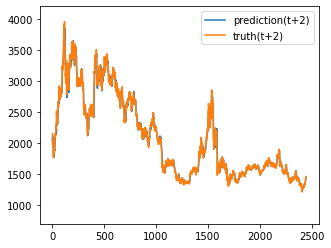

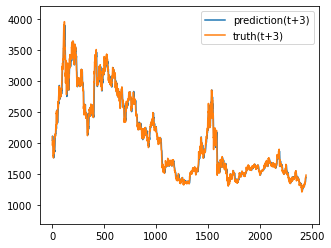

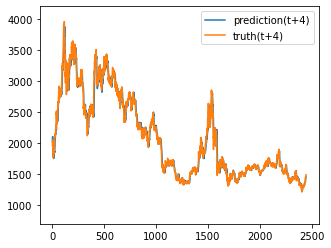

Train epoch:23 	Loss: -15.089044| Loss_in: 0.029772| Loss_out: 0.024959


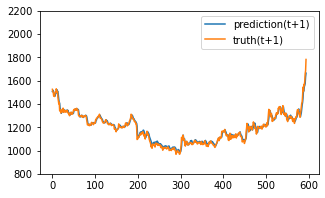

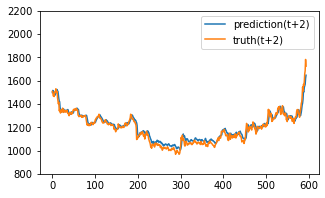

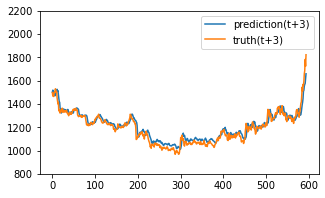

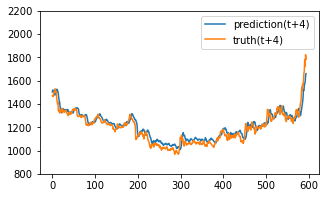

Test epoch:23 	Loss: 0.110520

Epoch: 24


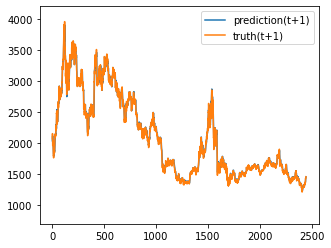

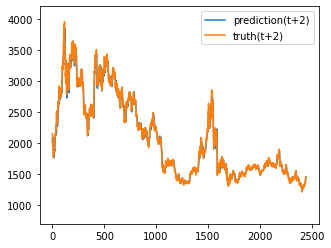

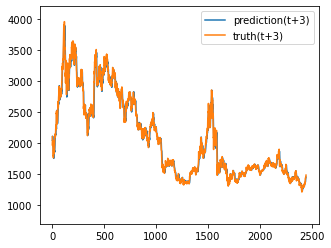

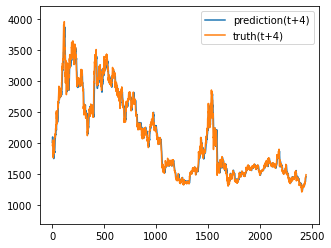

Train epoch:24 	Loss: -15.271332| Loss_in: 0.028635| Loss_out: 0.024228


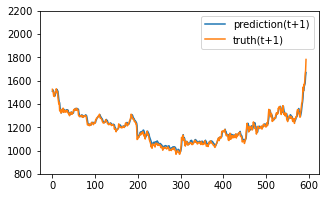

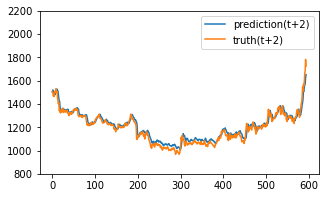

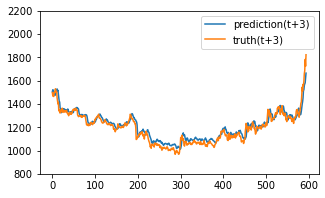

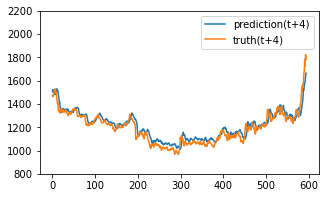

Test epoch:24 	Loss: 0.113410

Epoch: 25


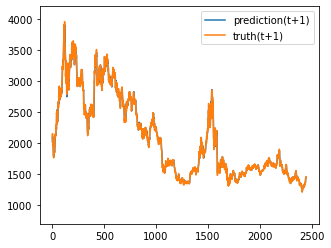

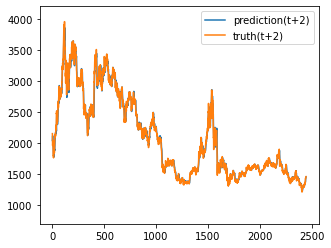

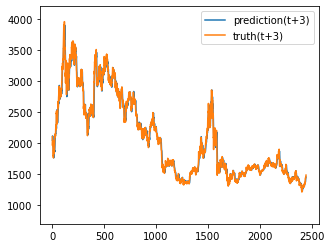

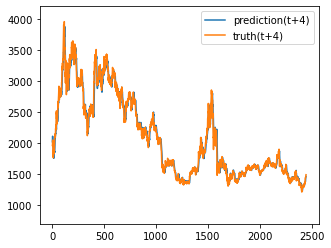

Train epoch:25 	Loss: -15.383267| Loss_in: 0.027670| Loss_out: 0.023717


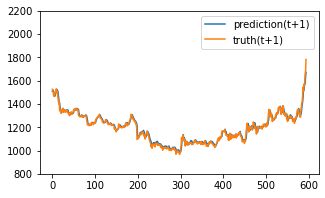

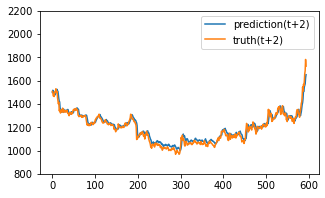

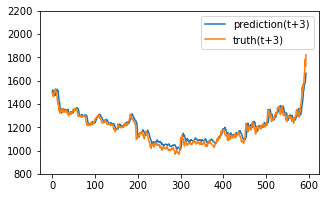

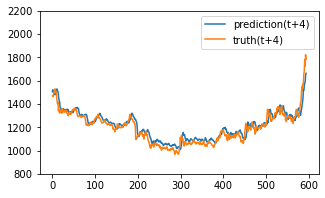

Test epoch:25 	Loss: 0.109166

Epoch: 26


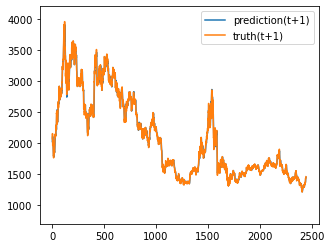

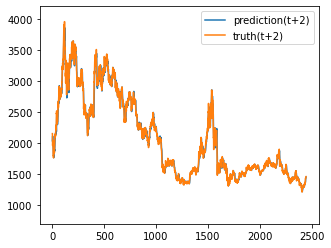

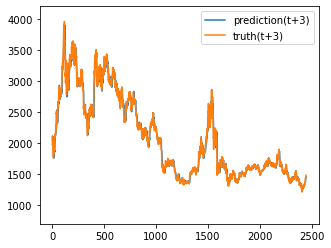

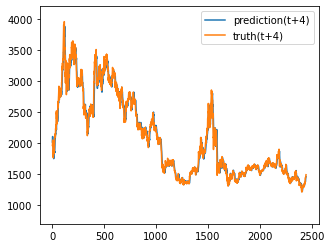

Train epoch:26 	Loss: -15.468013| Loss_in: 0.026720| Loss_out: 0.022484


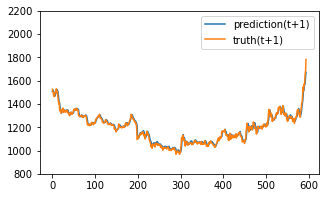

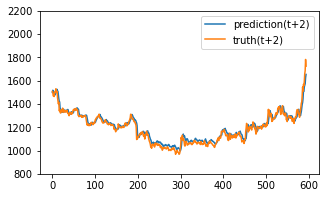

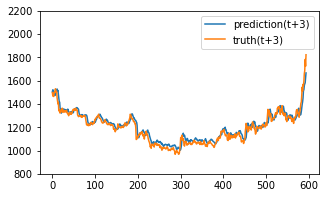

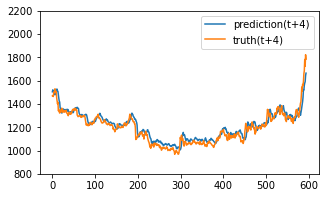

Test epoch:26 	Loss: 0.108271

Epoch: 27


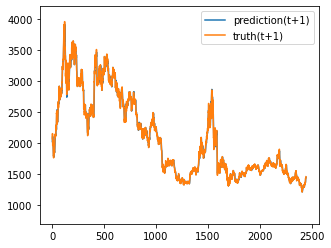

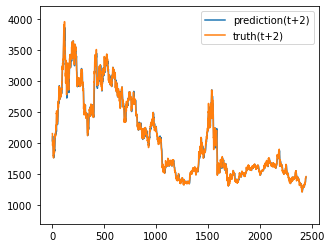

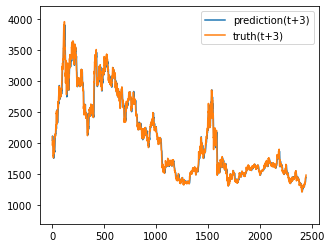

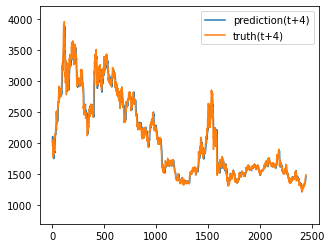

Train epoch:27 	Loss: -15.523992| Loss_in: 0.025771| Loss_out: 0.022293


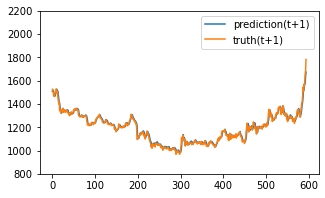

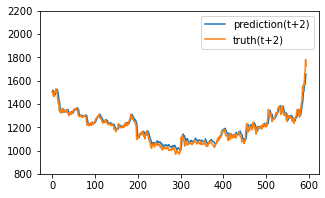

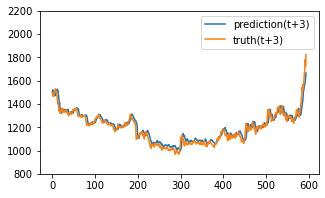

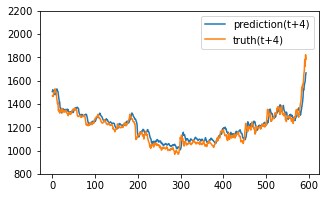

Test epoch:27 	Loss: 0.107606

Epoch: 28


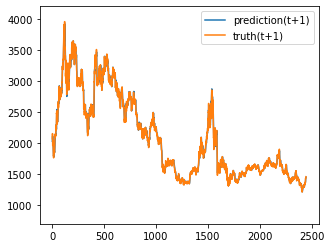

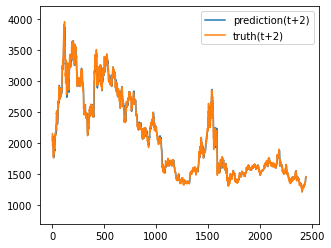

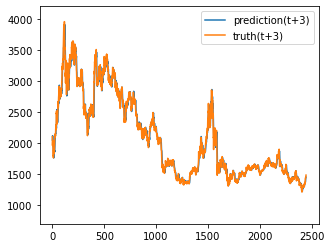

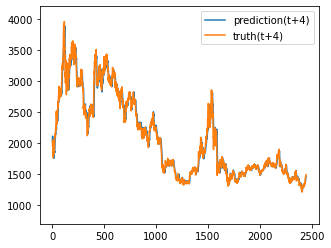

Train epoch:28 	Loss: -15.470386| Loss_in: 0.025075| Loss_out: 0.021294


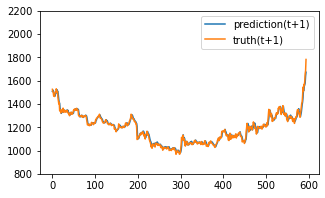

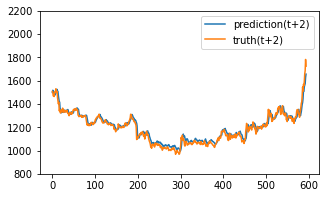

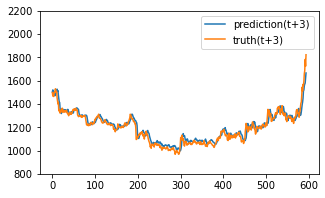

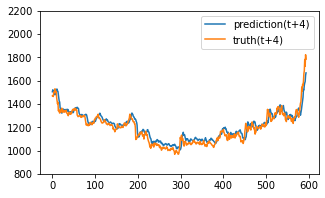

Test epoch:28 	Loss: 0.106833

Epoch: 29


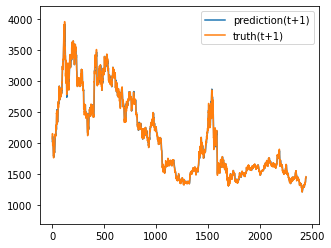

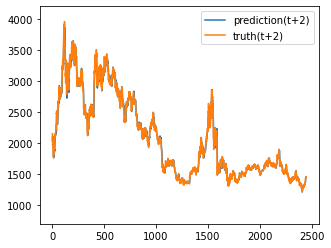

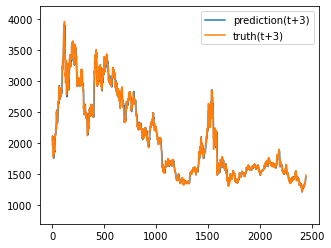

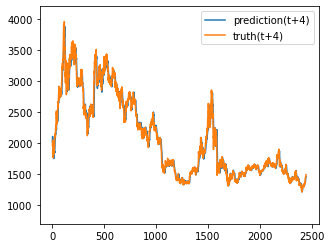

Train epoch:29 	Loss: -15.600526| Loss_in: 0.024178| Loss_out: 0.020539


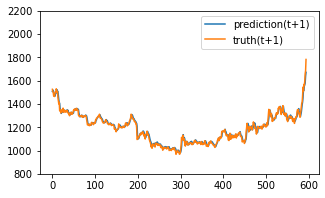

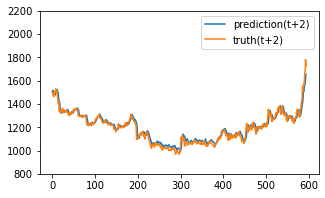

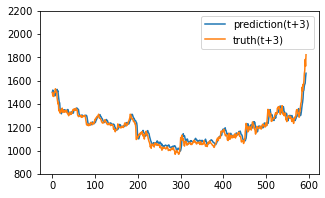

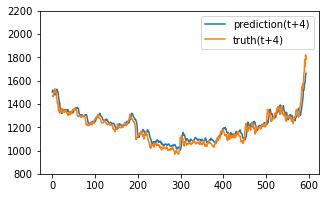

Test epoch:29 	Loss: 0.105886

Epoch: 30


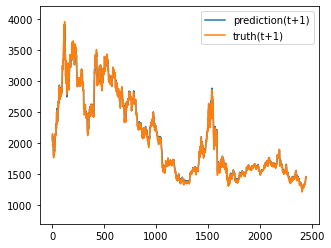

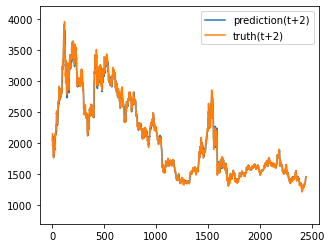

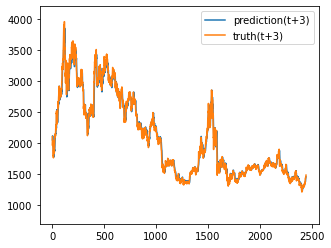

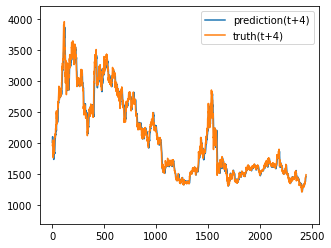

Train epoch:30 	Loss: -14.201174| Loss_in: 0.027853| Loss_out: 0.021224


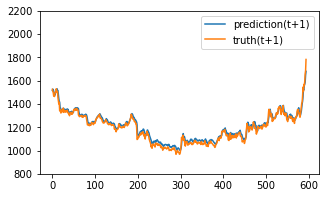

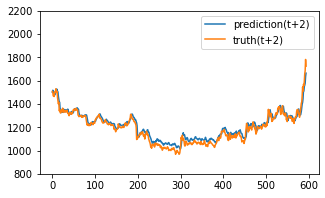

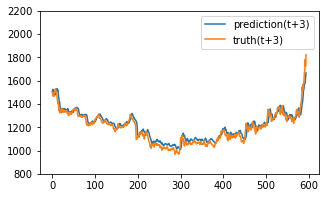

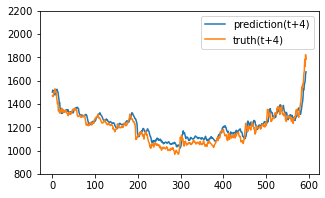

Test epoch:30 	Loss: 0.118845

Epoch: 31


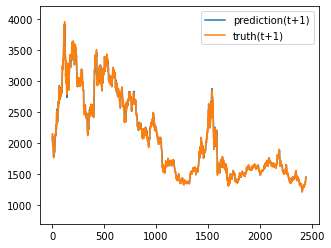

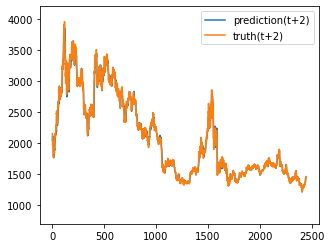

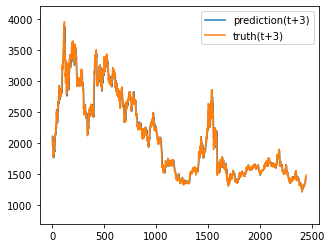

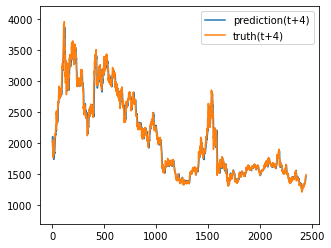

Train epoch:31 	Loss: -15.570359| Loss_in: 0.023186| Loss_out: 0.022038


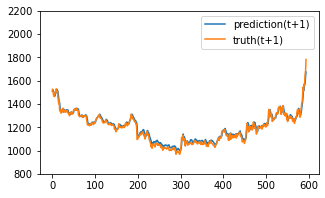

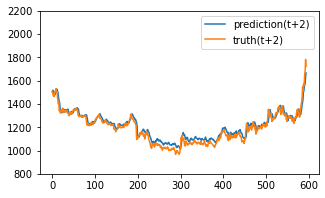

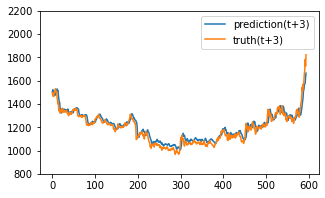

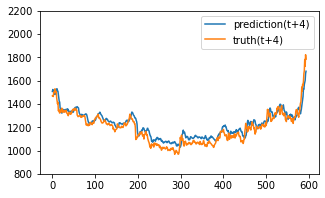

Test epoch:31 	Loss: 0.120204

Epoch: 32


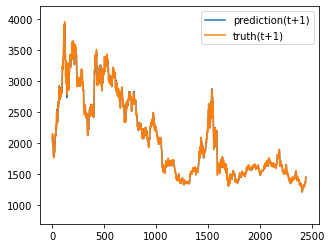

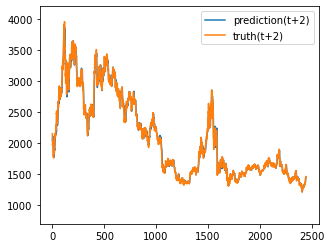

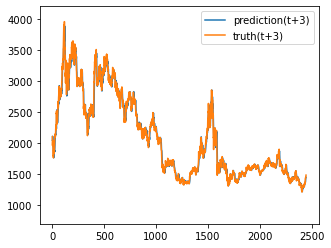

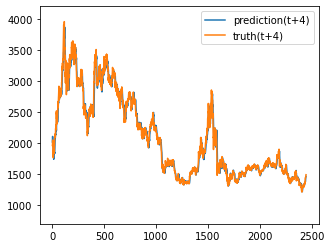

Train epoch:32 	Loss: -15.503820| Loss_in: 0.021878| Loss_out: 0.020141


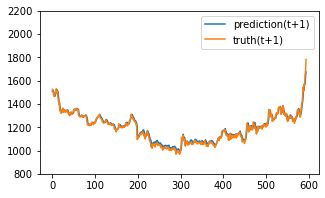

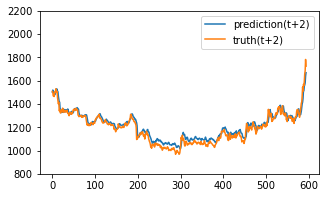

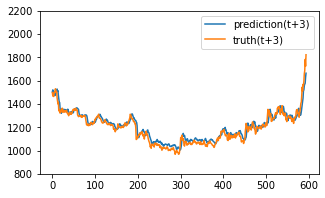

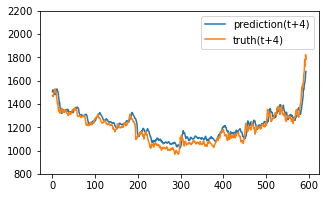

Test epoch:32 	Loss: 0.116843

Epoch: 33


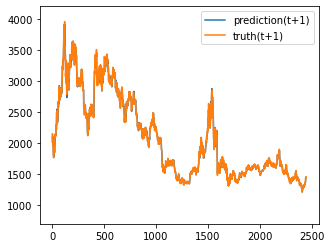

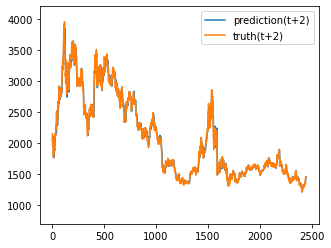

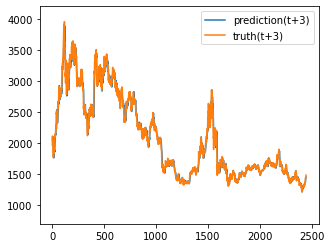

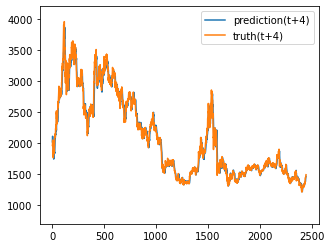

Train epoch:33 	Loss: -15.657172| Loss_in: 0.021472| Loss_out: 0.019250


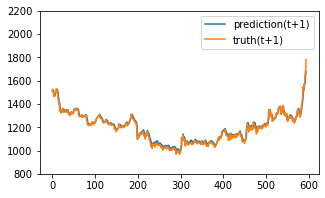

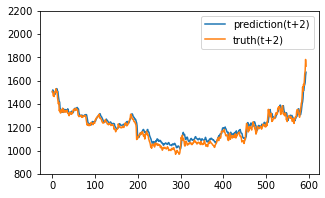

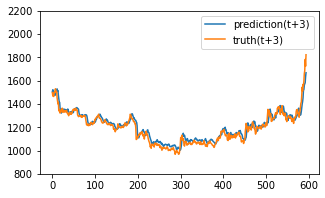

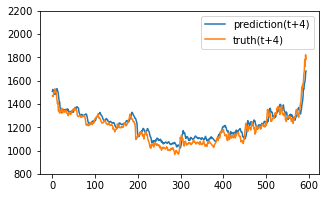

Test epoch:33 	Loss: 0.116463

Epoch: 34


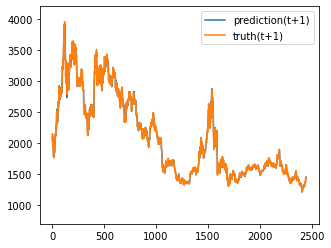

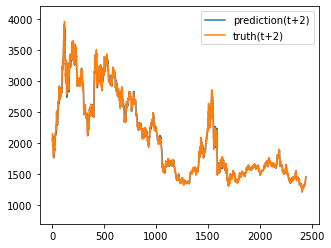

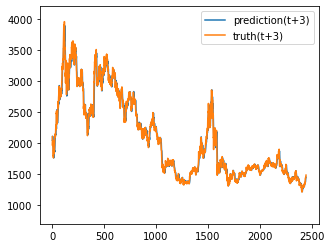

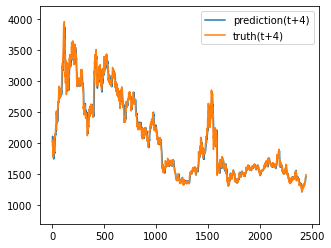

Train epoch:34 	Loss: -15.577345| Loss_in: 0.021059| Loss_out: 0.018521


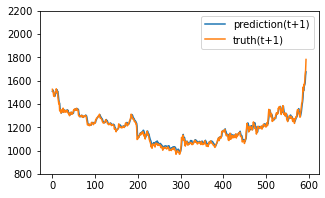

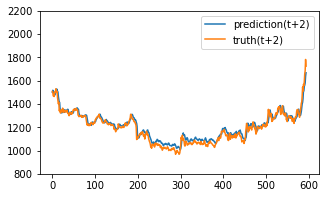

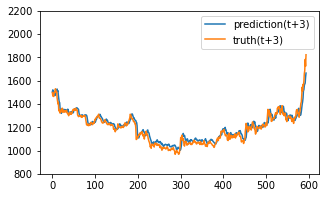

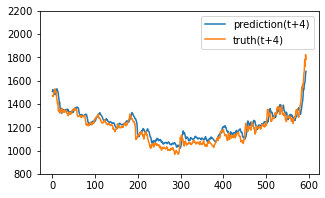

Test epoch:34 	Loss: 0.113179

Epoch: 35


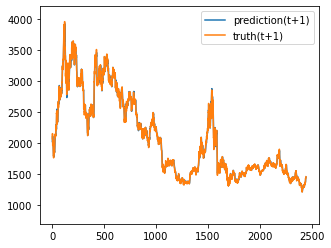

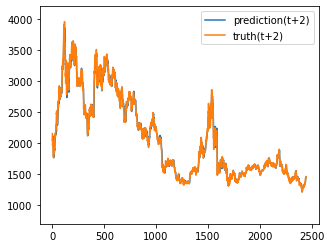

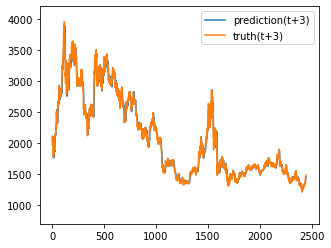

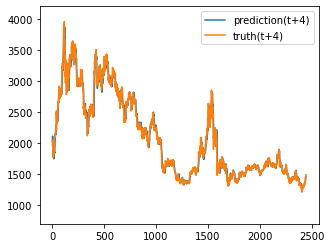

Train epoch:35 	Loss: -15.666359| Loss_in: 0.020604| Loss_out: 0.018077


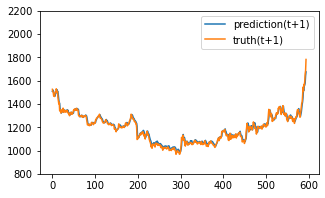

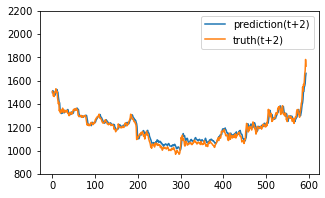

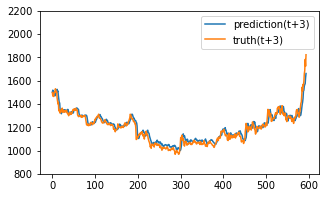

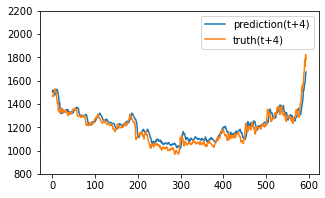

Test epoch:35 	Loss: 0.109565

Epoch: 36


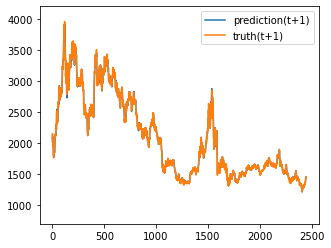

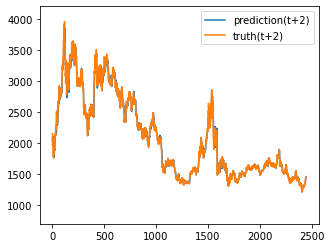

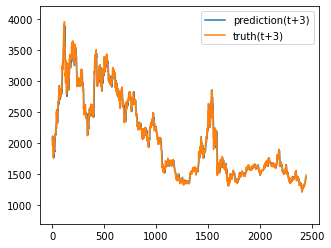

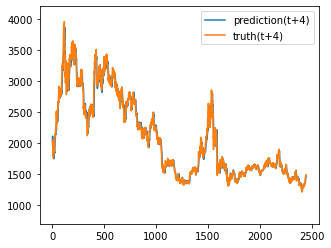

Train epoch:36 	Loss: -15.714545| Loss_in: 0.020242| Loss_out: 0.017858


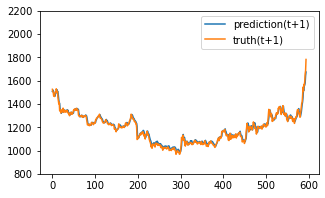

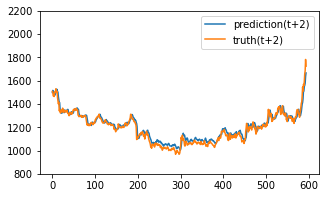

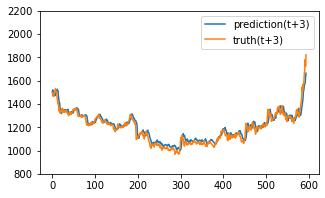

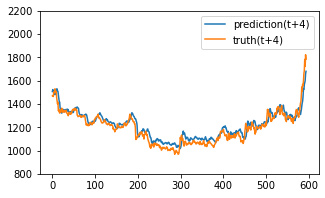

Test epoch:36 	Loss: 0.111119

Epoch: 37


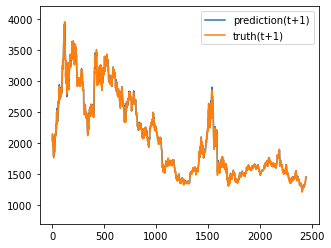

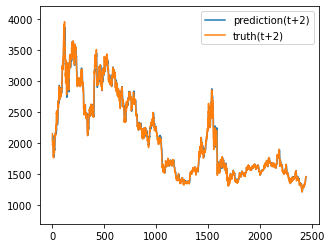

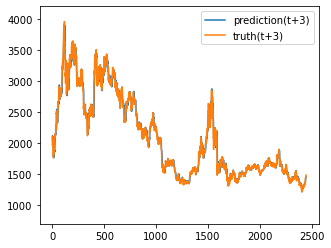

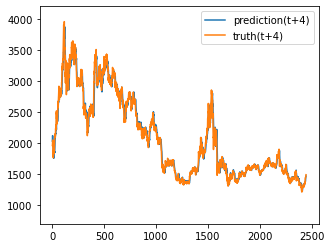

Train epoch:37 	Loss: -15.720745| Loss_in: 0.019951| Loss_out: 0.017991


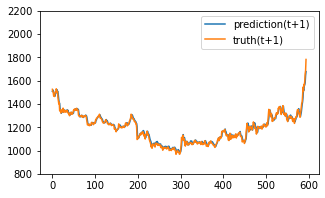

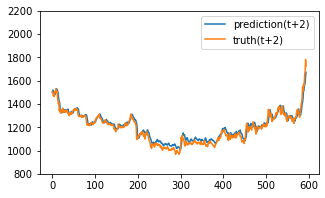

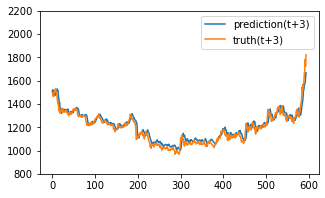

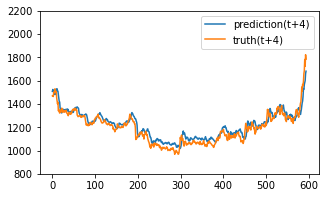

Test epoch:37 	Loss: 0.112018

Epoch: 38


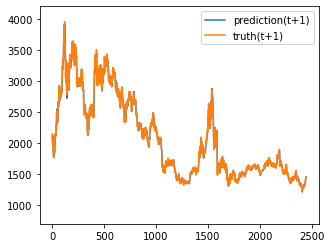

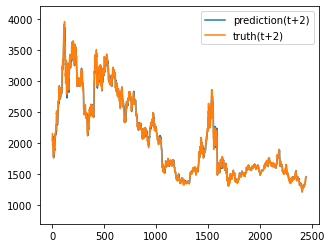

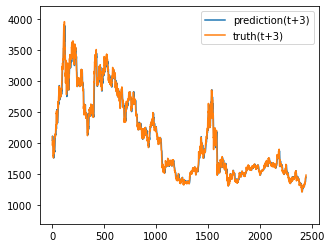

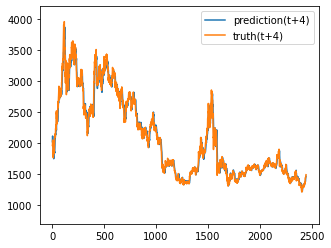

Train epoch:38 	Loss: -15.741765| Loss_in: 0.019569| Loss_out: 0.016874


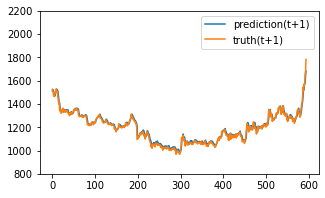

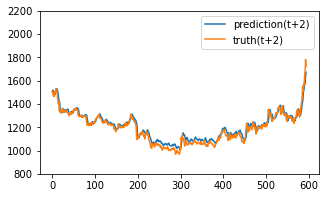

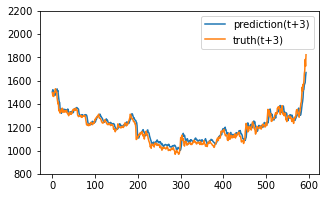

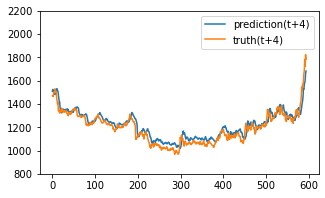

Test epoch:38 	Loss: 0.112642

Epoch: 39


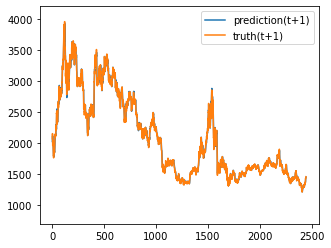

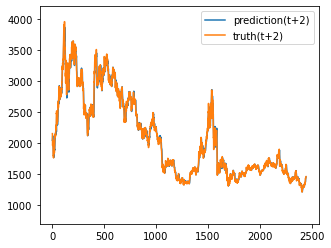

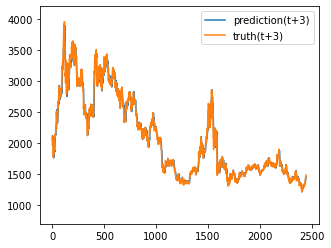

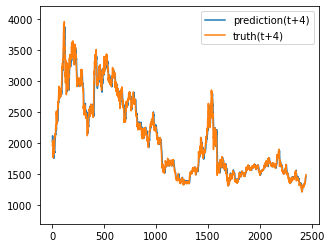

Train epoch:39 	Loss: -15.750656| Loss_in: 0.019036| Loss_out: 0.016457


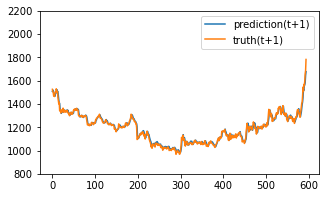

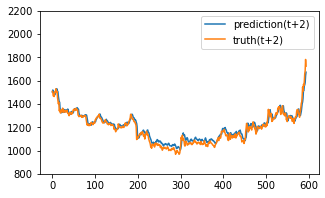

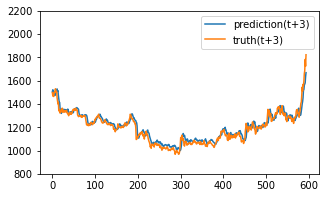

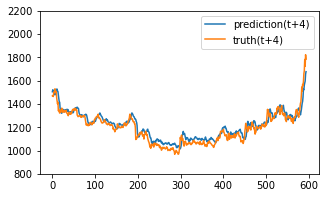

Test epoch:39 	Loss: 0.110000

Epoch: 40


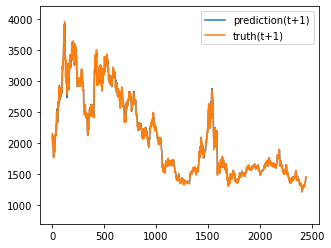

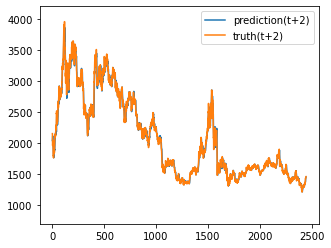

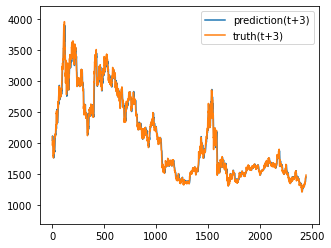

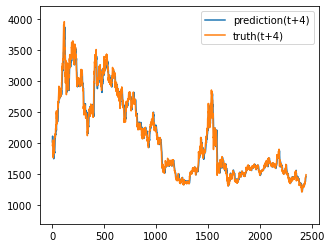

Train epoch:40 	Loss: -15.758401| Loss_in: 0.018697| Loss_out: 0.016512


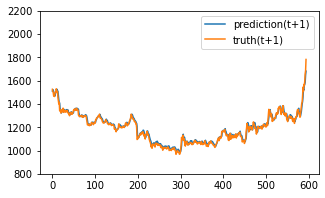

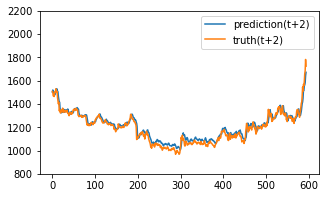

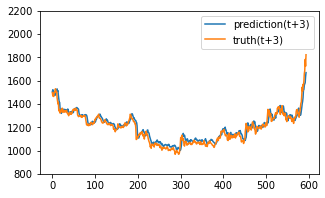

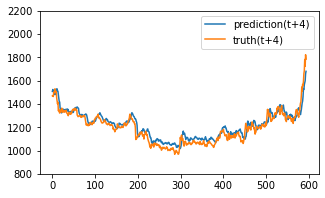

Test epoch:40 	Loss: 0.111664

Epoch: 41


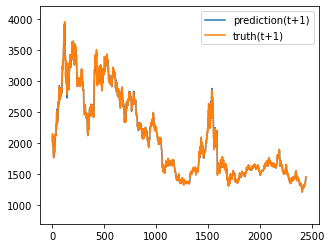

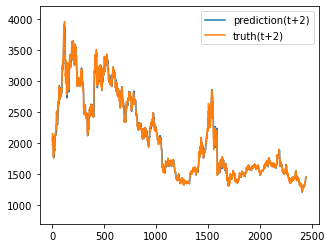

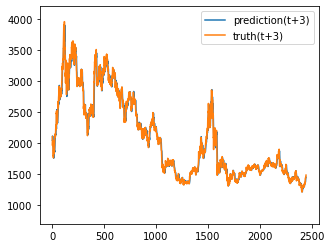

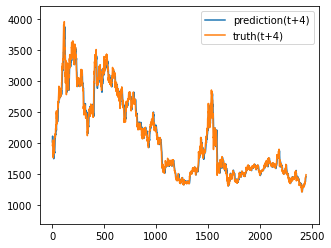

Train epoch:41 	Loss: -15.716302| Loss_in: 0.018346| Loss_out: 0.015837


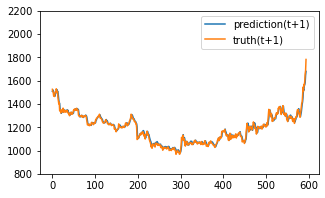

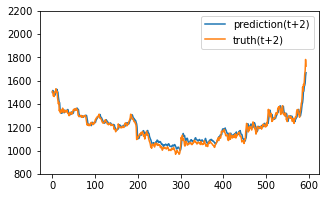

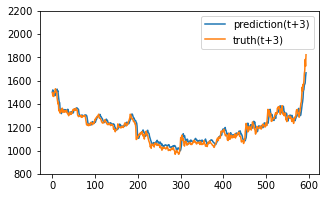

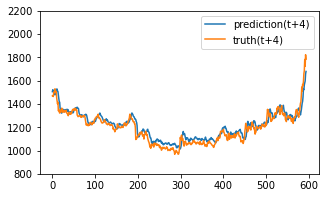

Test epoch:41 	Loss: 0.107933

Epoch: 42


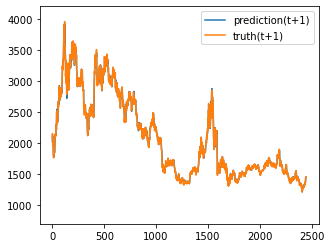

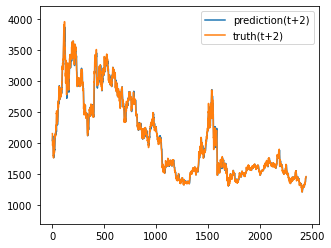

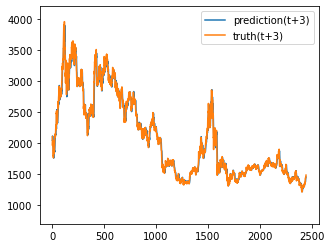

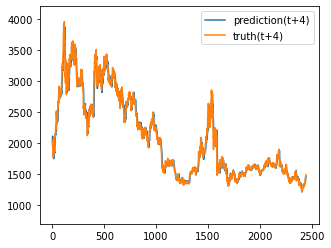

Train epoch:42 	Loss: -15.774322| Loss_in: 0.018008| Loss_out: 0.015732


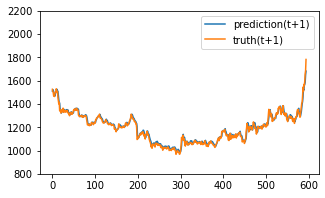

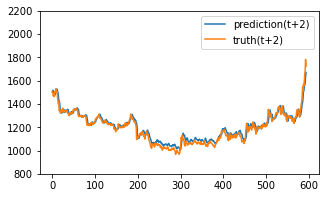

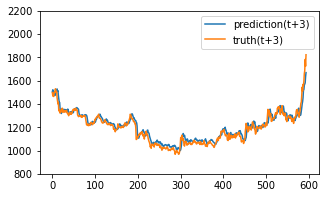

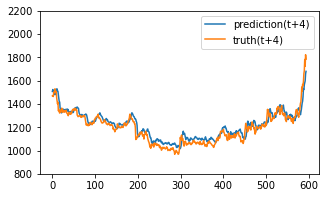

Test epoch:42 	Loss: 0.110154

Epoch: 43


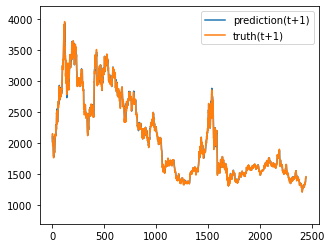

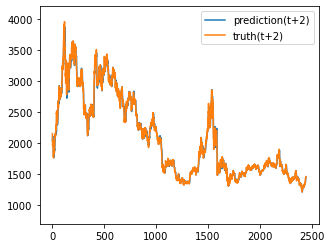

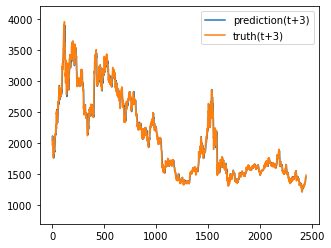

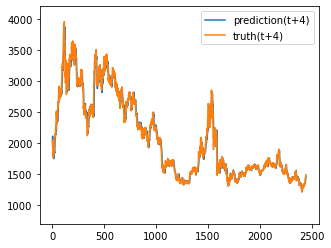

Train epoch:43 	Loss: -15.768821| Loss_in: 0.017704| Loss_out: 0.015383


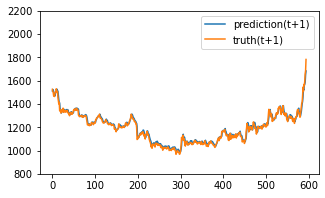

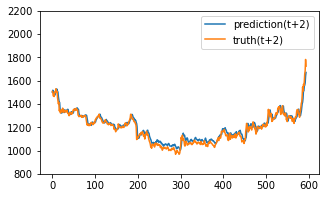

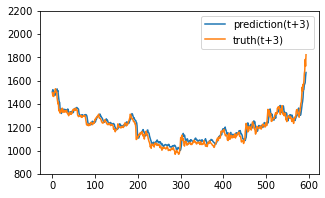

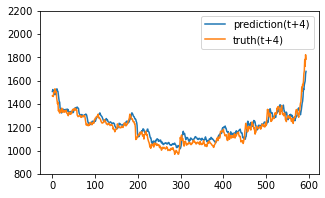

Test epoch:43 	Loss: 0.110146

Epoch: 44


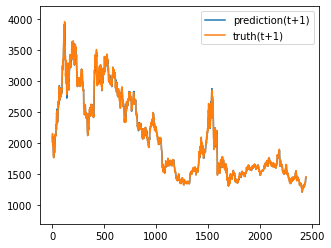

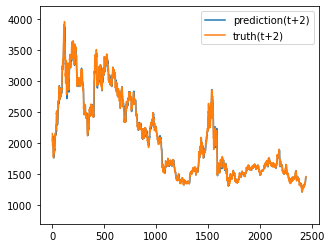

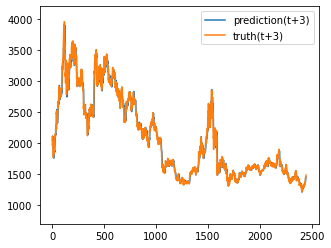

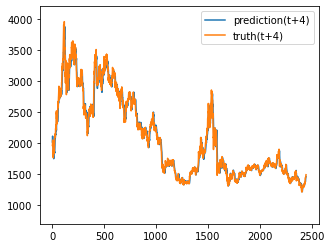

Train epoch:44 	Loss: -15.791019| Loss_in: 0.017376| Loss_out: 0.015148


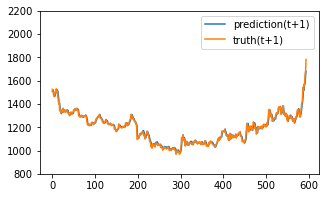

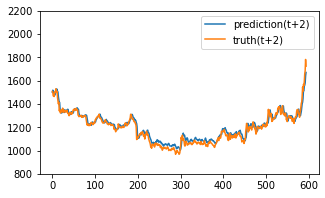

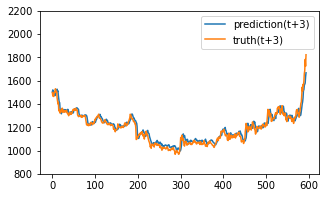

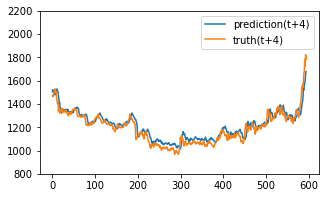

Test epoch:44 	Loss: 0.108259

Epoch: 45


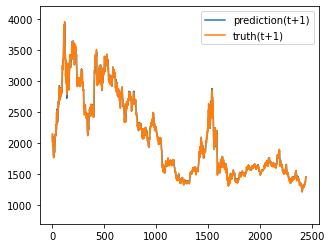

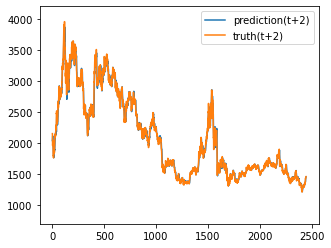

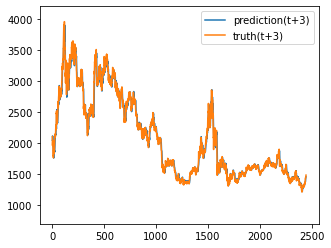

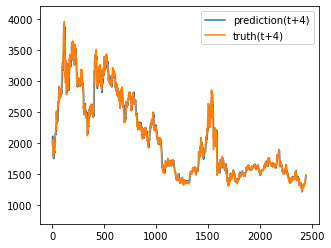

Train epoch:45 	Loss: -15.725719| Loss_in: 0.017134| Loss_out: 0.015450


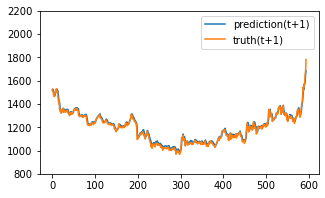

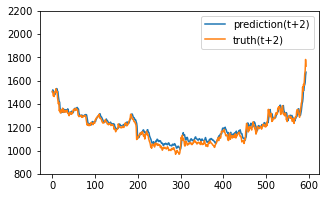

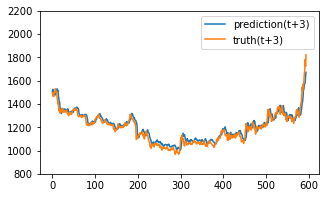

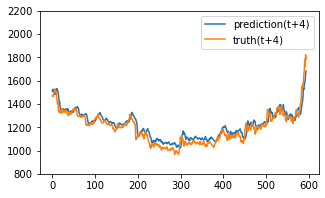

Test epoch:45 	Loss: 0.113632

Epoch: 46


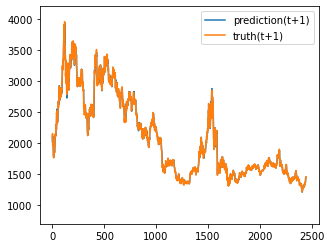

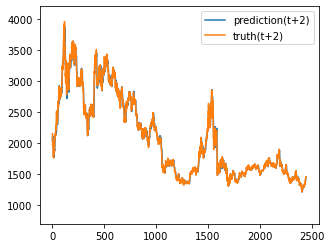

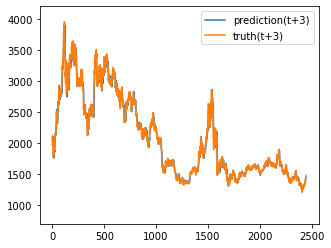

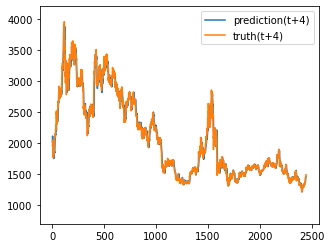

Train epoch:46 	Loss: -15.800959| Loss_in: 0.016944| Loss_out: 0.014834


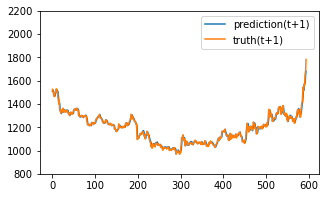

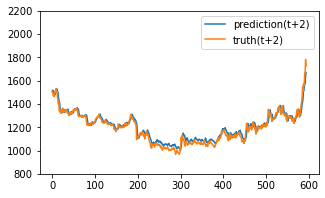

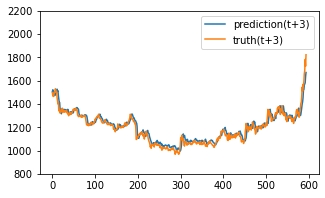

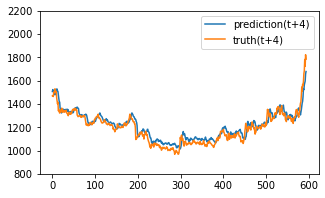

Test epoch:46 	Loss: 0.108120

Epoch: 47


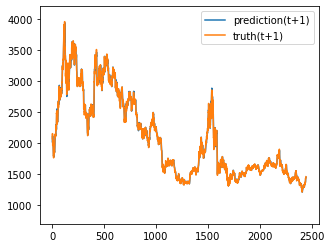

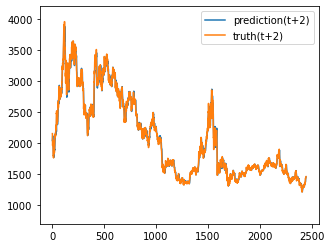

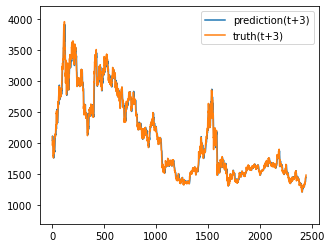

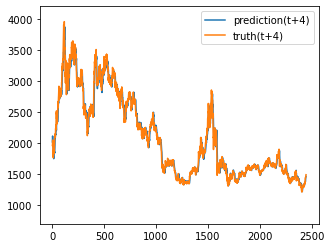

Train epoch:47 	Loss: -15.814294| Loss_in: 0.016674| Loss_out: 0.014729


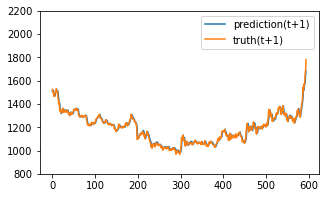

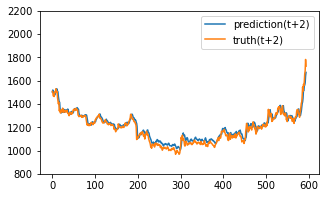

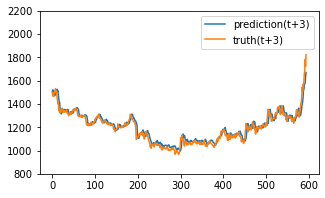

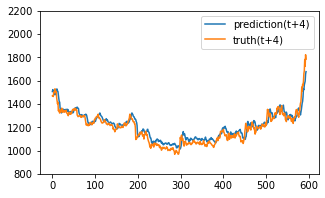

Test epoch:47 	Loss: 0.108281

Epoch: 48


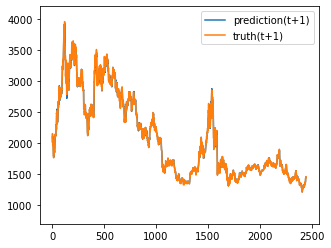

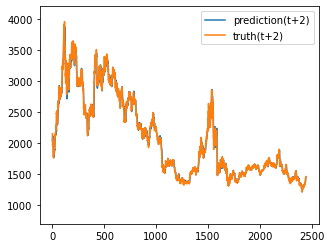

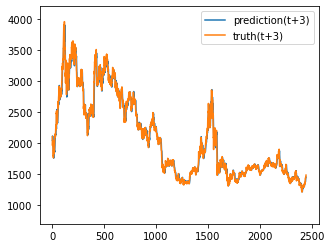

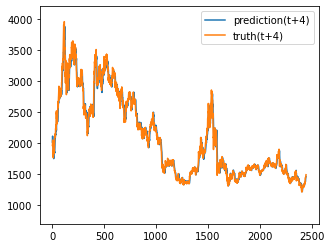

Train epoch:48 	Loss: -15.788397| Loss_in: 0.016448| Loss_out: 0.014716


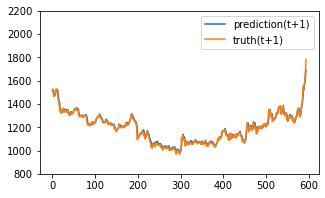

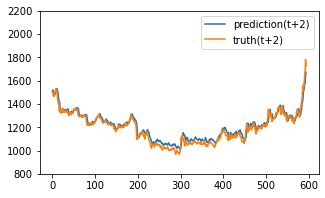

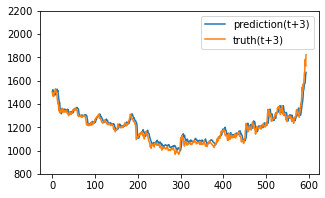

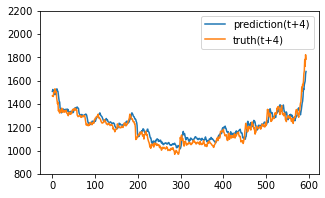

Test epoch:48 	Loss: 0.110314

Epoch: 49


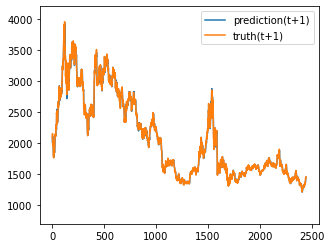

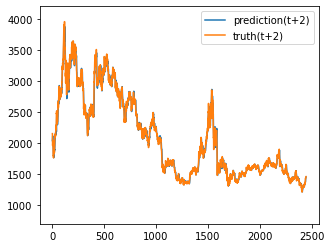

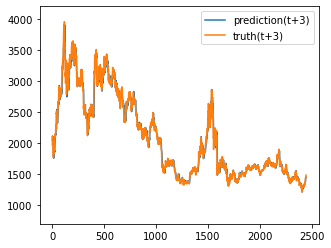

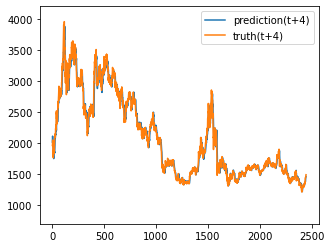

Train epoch:49 	Loss: -15.826746| Loss_in: 0.016251| Loss_out: 0.014297


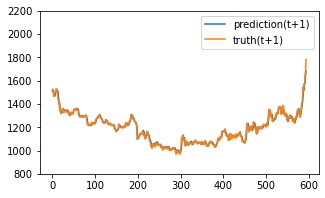

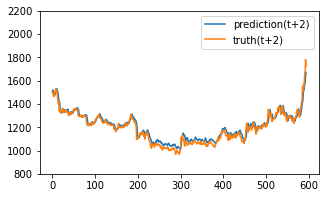

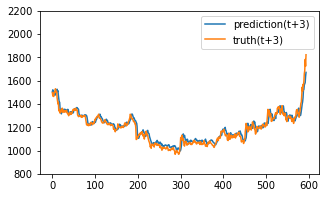

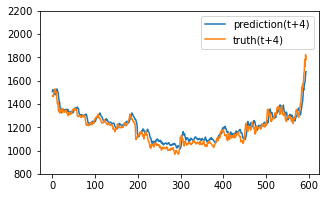

Test epoch:49 	Loss: 0.108281

Epoch: 50


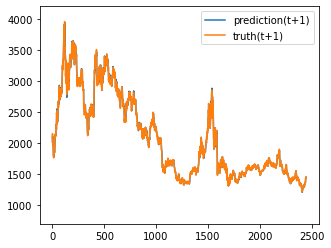

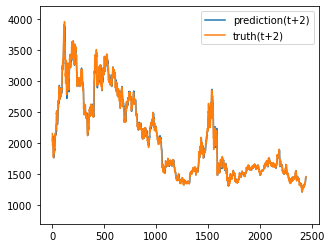

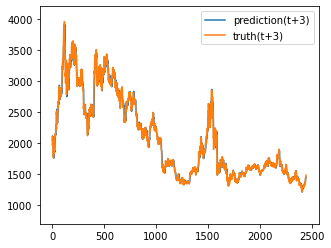

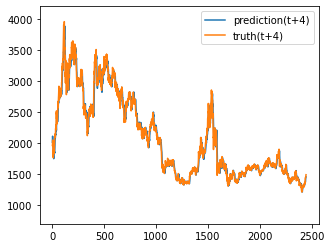

Train epoch:50 	Loss: -15.802101| Loss_in: 0.016035| Loss_out: 0.014554


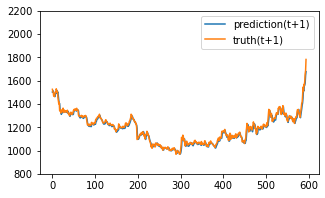

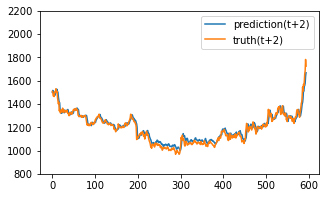

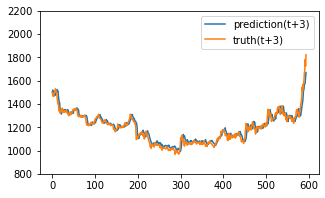

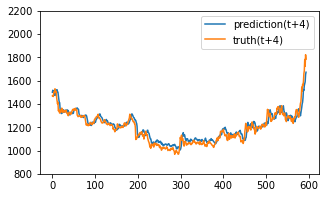

Test epoch:50 	Loss: 0.104053

Epoch: 51


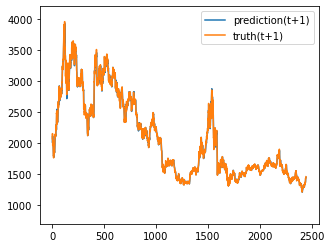

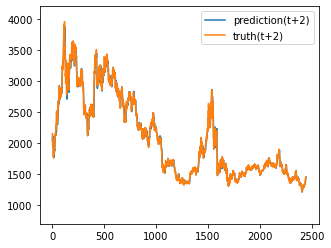

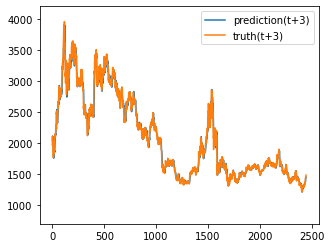

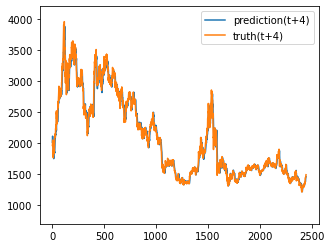

Train epoch:51 	Loss: -15.831558| Loss_in: 0.015847| Loss_out: 0.013889


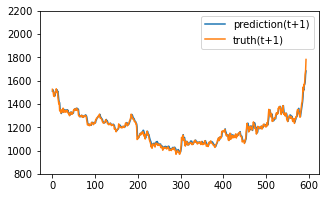

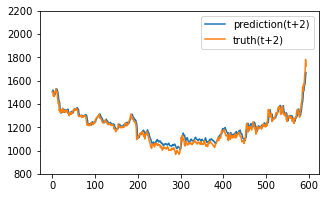

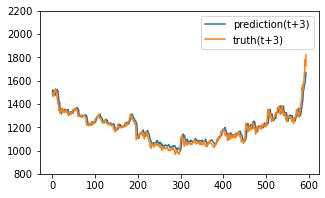

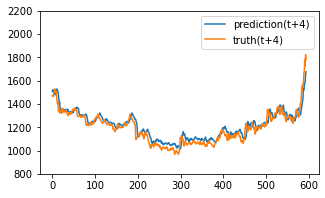

Test epoch:51 	Loss: 0.108364

Epoch: 52


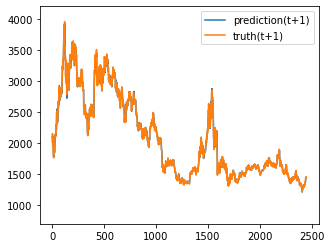

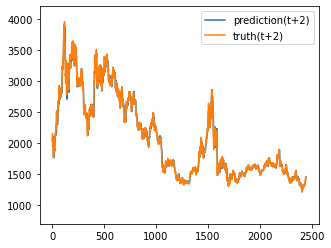

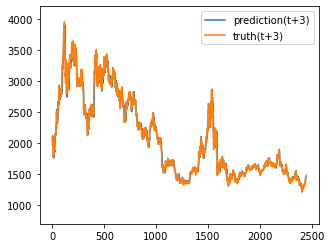

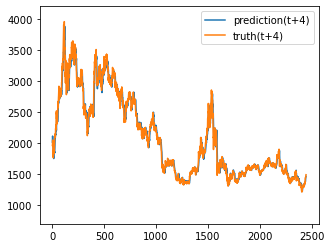

Train epoch:52 	Loss: -15.841583| Loss_in: 0.015618| Loss_out: 0.013981


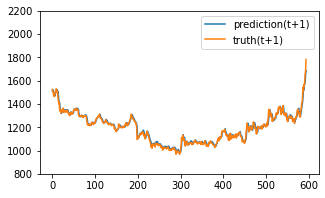

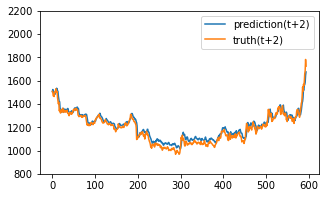

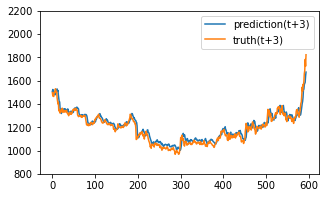

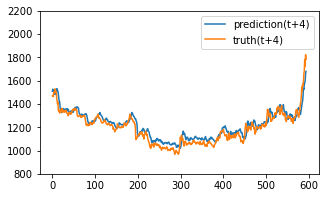

Test epoch:52 	Loss: 0.113891

Epoch: 53


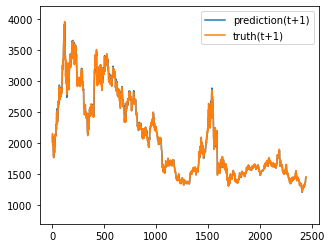

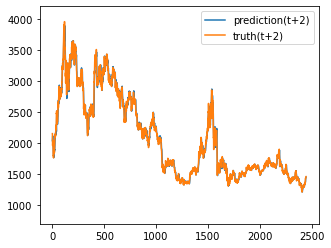

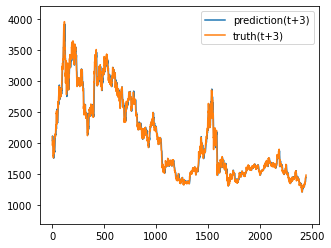

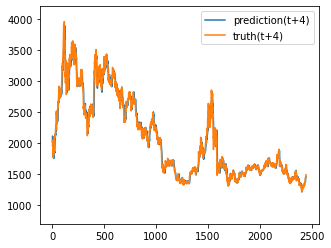

Train epoch:53 	Loss: -15.796529| Loss_in: 0.015470| Loss_out: 0.013897


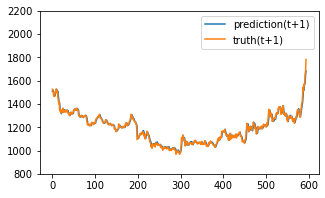

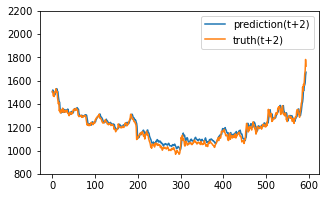

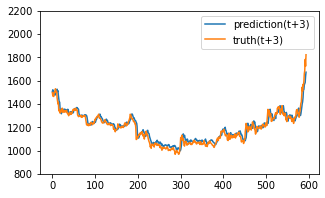

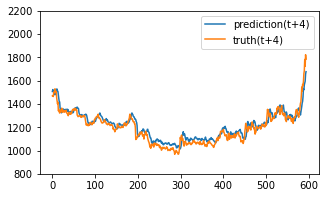

Test epoch:53 	Loss: 0.108221

Epoch: 54


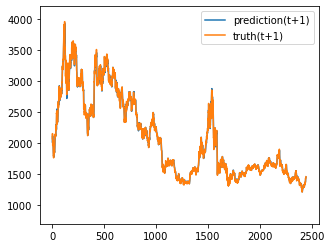

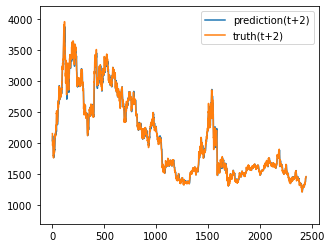

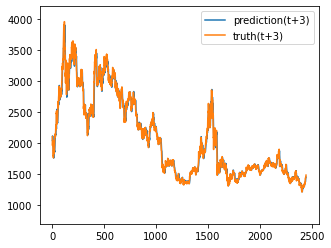

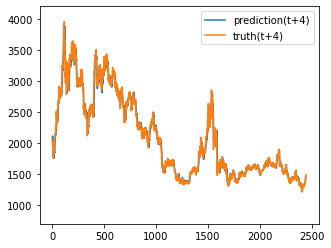

Train epoch:54 	Loss: -15.851615| Loss_in: 0.015372| Loss_out: 0.013730


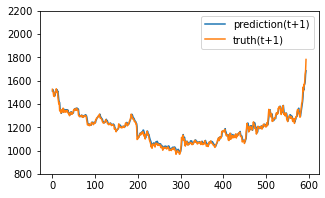

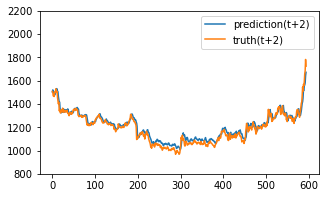

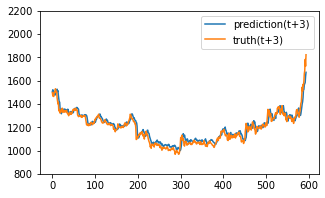

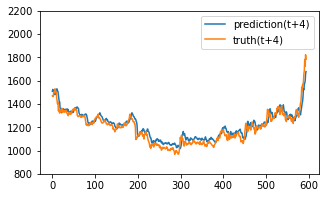

Test epoch:54 	Loss: 0.110423

Epoch: 55


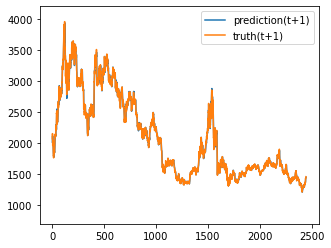

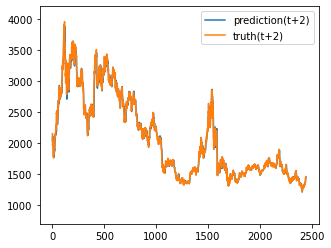

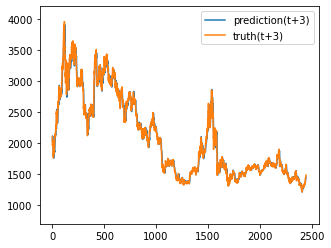

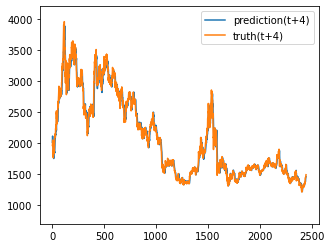

Train epoch:55 	Loss: -15.863076| Loss_in: 0.015189| Loss_out: 0.013461


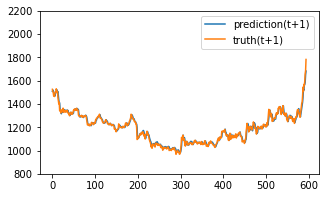

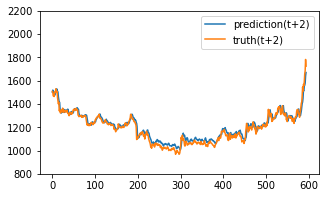

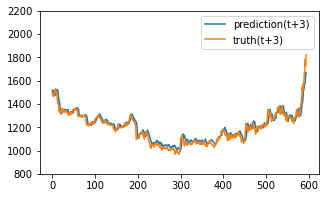

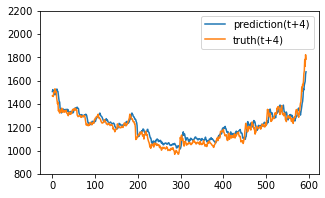

Test epoch:55 	Loss: 0.107878

Epoch: 56


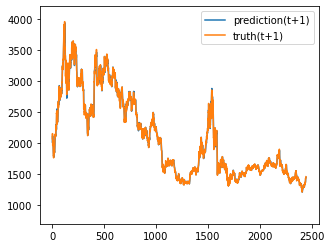

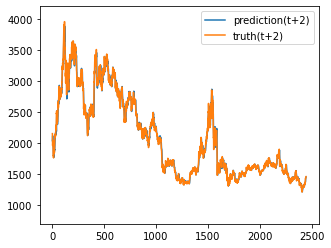

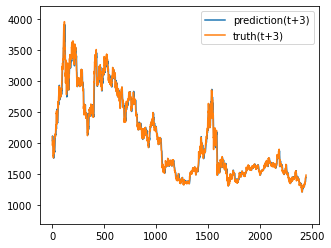

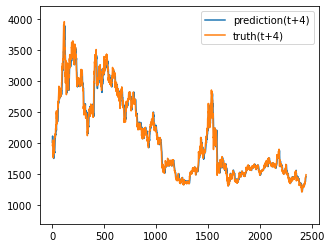

Train epoch:56 	Loss: -15.862606| Loss_in: 0.015036| Loss_out: 0.013460


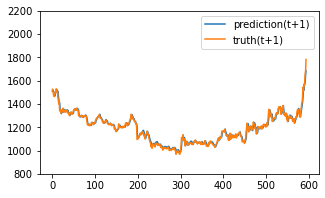

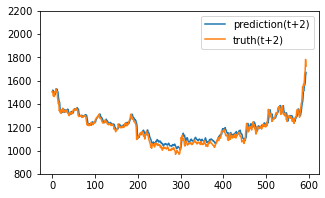

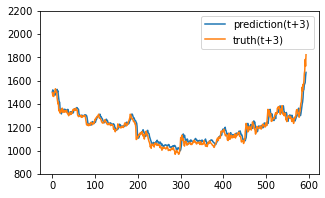

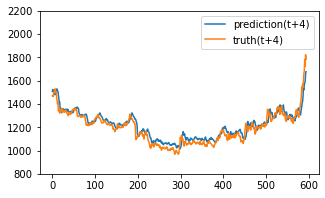

Test epoch:56 	Loss: 0.108524

Epoch: 57


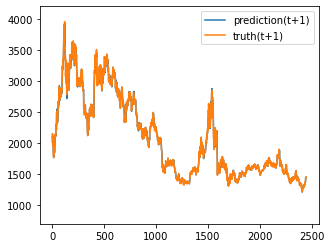

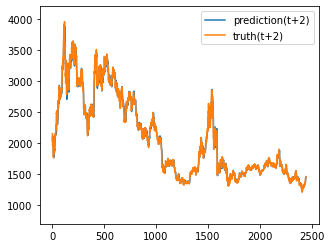

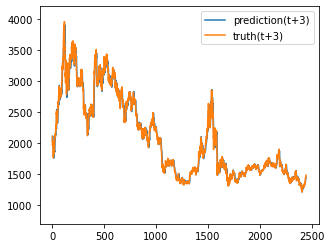

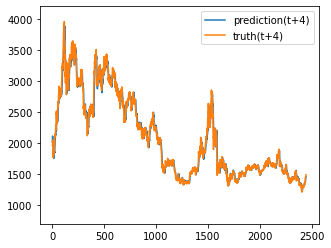

Train epoch:57 	Loss: -15.875725| Loss_in: 0.014842| Loss_out: 0.013160


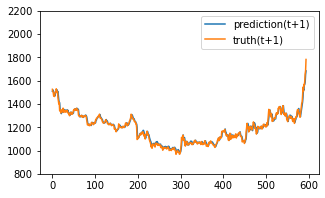

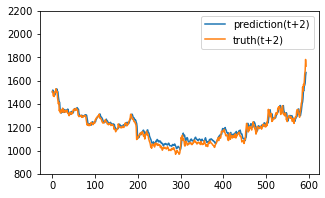

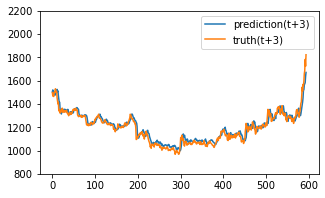

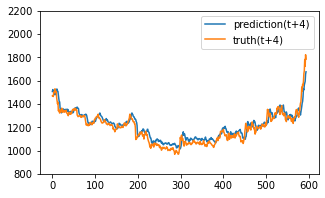

Test epoch:57 	Loss: 0.108418

Epoch: 58


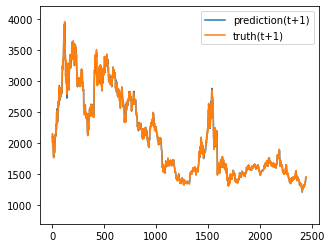

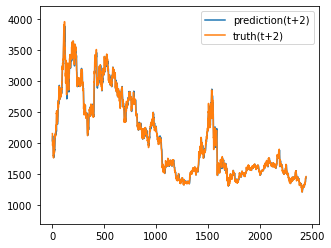

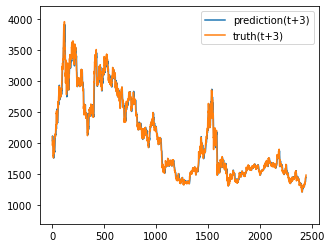

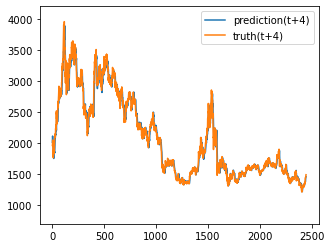

Train epoch:58 	Loss: -15.878286| Loss_in: 0.014678| Loss_out: 0.013210


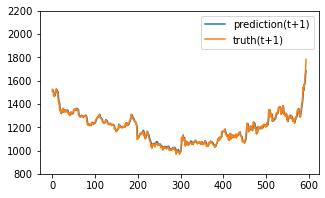

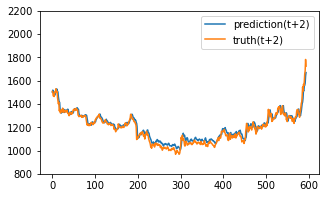

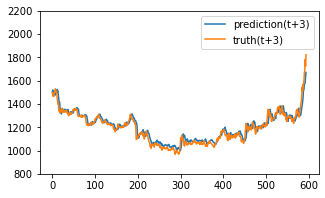

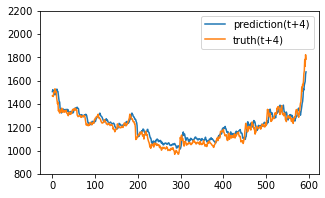

Test epoch:58 	Loss: 0.107721

Epoch: 59


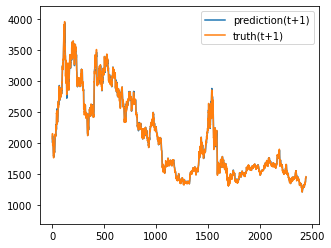

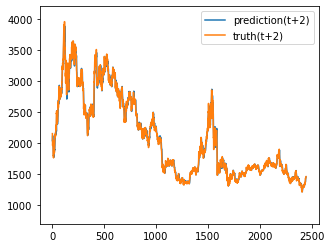

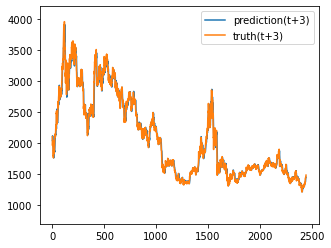

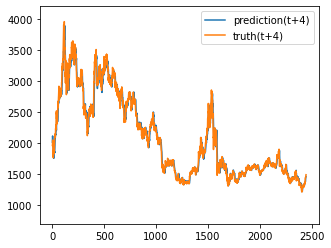

Train epoch:59 	Loss: -15.882305| Loss_in: 0.014564| Loss_out: 0.012941


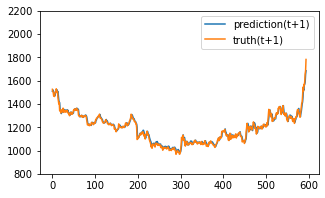

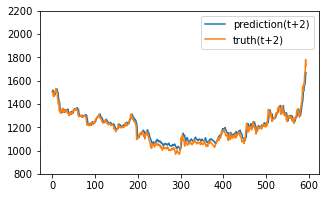

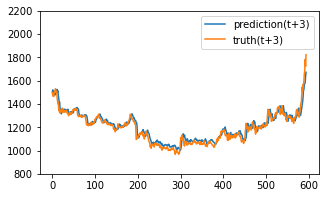

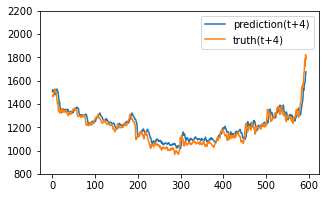

Test epoch:59 	Loss: 0.108496

Epoch: 60


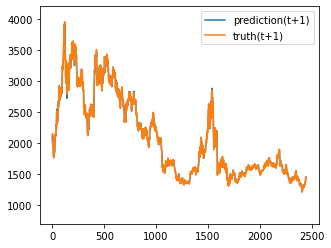

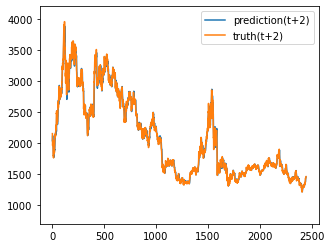

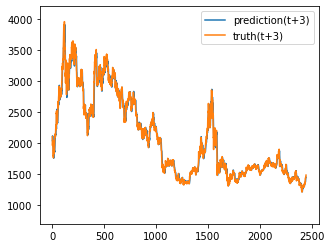

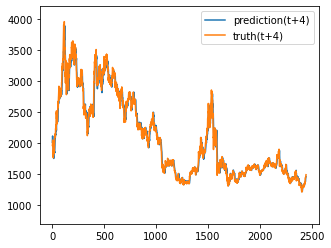

Train epoch:60 	Loss: -15.893568| Loss_in: 0.014420| Loss_out: 0.012823


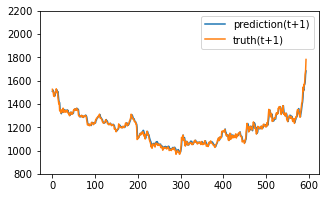

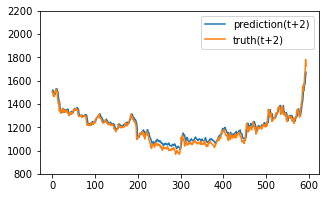

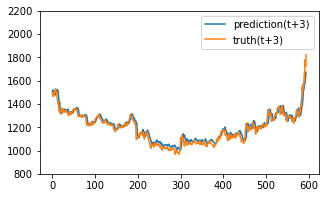

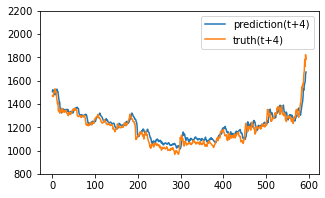

Test epoch:60 	Loss: 0.108683

Epoch: 61


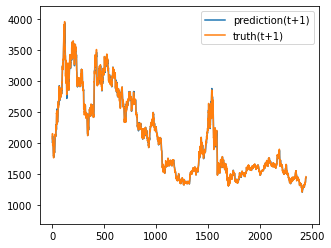

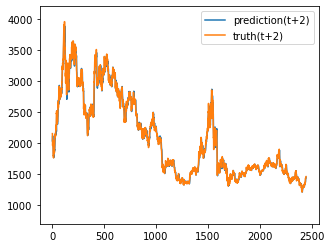

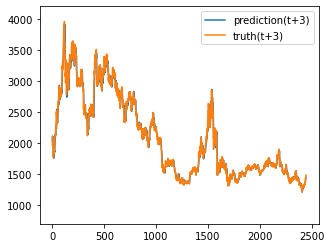

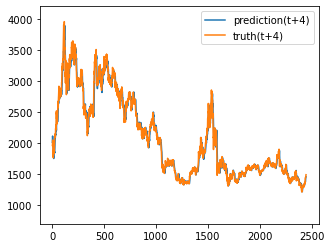

Train epoch:61 	Loss: -15.891098| Loss_in: 0.014297| Loss_out: 0.012981


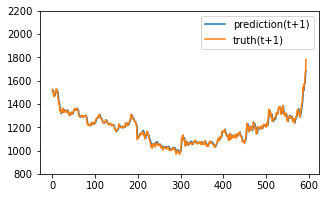

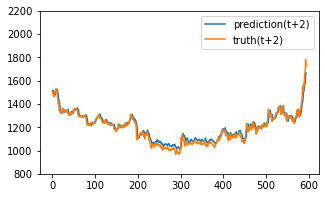

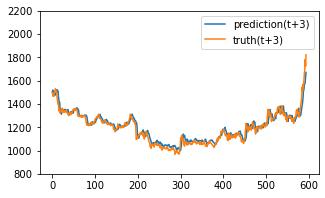

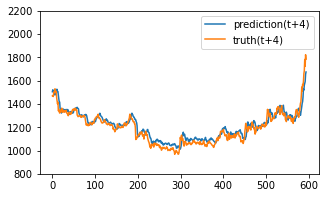

Test epoch:61 	Loss: 0.106196

Epoch: 62


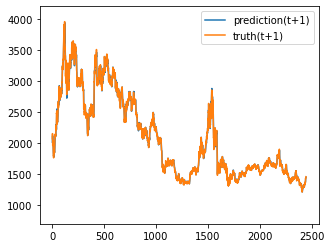

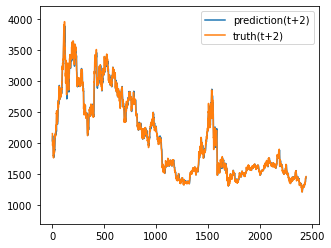

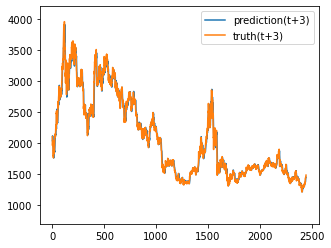

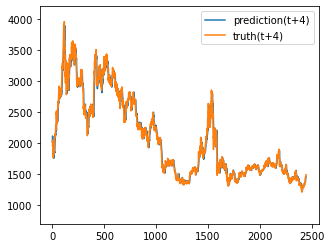

Train epoch:62 	Loss: -15.900904| Loss_in: 0.014241| Loss_out: 0.013060


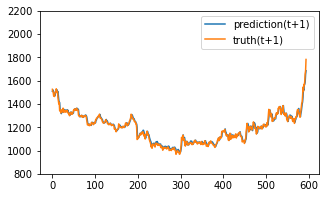

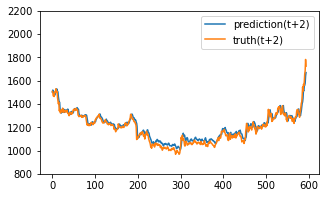

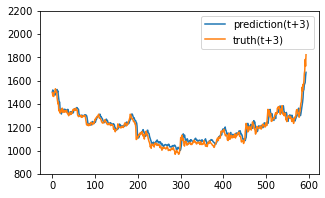

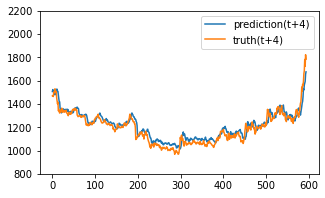

Test epoch:62 	Loss: 0.108497

Epoch: 63


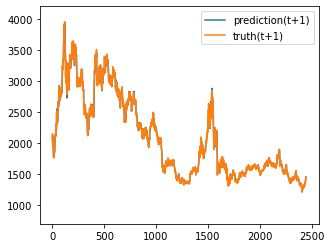

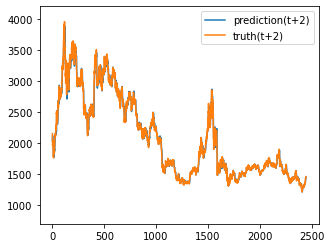

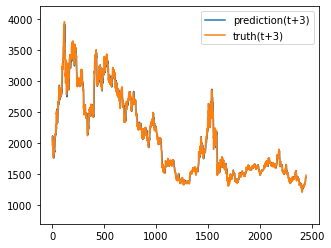

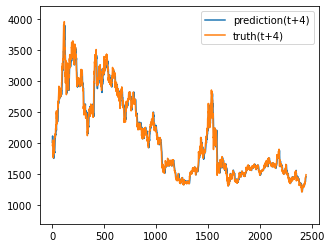

Train epoch:63 	Loss: -15.904779| Loss_in: 0.014133| Loss_out: 0.012828


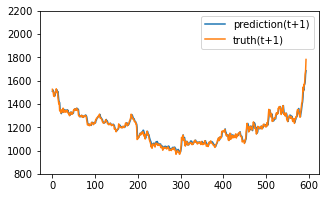

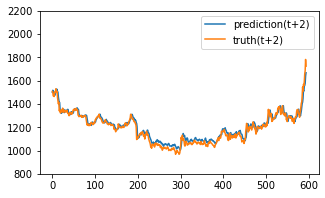

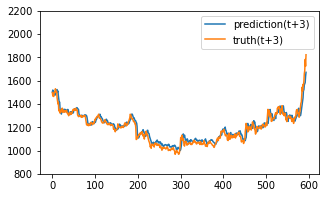

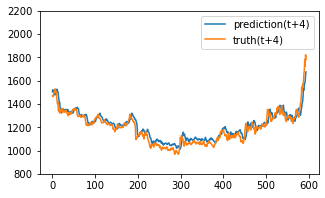

Test epoch:63 	Loss: 0.106970

Epoch: 64


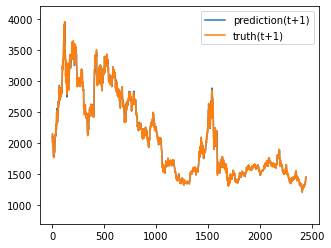

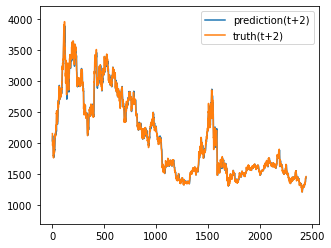

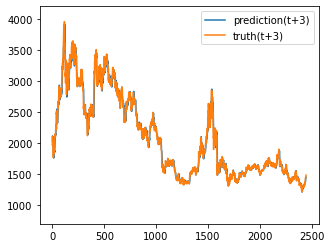

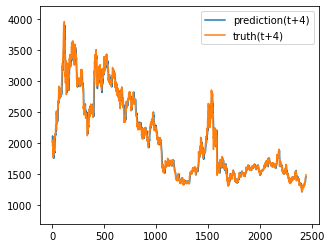

Train epoch:64 	Loss: -15.855512| Loss_in: 0.013961| Loss_out: 0.012262


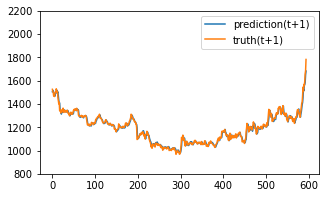

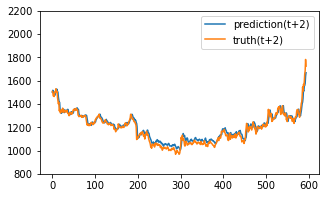

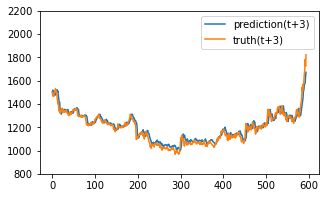

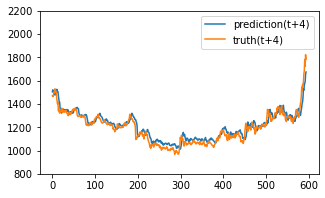

Test epoch:64 	Loss: 0.106338

Epoch: 65


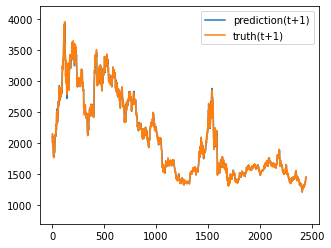

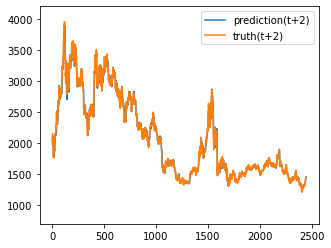

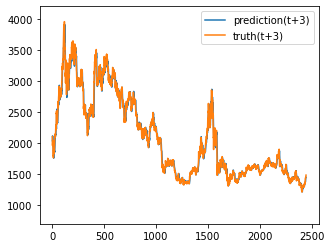

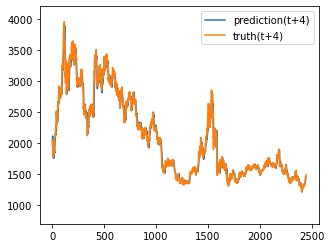

Train epoch:65 	Loss: -15.914742| Loss_in: 0.013819| Loss_out: 0.012550


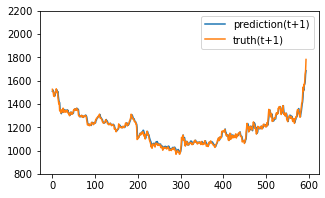

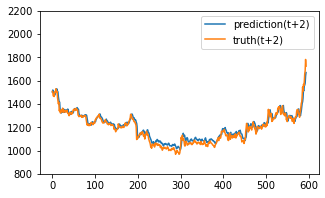

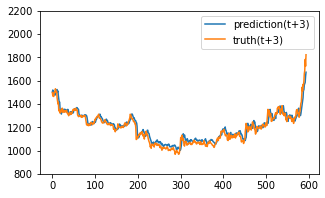

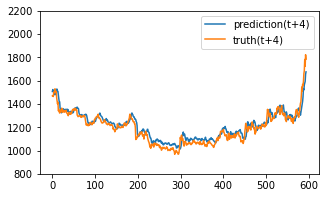

Test epoch:65 	Loss: 0.108186

Epoch: 66


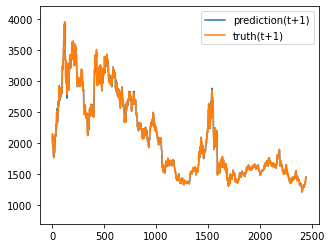

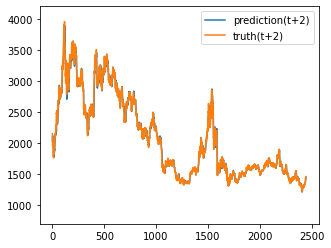

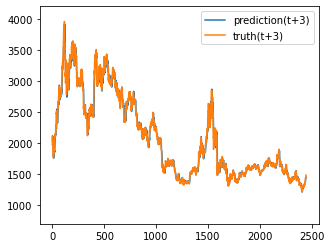

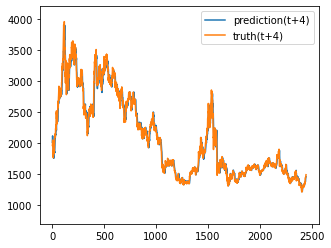

Train epoch:66 	Loss: -15.916206| Loss_in: 0.013784| Loss_out: 0.012439


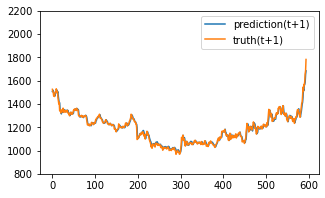

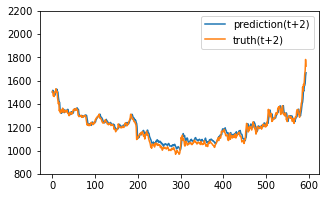

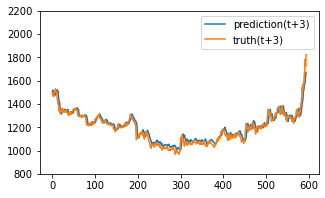

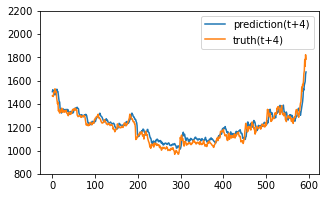

Test epoch:66 	Loss: 0.106628

Epoch: 67


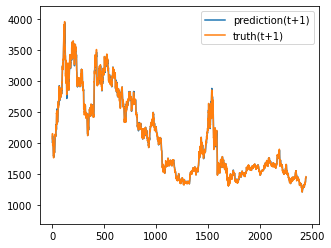

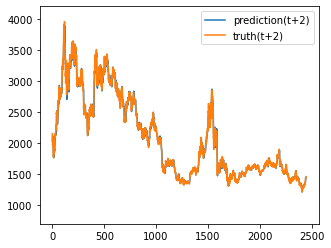

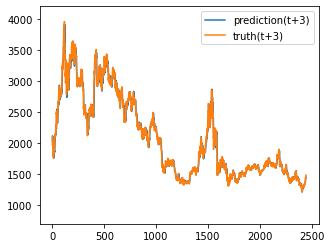

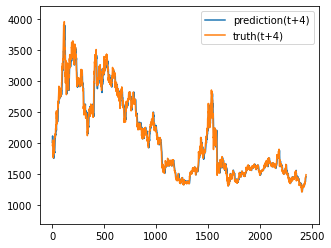

Train epoch:67 	Loss: -15.895708| Loss_in: 0.013654| Loss_out: 0.012438


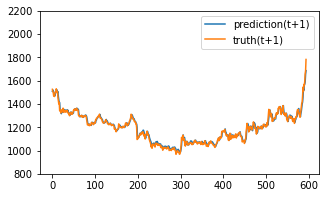

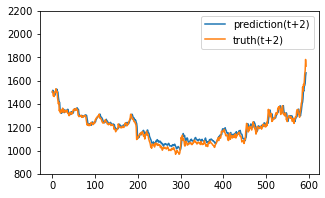

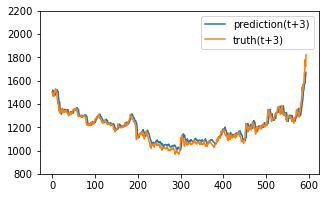

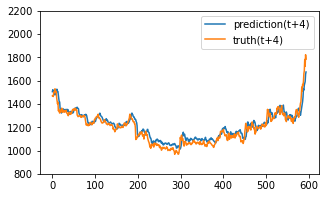

Test epoch:67 	Loss: 0.107284

Epoch: 68


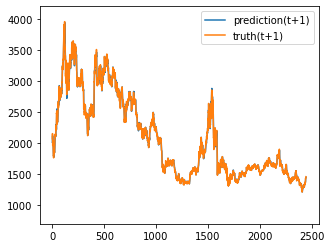

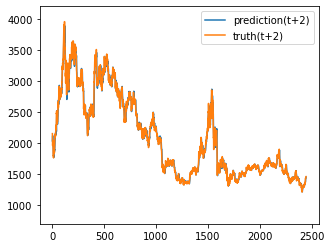

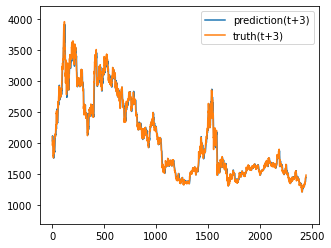

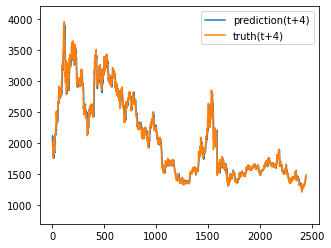

Train epoch:68 	Loss: -15.926236| Loss_in: 0.013573| Loss_out: 0.012172


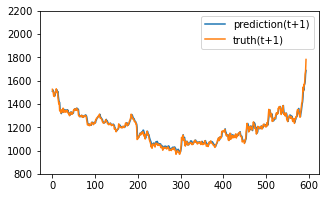

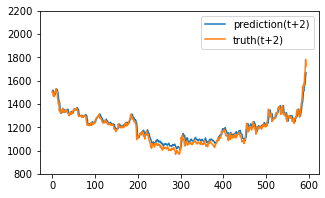

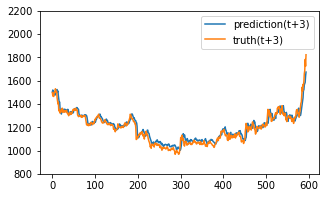

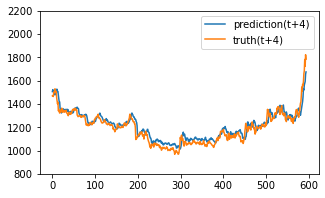

Test epoch:68 	Loss: 0.107836

Epoch: 69


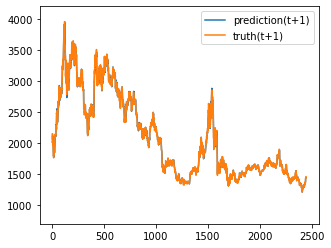

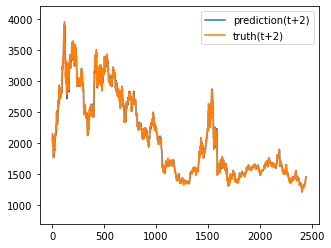

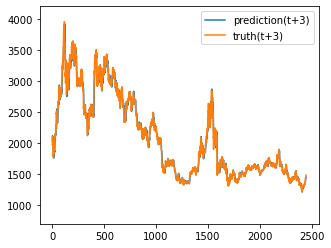

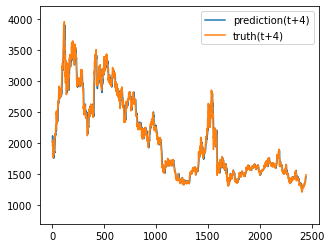

Train epoch:69 	Loss: -15.928583| Loss_in: 0.013416| Loss_out: 0.011674


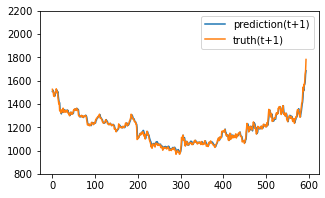

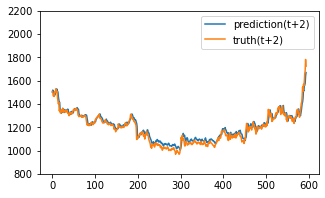

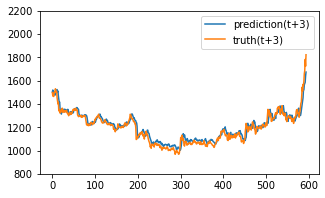

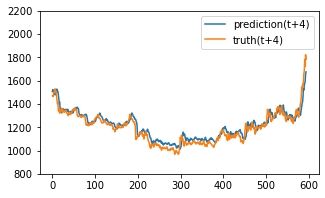

Test epoch:69 	Loss: 0.107946

Epoch: 70


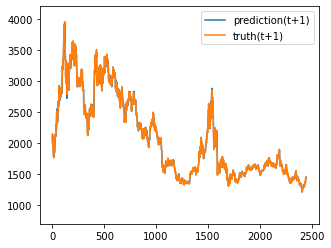

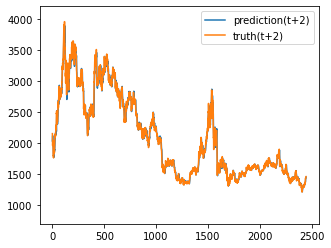

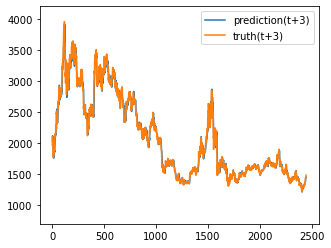

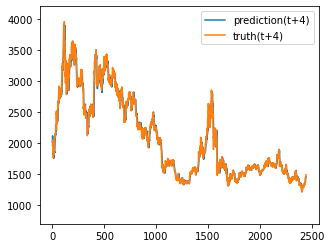

Train epoch:70 	Loss: -15.937023| Loss_in: 0.013263| Loss_out: 0.012151


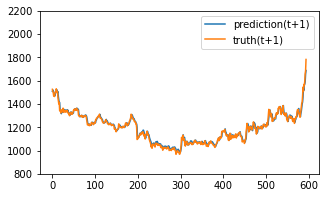

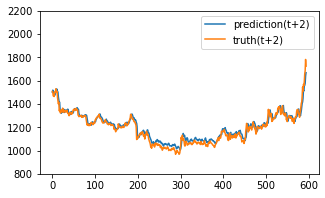

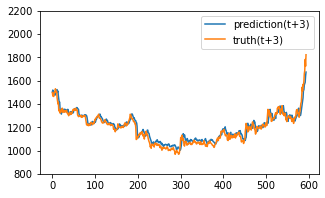

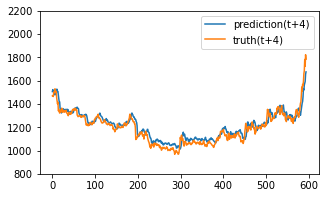

Test epoch:70 	Loss: 0.107905

Epoch: 71


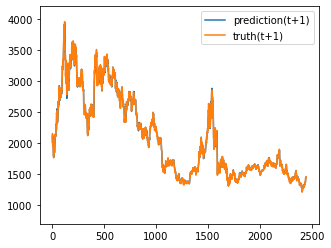

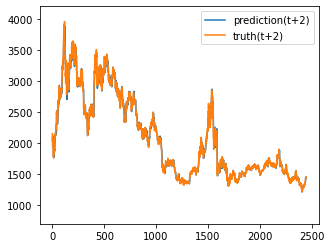

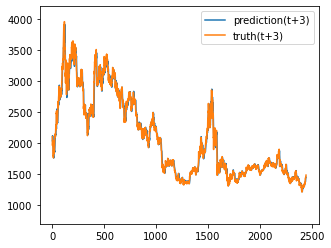

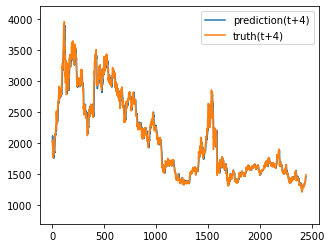

Train epoch:71 	Loss: -15.890088| Loss_in: 0.013240| Loss_out: 0.011842


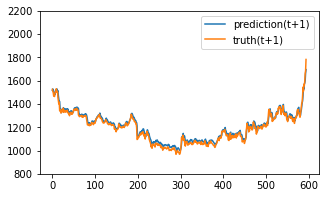

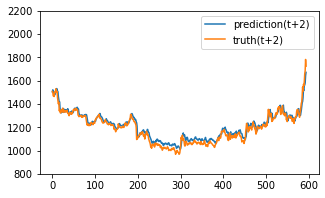

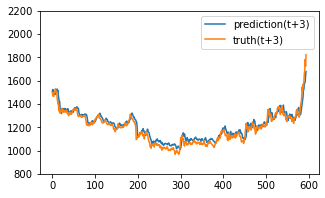

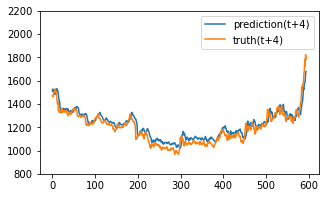

Test epoch:71 	Loss: 0.116640

Epoch: 72


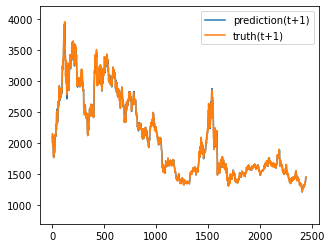

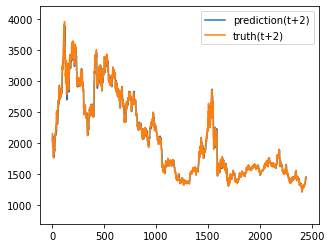

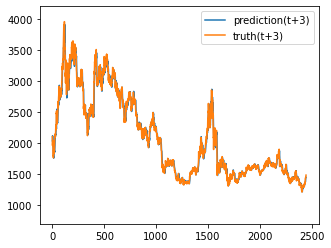

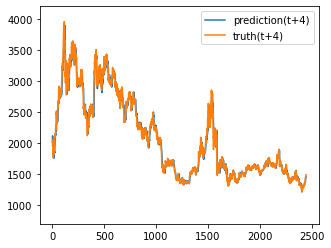

Train epoch:72 	Loss: -15.915100| Loss_in: 0.013184| Loss_out: 0.012071


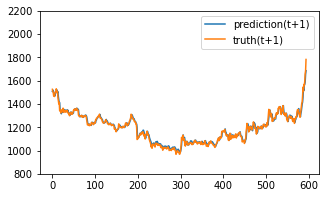

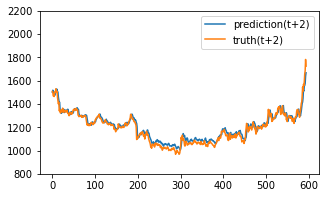

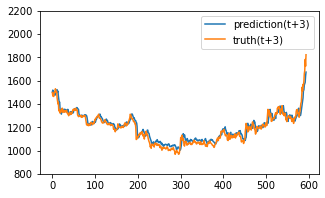

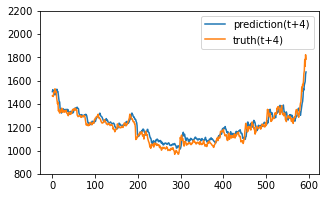

Test epoch:72 	Loss: 0.107571

Epoch: 73


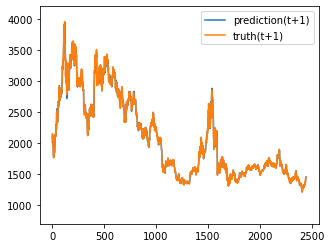

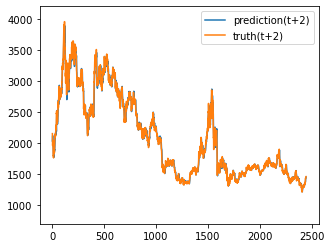

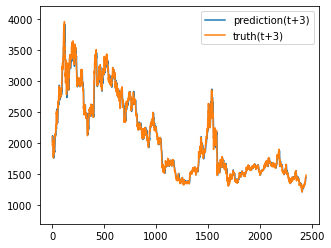

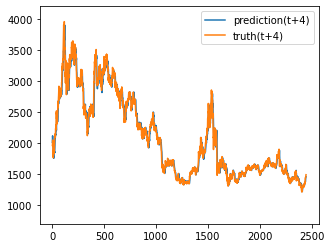

Train epoch:73 	Loss: -15.936338| Loss_in: 0.013106| Loss_out: 0.011887


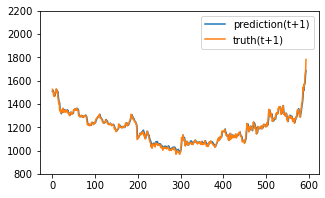

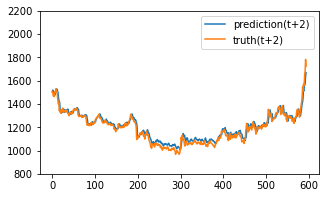

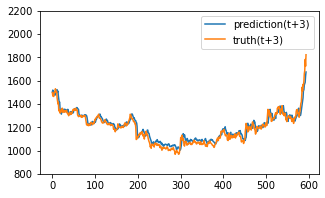

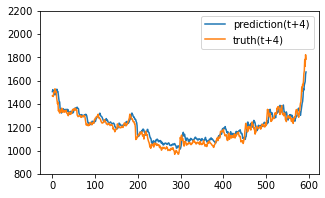

Test epoch:73 	Loss: 0.107717

Epoch: 74


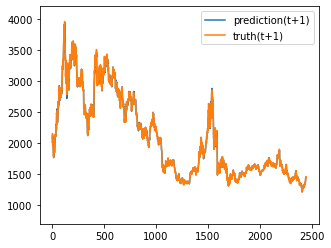

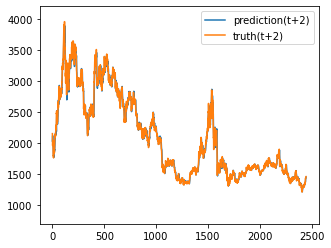

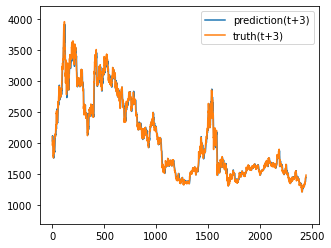

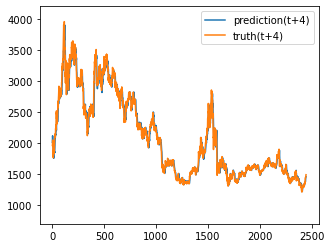

Train epoch:74 	Loss: -15.949272| Loss_in: 0.013083| Loss_out: 0.011966


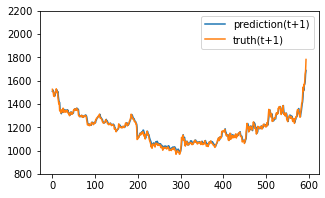

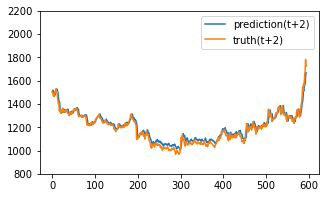

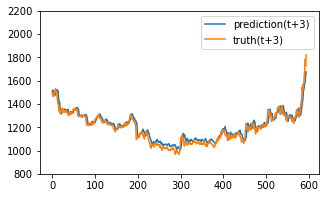

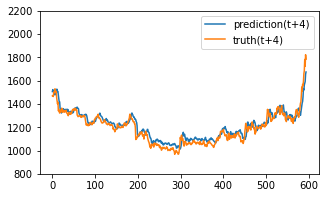

Test epoch:74 	Loss: 0.108019

Epoch: 75


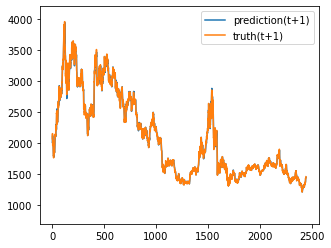

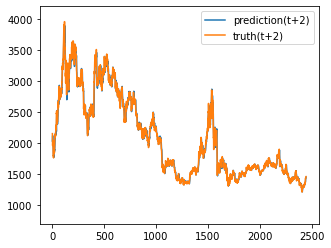

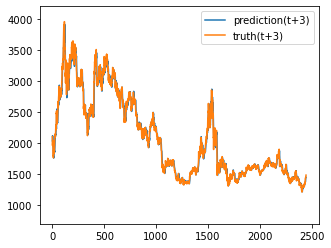

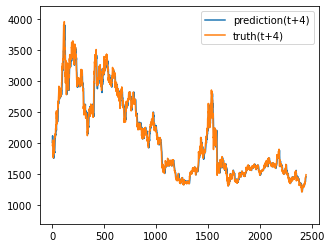

Train epoch:75 	Loss: -15.954545| Loss_in: 0.012996| Loss_out: 0.011799


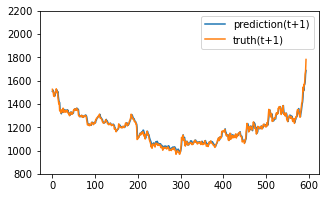

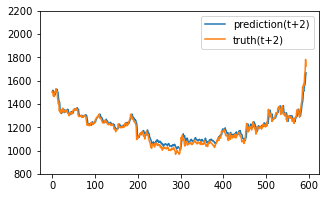

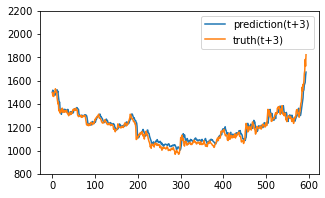

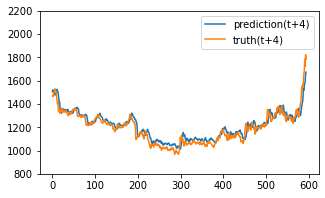

Test epoch:75 	Loss: 0.106836

Epoch: 76


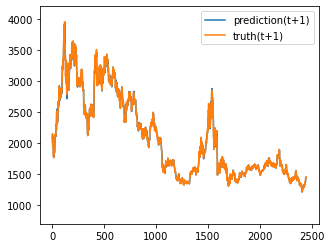

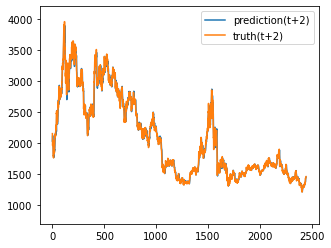

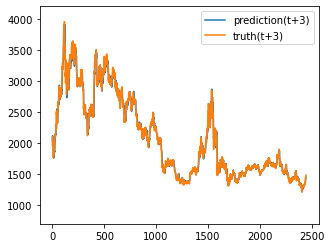

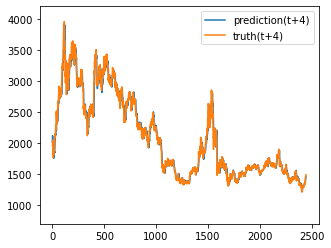

Train epoch:76 	Loss: -15.957174| Loss_in: 0.012907| Loss_out: 0.011637


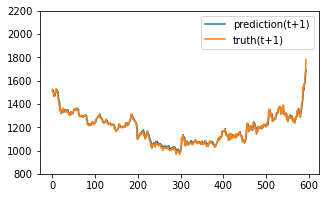

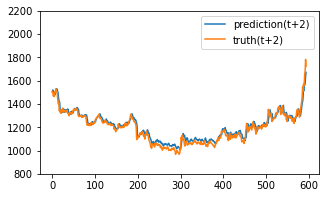

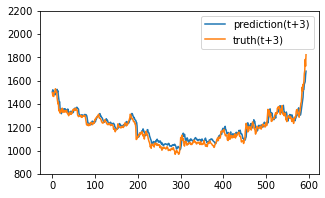

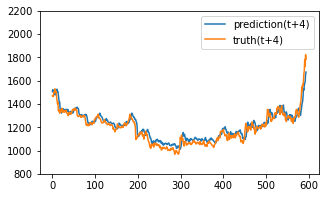

Test epoch:76 	Loss: 0.108450

Epoch: 77


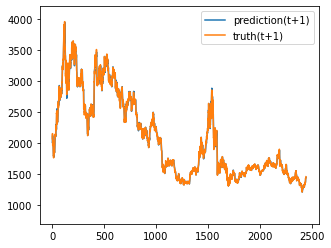

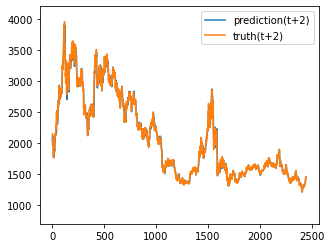

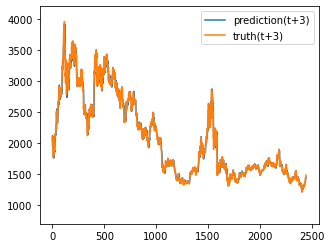

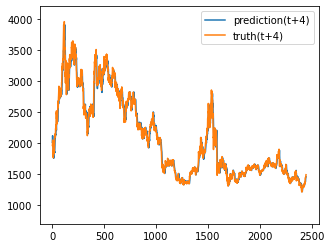

Train epoch:77 	Loss: -15.962617| Loss_in: 0.012781| Loss_out: 0.011355


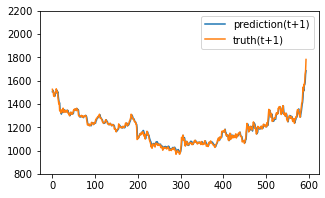

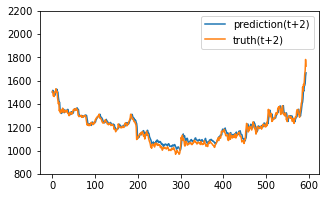

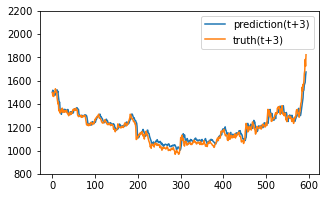

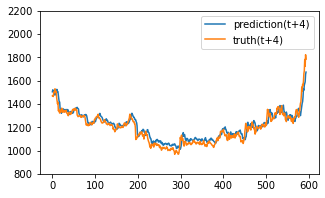

Test epoch:77 	Loss: 0.105581

Epoch: 78


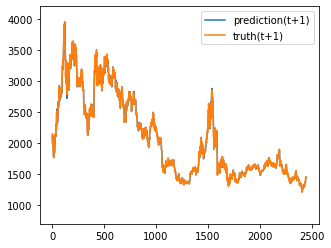

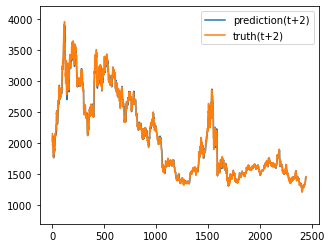

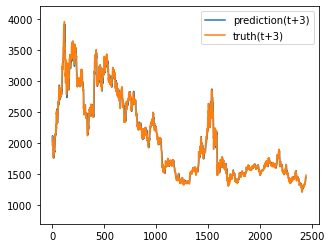

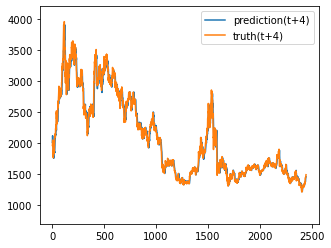

Train epoch:78 	Loss: -15.957634| Loss_in: 0.012720| Loss_out: 0.011746


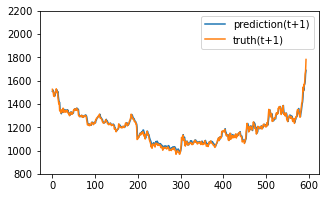

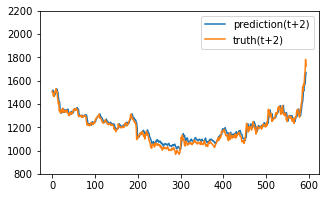

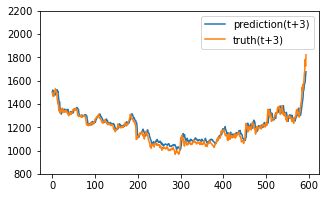

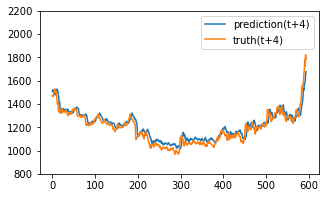

Test epoch:78 	Loss: 0.107960

Epoch: 79


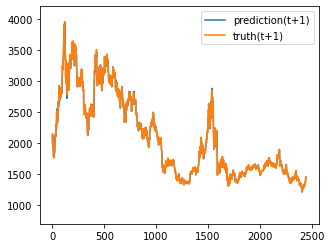

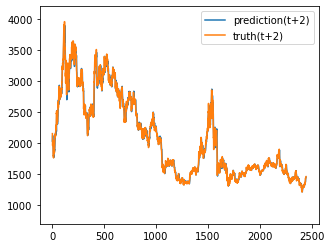

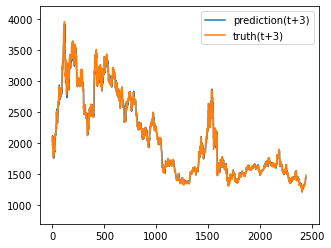

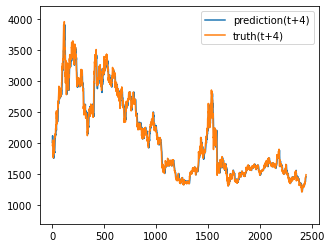

Train epoch:79 	Loss: -15.968068| Loss_in: 0.012668| Loss_out: 0.011338


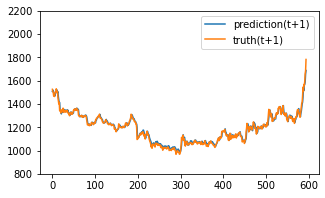

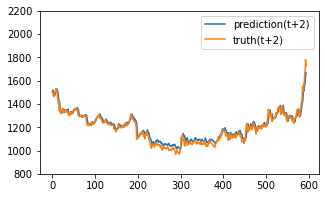

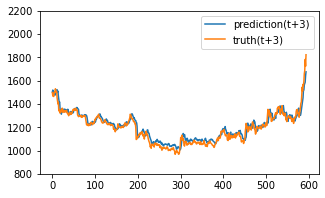

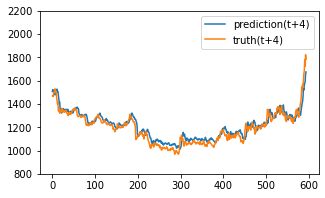

Test epoch:79 	Loss: 0.107969

Epoch: 80


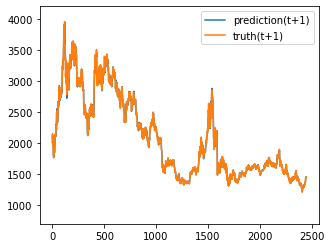

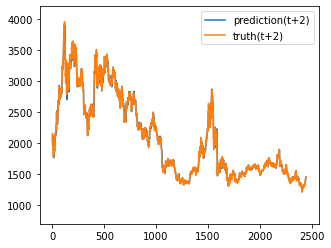

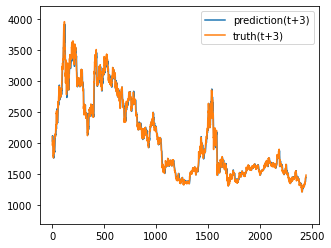

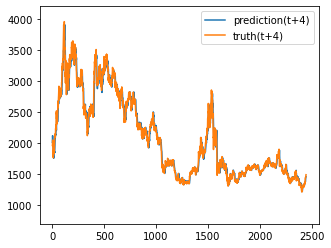

Train epoch:80 	Loss: -15.968493| Loss_in: 0.012587| Loss_out: 0.011523


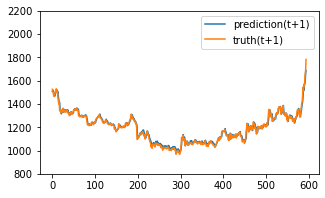

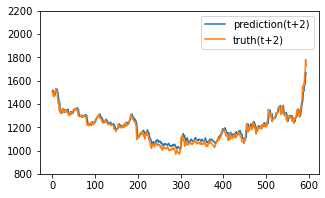

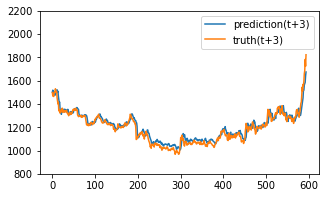

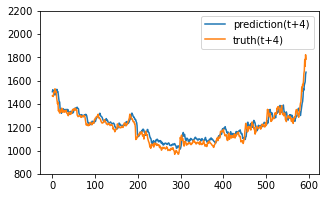

Test epoch:80 	Loss: 0.107679

Epoch: 81


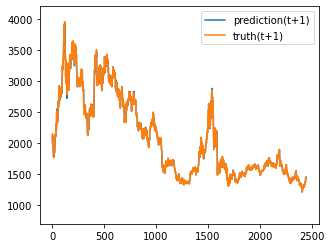

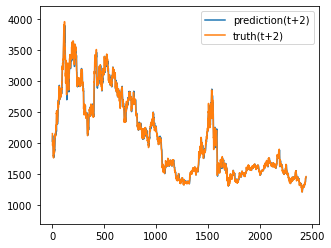

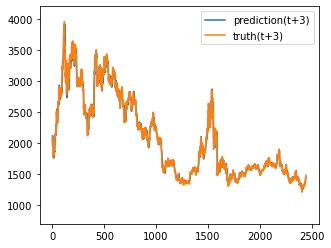

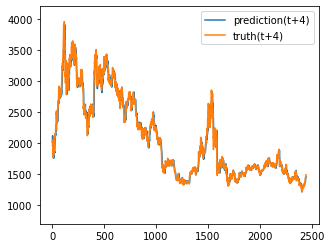

Train epoch:81 	Loss: -15.974805| Loss_in: 0.012551| Loss_out: 0.011147


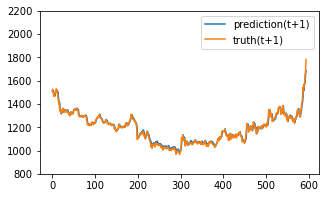

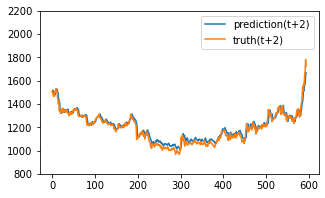

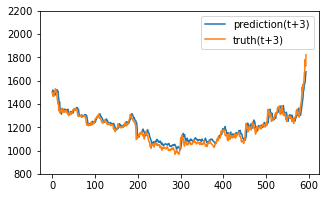

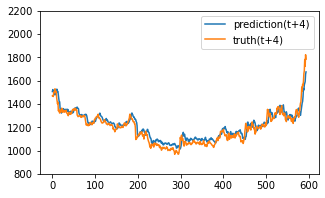

Test epoch:81 	Loss: 0.108322

Epoch: 82


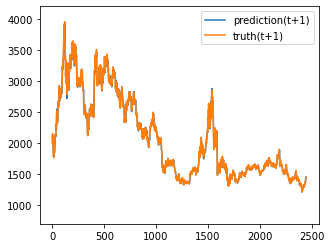

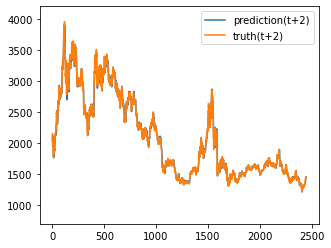

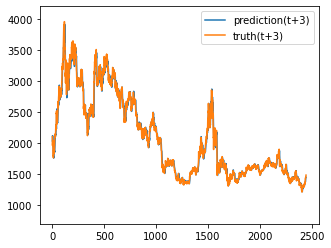

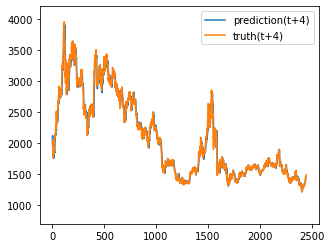

Train epoch:82 	Loss: -15.970123| Loss_in: 0.012426| Loss_out: 0.011511


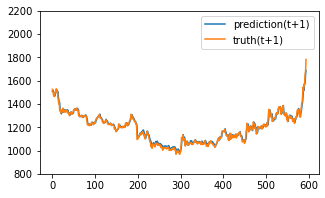

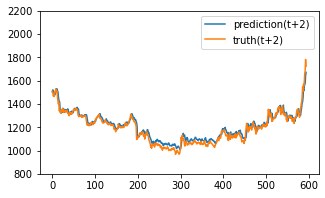

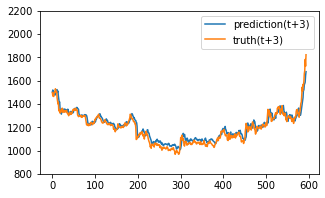

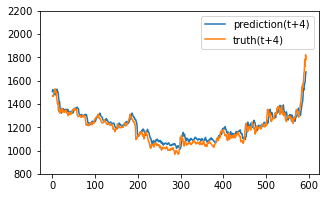

Test epoch:82 	Loss: 0.109012

Epoch: 83


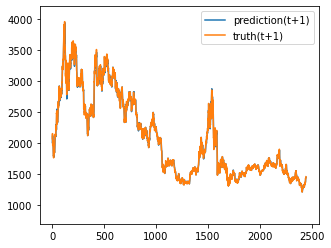

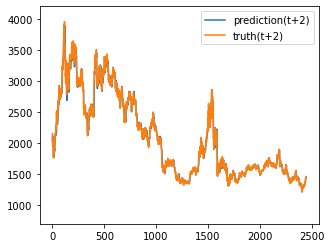

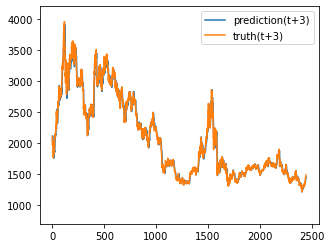

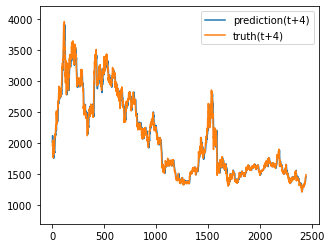

Train epoch:83 	Loss: -15.975992| Loss_in: 0.012366| Loss_out: 0.011228


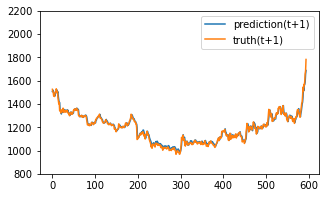

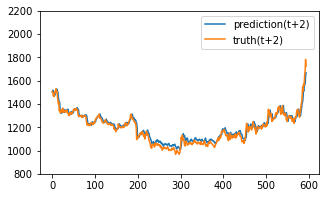

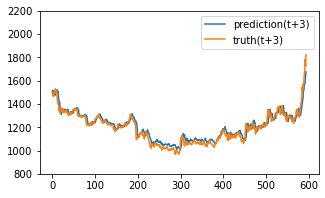

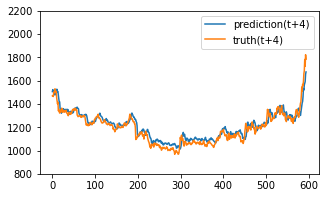

Test epoch:83 	Loss: 0.107473

Epoch: 84


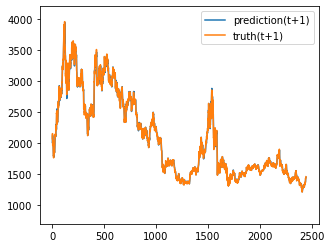

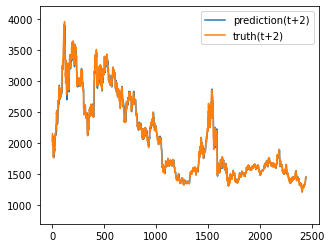

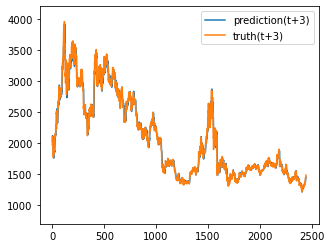

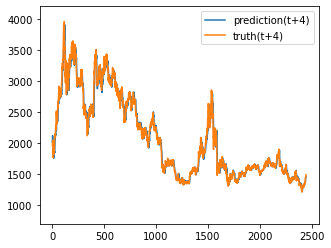

Train epoch:84 	Loss: -15.984797| Loss_in: 0.012343| Loss_out: 0.011215


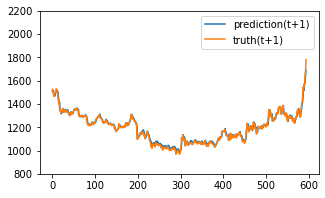

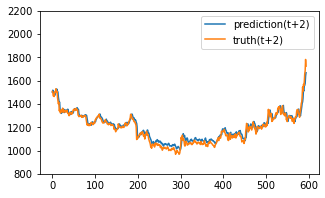

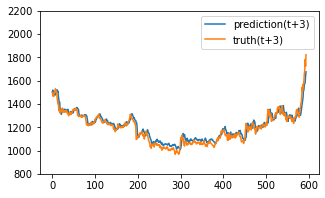

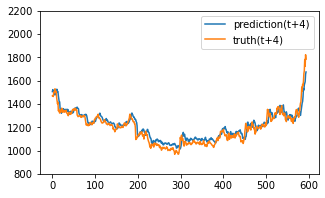

Test epoch:84 	Loss: 0.108210

Epoch: 85


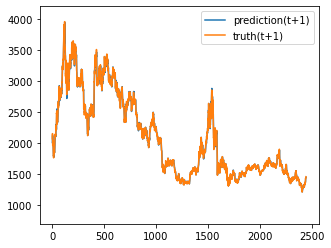

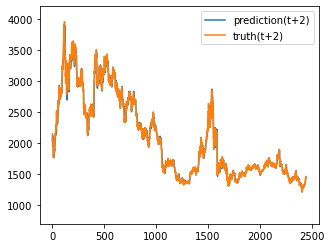

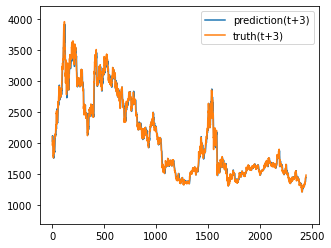

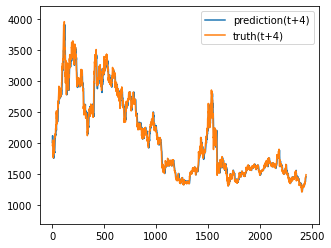

Train epoch:85 	Loss: -15.988133| Loss_in: 0.012276| Loss_out: 0.011088


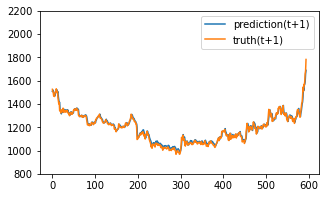

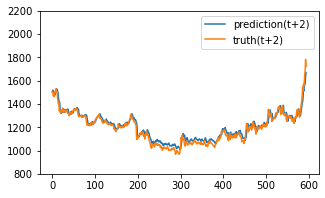

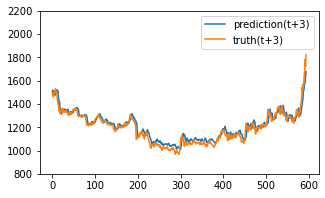

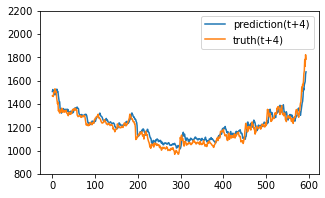

Test epoch:85 	Loss: 0.109175

Epoch: 86


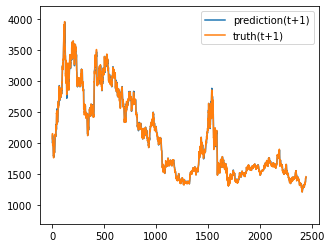

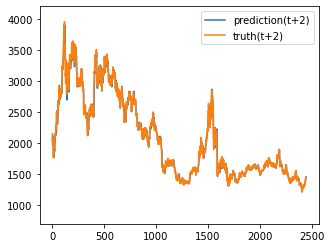

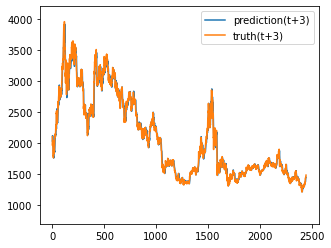

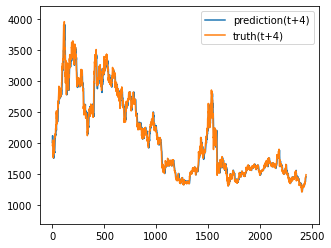

Train epoch:86 	Loss: -15.987311| Loss_in: 0.012196| Loss_out: 0.011259


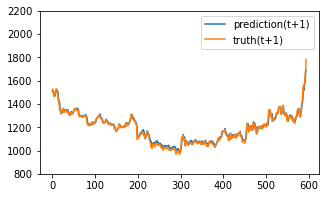

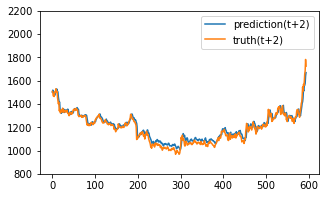

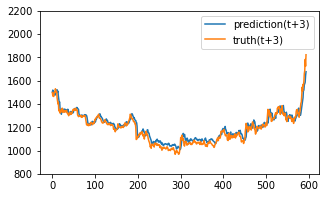

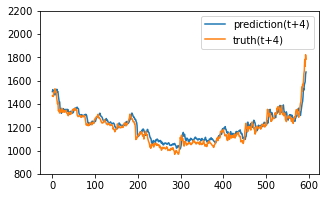

Test epoch:86 	Loss: 0.108674

Epoch: 87


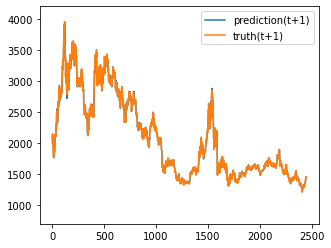

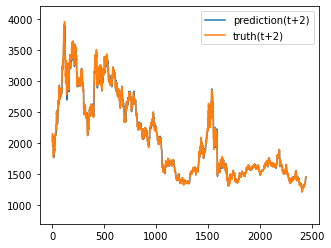

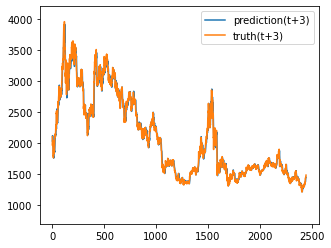

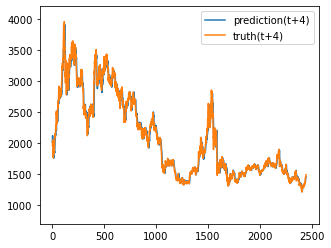

Train epoch:87 	Loss: -15.997469| Loss_in: 0.012170| Loss_out: 0.011017


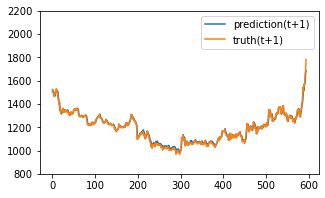

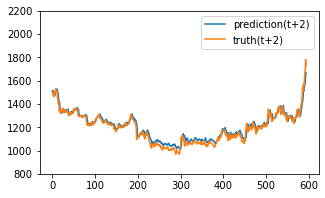

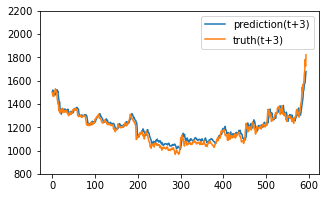

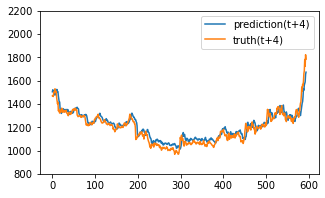

Test epoch:87 	Loss: 0.108365

Epoch: 88


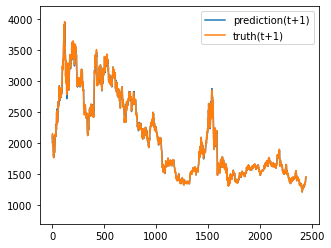

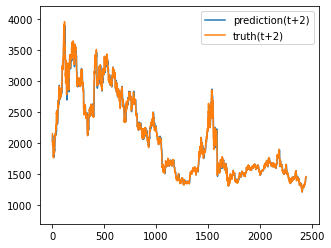

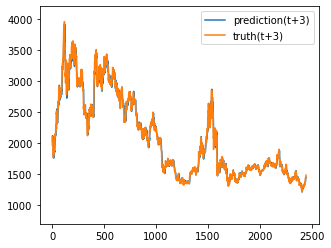

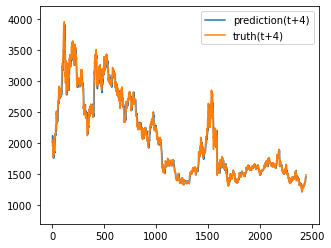

Train epoch:88 	Loss: -15.997164| Loss_in: 0.012116| Loss_out: 0.011040


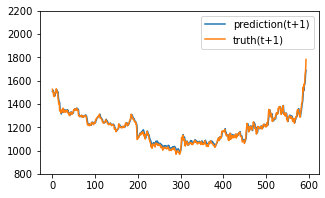

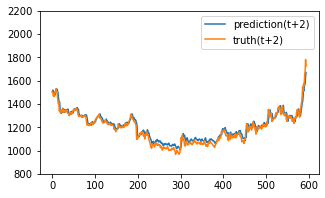

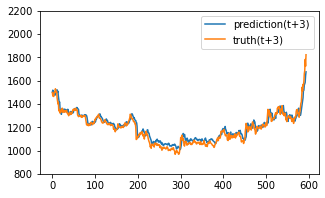

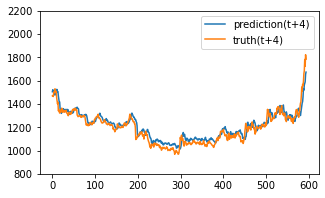

Test epoch:88 	Loss: 0.108582

Epoch: 89


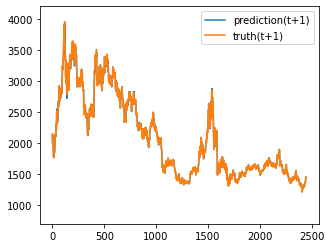

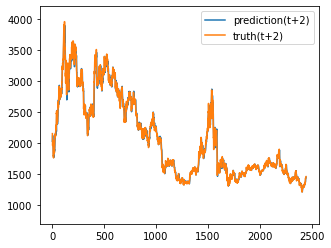

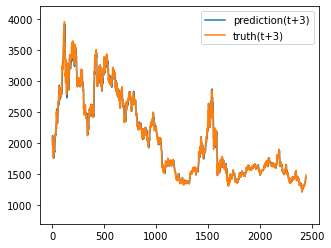

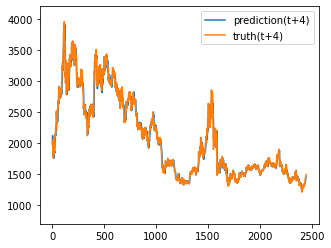

Train epoch:89 	Loss: -16.001599| Loss_in: 0.012032| Loss_out: 0.010823


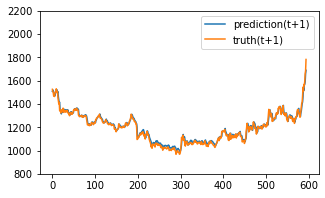

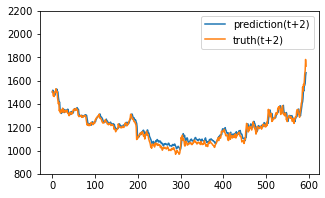

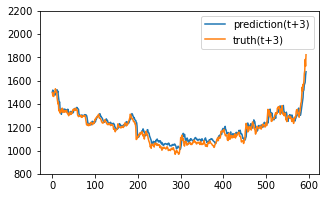

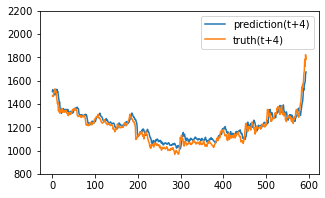

Test epoch:89 	Loss: 0.109122

Epoch: 90


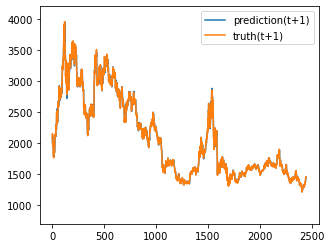

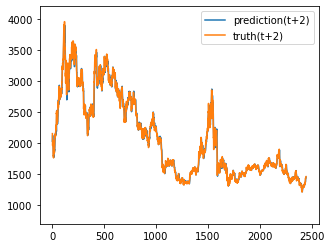

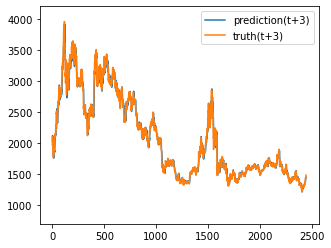

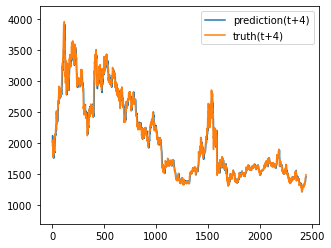

Train epoch:90 	Loss: -16.004692| Loss_in: 0.012004| Loss_out: 0.011164


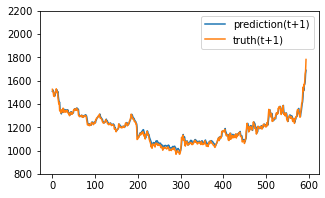

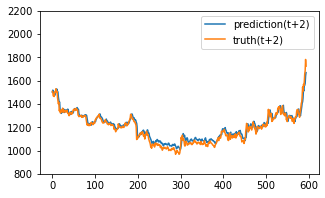

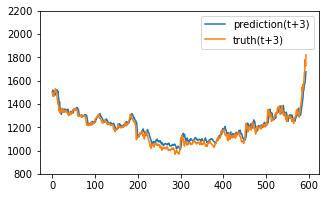

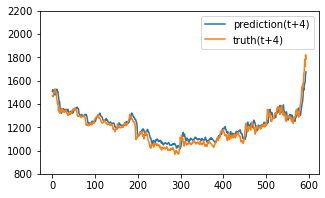

Test epoch:90 	Loss: 0.109232

Epoch: 91


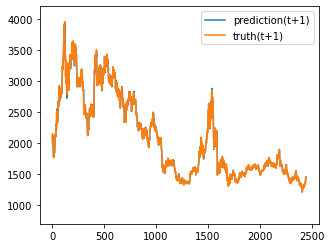

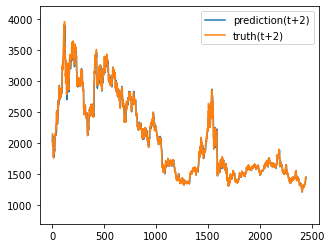

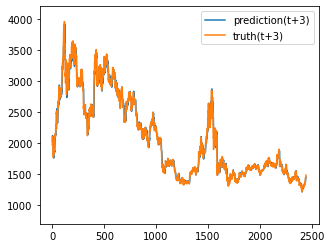

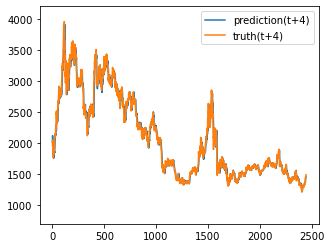

Train epoch:91 	Loss: -16.002814| Loss_in: 0.011991| Loss_out: 0.010893


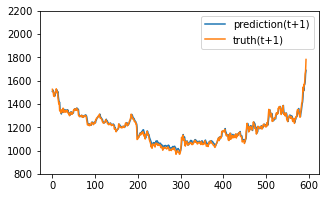

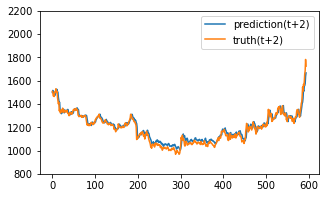

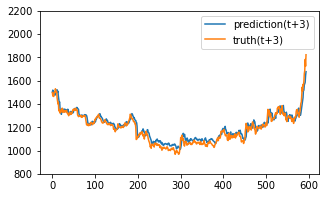

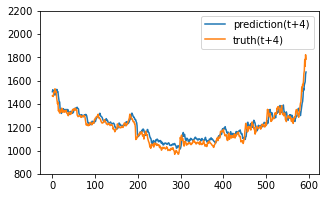

Test epoch:91 	Loss: 0.107896

Epoch: 92


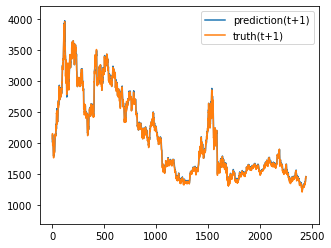

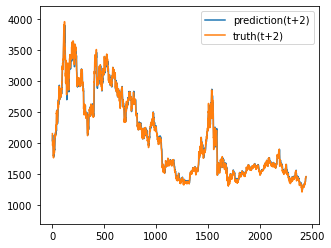

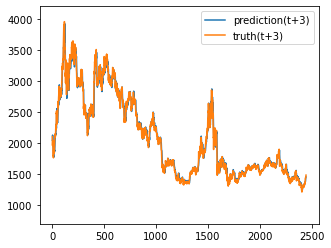

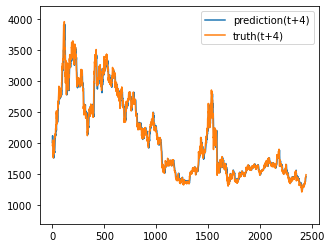

Train epoch:92 	Loss: -13.537214| Loss_in: 0.012118| Loss_out: 0.011227


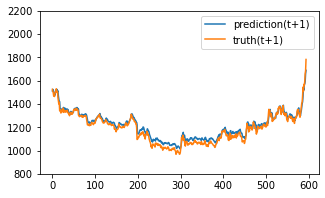

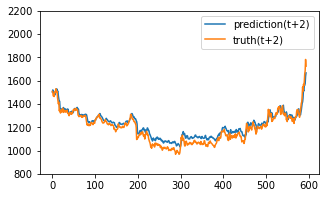

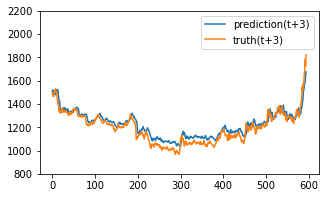

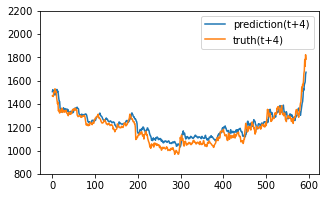

Test epoch:92 	Loss: 0.136596

Epoch: 93


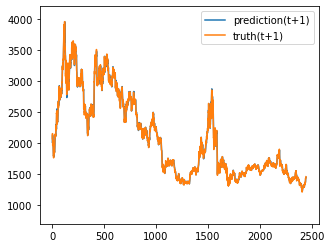

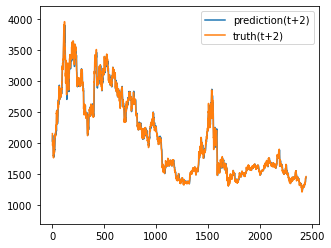

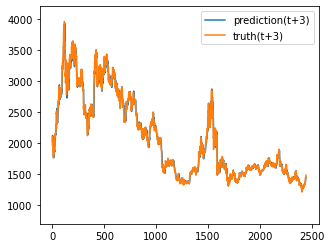

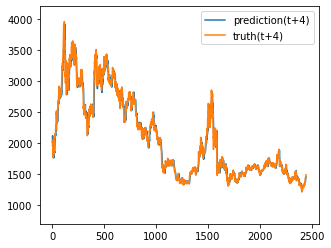

Train epoch:93 	Loss: -15.770338| Loss_in: 0.012054| Loss_out: 0.010617


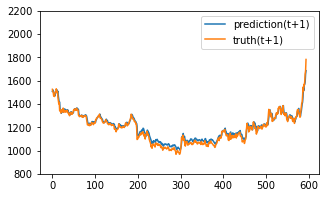

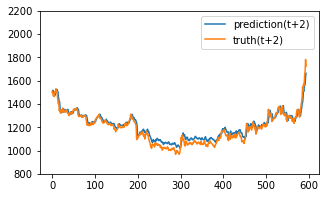

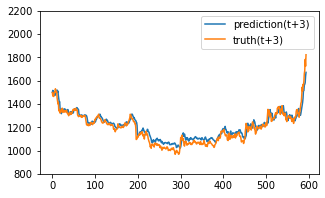

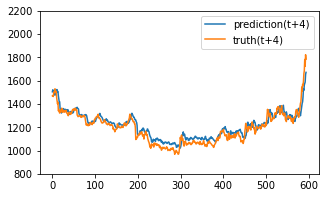

Test epoch:93 	Loss: 0.118884

Epoch: 94


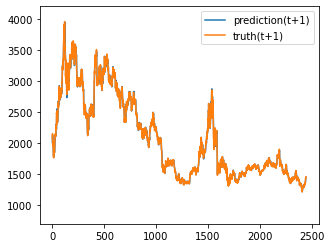

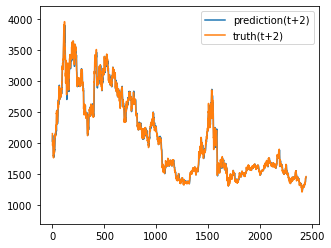

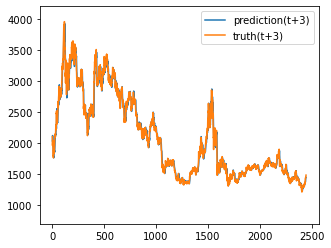

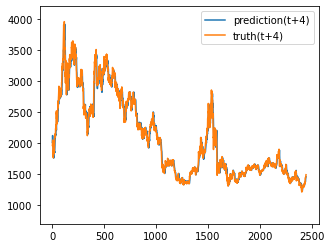

Train epoch:94 	Loss: -15.927032| Loss_in: 0.011820| Loss_out: 0.010999


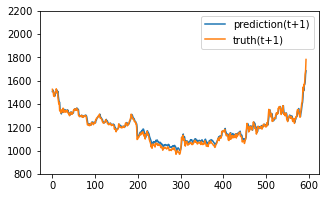

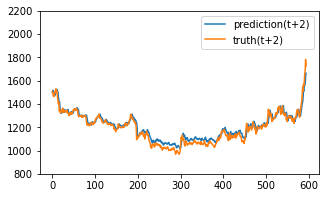

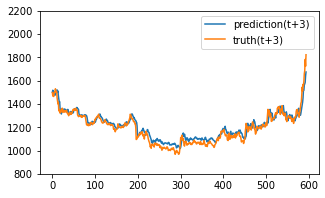

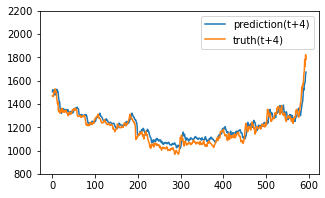

Test epoch:94 	Loss: 0.114303

Epoch: 95


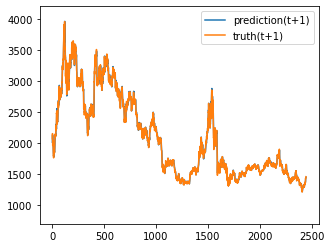

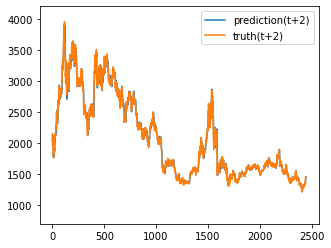

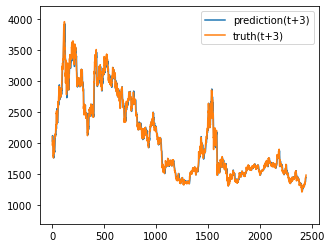

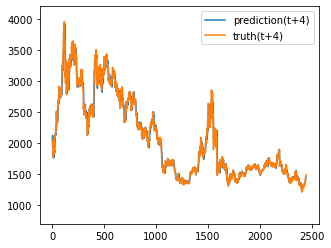

Train epoch:95 	Loss: -15.975087| Loss_in: 0.011805| Loss_out: 0.010855


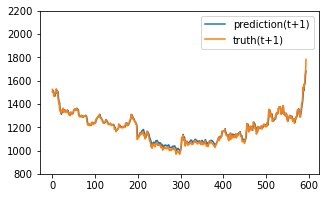

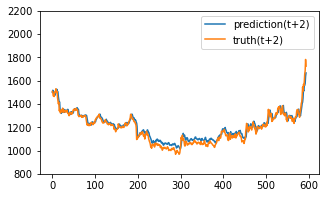

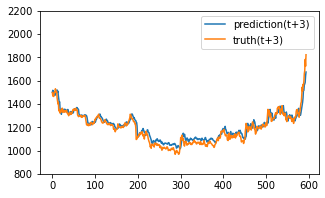

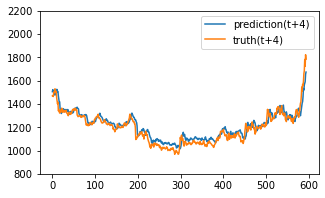

Test epoch:95 	Loss: 0.111994

Epoch: 96


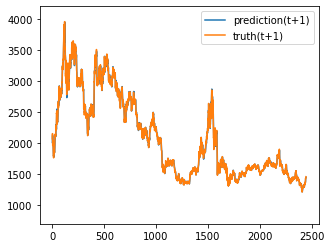

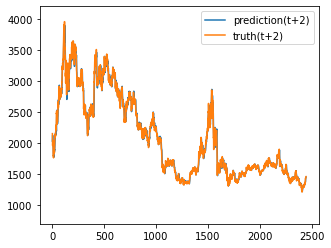

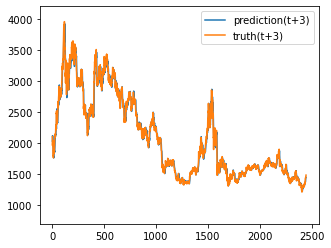

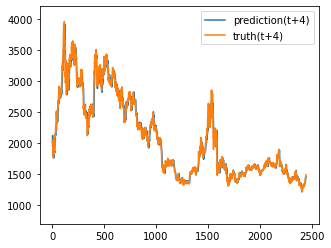

Train epoch:96 	Loss: -15.991776| Loss_in: 0.011737| Loss_out: 0.010815


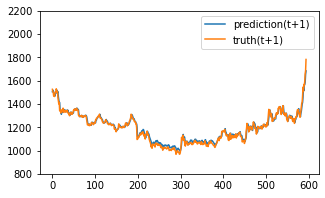

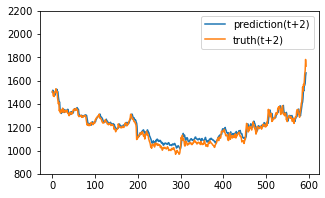

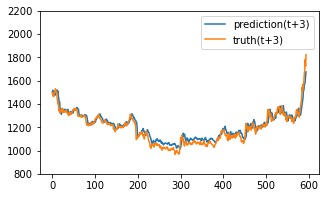

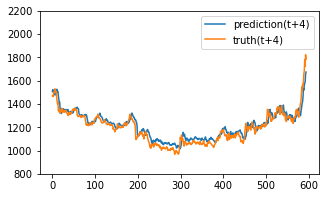

Test epoch:96 	Loss: 0.111880

Epoch: 97


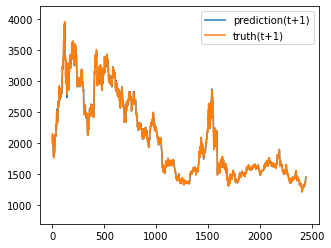

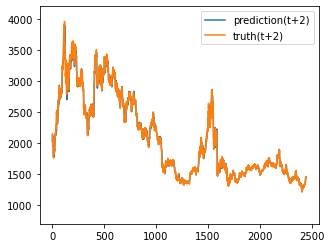

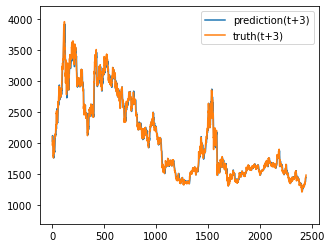

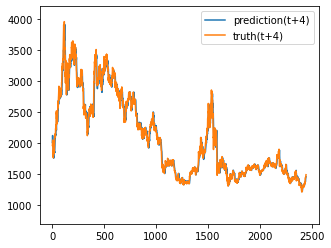

Train epoch:97 	Loss: -16.006743| Loss_in: 0.011708| Loss_out: 0.010451


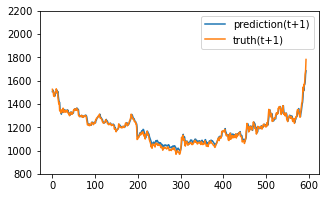

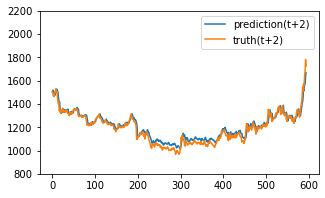

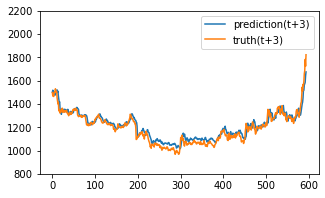

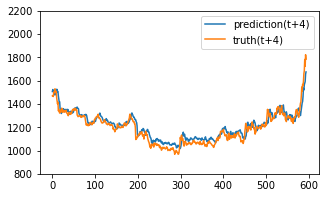

Test epoch:97 	Loss: 0.112755

Epoch: 98


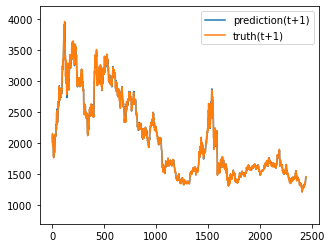

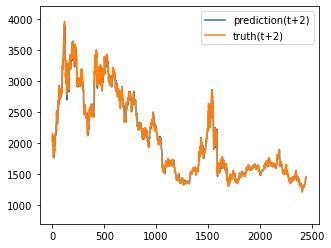

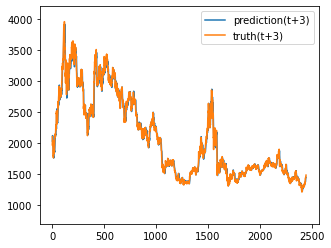

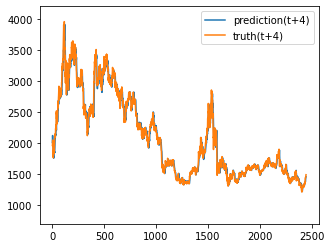

Train epoch:98 	Loss: -16.009758| Loss_in: 0.011628| Loss_out: 0.010792


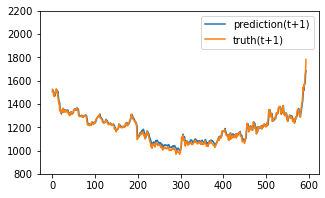

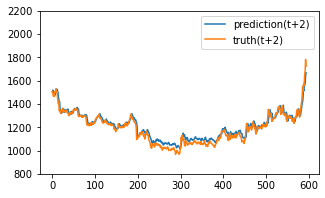

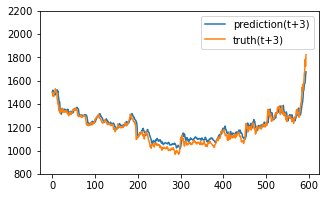

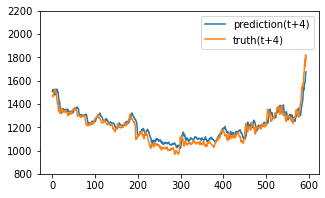

Test epoch:98 	Loss: 0.113978

Epoch: 99


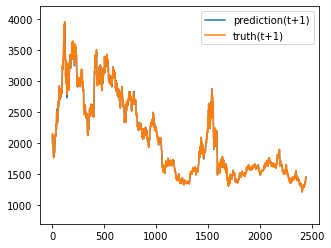

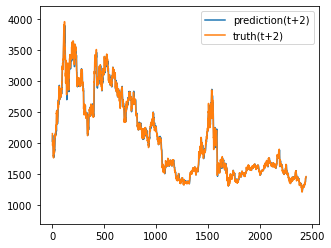

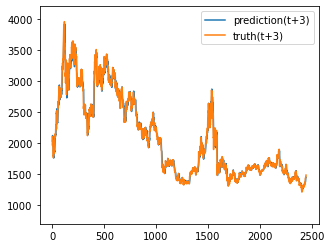

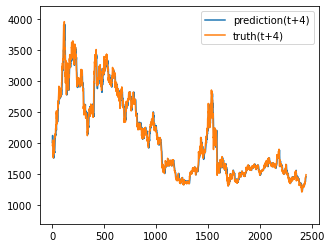

Train epoch:99 	Loss: -16.017667| Loss_in: 0.011666| Loss_out: 0.010855


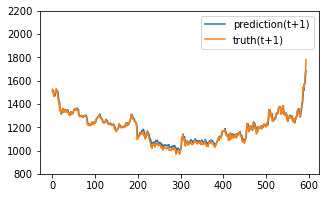

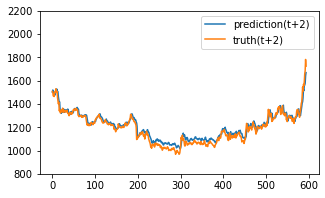

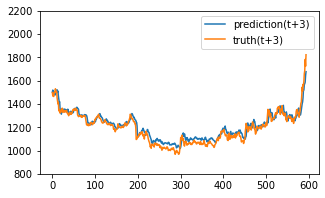

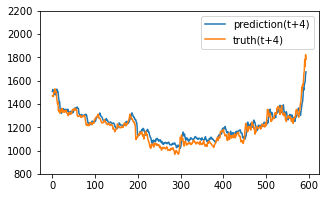

Test epoch:99 	Loss: 0.114054

Epoch: 100


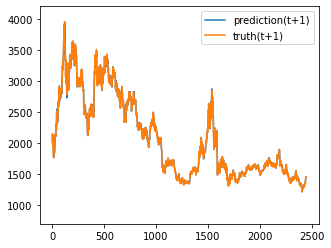

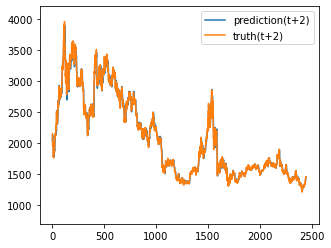

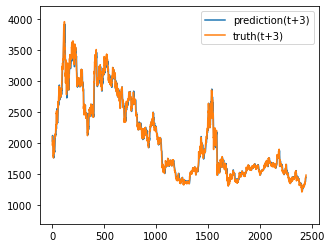

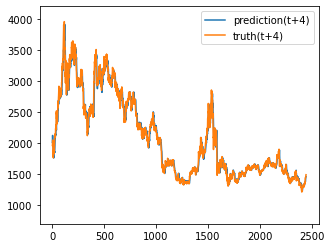

Train epoch:100 	Loss: -16.012225| Loss_in: 0.011629| Loss_out: 0.010656


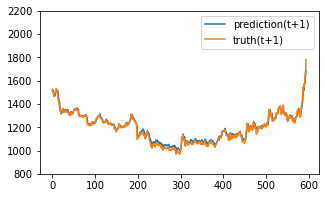

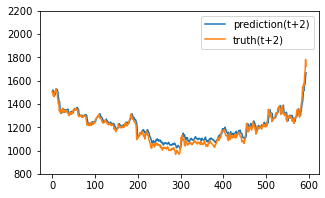

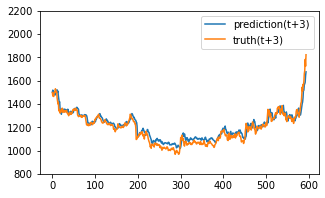

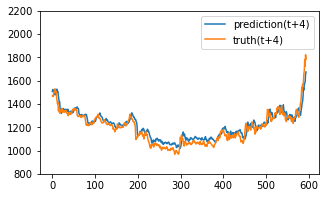

Test epoch:100 	Loss: 0.114813


In [51]:
path = os.path.join('/content/', 'output')
os.makedirs(path, exist_ok=True)
train_losses = []
test_losses = []
for epoch in range(1, args.epochs + 1):
    train_losses.append(train(epoch))
    test_losses.append(test(epoch))
    if epoch in args.decreasing_lr:
        for param_group in optimizer_F.param_groups:
            param_group['lr'] *= args.droprate

    if epoch in args.decreasing_lr2:
        for param_group in optimizer_G.param_groups:
            param_group['lr'] *= args.droprate

In [52]:
train_losses

[(0.08891003, 0.057835415, 0.043274444, 0.05126832),
 (0.044831757, 0.04625099, 0.04131047, 0.050134297),
 (0.036981795, 0.040260777, 0.033745386, 0.04349203),
 (0.029483614, 0.034361124, 0.029583491, 0.038712114),
 (0.022188032, 0.028703798, 0.025358532, 0.0346788),
 (0.017628757, 0.022350093, 0.023032028, 0.032116264),
 (0.013845339, 0.019751683, 0.021159334, 0.029900165),
 (0.07956358, 0.02324857, 0.021058613, 0.028925564),
 (0.011578295, 0.017350351, 0.019415578, 0.027664883),
 (0.009921959, 0.016070455, 0.018619254, 0.026657822),
 (0.008967961, 0.014699666, 0.018021258, 0.02583746),
 (0.008615319, 0.013924244, 0.01755068, 0.02506923),
 (0.0076723886, 0.013318334, 0.017283717, 0.024351155),
 (0.0071744435, 0.012557746, 0.016429046, 0.023449687),
 (0.0075524426, 0.014435914, 0.016494758, 0.023359725),
 (0.006739486, 0.012106207, 0.016029008, 0.02286262),
 (0.0063003395, 0.011606843, 0.015624776, 0.022187512),
 (0.0060090143, 0.01132942, 0.015404936, 0.021702401),
 (0.0058575897, 0.0

In [53]:
test_losses

[(0.19239967, 0.008406074, 0.008365134, 0.008739323),
 (0.021747982, 0.008162542, 0.010072004, 0.008594754),
 (0.00442379, 0.007395229, 0.011377283, 0.008443216),
 (0.0070715593, 0.006196981, 0.013352135, 0.008472028),
 (0.0023656352, 0.004641149, 0.006808587, 0.008632669),
 (0.0029760632, 0.004185777, 0.0045205606, 0.006301984),
 (0.002373558, 0.0045959493, 0.004546345, 0.0064954134),
 (0.3882735, 0.024529627, 0.0065929634, 0.010641604),
 (0.00208746, 0.0045332024, 0.006018199, 0.0063607534),
 (0.002951646, 0.003001984, 0.0066577895, 0.006803954),
 (0.0015894553, 0.0031281952, 0.0048064804, 0.006225647),
 (0.0016333166, 0.0025638626, 0.004021207, 0.0057447003),
 (0.0024415941, 0.0026775242, 0.0036536928, 0.00550307),
 (0.0015781291, 0.0023818153, 0.003470984, 0.0049186684),
 (0.0013104667, 0.0049405308, 0.0040986096, 0.0070096715),
 (0.0017211185, 0.0032629187, 0.0038439333, 0.00582448),
 (0.0017319416, 0.0026852658, 0.0037852474, 0.005380169),
 (0.0011629917, 0.0037925255, 0.00470497

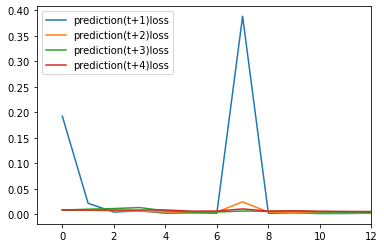

In [54]:
plt.plot(test_losses)
plt.xlim(-1,12)
plt.legend(('prediction(t+1)loss','prediction(t+2)loss','prediction(t+3)loss','prediction(t+4)loss'))
plt.show()

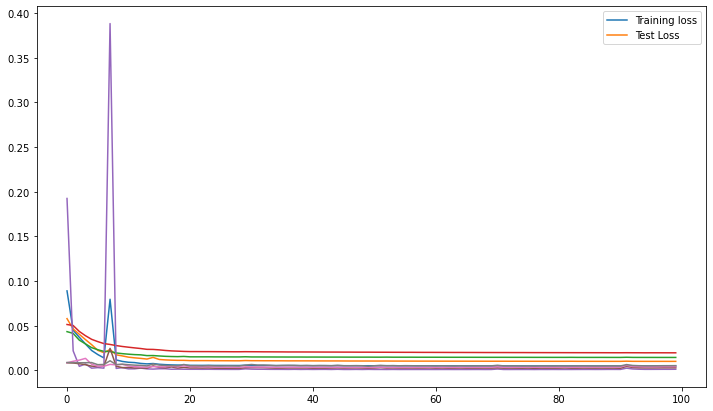

(0.0011555443, 0.0028272257, 0.003994071, 0.0052052154)


In [55]:
plt.figure(figsize=(12,7))
plt.plot(train_losses)
plt.plot(test_losses)
plt.legend(('Training loss','Test Loss'))
plt.savefig(os.path.join('/content/output/','Loss'), dpi=300)
plt.show()
print(test_losses[-1])

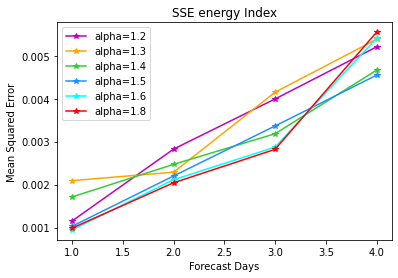

In [56]:
import matplotlib.pyplot as plt
plt.plot([1,2,3,4], [0.0011555443, 0.0028272257, 0.003994071, 0.0052052154],'*-',color='m',label='alpha=1.2',markersize=6)
plt.plot([1,2,3,4], [0.0020929305, 0.0022900107, 0.0041512847, 0.0053823357],'*-',color='orange',label='alpha=1.3',markersize=6)
plt.plot([1,2,3,4], [0.0017145886, 0.0024713876, 0.0031843106, 0.0046635303],'*-',color='limegreen',label='alpha=1.4',markersize=6)
plt.plot([1,2,3,4], [0.0010316855, 0.0022017362, 0.0033650268, 0.004547045],'*-',color='dodgerblue',label='alpha=1.5',markersize=6)
plt.plot([1,2,3,4], [0.0009455128, 0.0021150932, 0.0028728142, 0.0054027694],'*-',color='cyan',label='alpha=1.6',markersize=6)
plt.plot([1,2,3,4],[0.0009889686, 0.002042933, 0.002821054, 0.0055467105],'*-',color='r',label='alpha=1.8',markersize=6)
plt.xlabel("Forecast Days")
plt.ylabel("Mean Squared Error")
plt.title("SSE energy Index")
plt.legend()
plt.show()